<a href="https://colab.research.google.com/github/dongsikchoi/ML_Time-Series_EDA/blob/master/BG_Prediction_Univariate_Filter_X_01_25.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 필요 라이브러리 로드

In [1]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels.api as sm
import matplotlib

matplotlib.rcParams['axes.labelsize']=14
matplotlib.rcParams['xtick.labelsize']=12
matplotlib.rcParams['ytick.labelsize']=12
matplotlib.rcParams['text.color']='k'

In [2]:
#pip install rpy2

In [5]:
import pmdarima as pm
import pmdarima
import statsmodels
import seaborn as sns
#import rpy2
#import rpy2.robjects as robjects  ##R 함수를 쓰기위함
from tqdm import tqdm
#from rpy2.robjects import pandas2ri ##pandas를 R 데이터로 형식으로 변환하기 위함
#from rpy2.robjects.packages import importr #R 패키지를 import
from pmdarima.arima.stationarity import ADFTest #단위근검정 ADF_TEST
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf #AR값을 정하기위한 acf,pcaf
import warnings

In [6]:
warnings.filterwarnings("ignore")

print('Numpy: %s'%(np.__version__))
print('Pandas: %s'%(pd.__version__))
print('pmdarima: %s'%(pmdarima.__version__))
print('seaborn: %s'%(sns.__version__))
print('statsmodel: %s'%(statsmodels.__version__))
print('matplotlib: %s'%(matplotlib.__version__))
#print('rpy2: %s'%(rpy2.__version__))

Numpy: 1.18.1
Pandas: 1.1.3
pmdarima: 1.8.0
seaborn: 0.11.0
statsmodel: 0.12.2
matplotlib: 3.1.3


In [7]:
#utils = importr('utils') ##utils 패키지를 import
#utils.install_packages('forecast') ##R의 forecast패키지를 설치한다.
#utils.install_packages('forecastHybrid') #R의 forecastHybrid패키지 설치

In [8]:
# Colab
#from google.colab import auth
#auth.authenticate_user()

In [9]:
#from google.colab import drive
#drive.mount('/content/drive')

In [10]:
pd.set_option('display.max_columns',500) 
#출력시 생략 X

### 데이터셋 설정 

In [11]:
#df=pd.read_excel("BG_Dataset/BG_Sample7.xlsx")
df=pd.read_csv("BG_Dataset/BG_Sample32.csv")

In [12]:
df = df.reset_index()

In [13]:
# Colab
#pandas2ri.activate() ##모델링시 판다스를 R 데이터로 변환하기위해 activate 시켜야함
#df = pd.read_excel("/content/drive/MyDrive/BG_Dataset/BG_Sample52.xlsx")
#df = pd.read_csv("/content/drive/MyDrive/BG_Dataset/BG_Sample46.csv")


In [14]:
df.shape

(1952, 5)

In [15]:
df.head(13)

,index,Unnamed: 0,Timestamp,Event,Glucose
0,0,0,2020-07-23T11:00:04,교정,161.0
1,1,1,2020-07-23T11:05:27,교정,166.0
2,2,2,2020-07-23T20:28:15,교정,209.0
3,3,3,2020-07-23T20:29:14,EGV,182.0
4,4,4,2020-07-23T20:34:07,EGV,181.0
5,5,5,2020-07-23T20:39:08,EGV,185.0
6,6,6,2020-07-23T20:44:08,EGV,187.0
7,7,7,2020-07-23T20:49:08,EGV,190.0
8,8,8,2020-07-23T20:54:09,EGV,192.0
9,9,9,2020-07-23T20:59:08,EGV,195.0


In [16]:
import math
def fix_glucose_value(df,col):
    for i, row in df.iterrows():
        val = row[col]
        
        df.loc[i,col] = math.floor(val)

In [17]:
fix_glucose_value(df,'Glucose')

## ARIMA_15MIN

In [18]:
from sklearn.model_selection import train_test_split
raw_seq = df['Glucose']
raw_seq=raw_seq.to_numpy(dtype='int64')
TRAIN_SPLIT=int(len(raw_seq)*0.7)
uni_past_history=TRAIN_SPLIT - 3
uni_future_target= 3 
# 이거 -1이면 naive method 

train,test = train_test_split(raw_seq, train_size = TRAIN_SPLIT, shuffle=False)

In [19]:
len(raw_seq)

1952

In [20]:
from sklearn.metrics import mean_squared_error
def RMSE(y_test,y_predict):
    return np.sqrt(mean_squared_error(y_test,y_predict))

In [21]:
test.shape

(586,)

In [22]:
#df.head(10)

In [23]:
#raw_seq = df['Glucose']
#raw_seq=raw_seq.to_numpy(dtype='int64')
def ARIMA_split_15(dataset,start_index,end_index, history_size, target_size):
    data=[]
    labels=[]
    
    start_index= start_index+history_size
    if end_index is None:
    #if end_index > len(dataset)-1:
        end_index = len(dataset)-target_size
        
    for i in range(start_index,end_index):
        indices = range(i-history_size,i)
        
        data.append(np.reshape(dataset[indices],(history_size,1)))
        #data.append(np.reshape(dataset[indices],(history_size)))
        #labels.append(dataset[i+target_size])
    return np.array(data)





In [24]:
#TRAIN_SPLIT=int(len(raw_seq)*0.7)

In [25]:
uni_past_history

1363

In [26]:
raw_seq

array([161, 166, 209, ..., 298, 292, 292], dtype=int64)

In [27]:
uni_future_target

3

In [28]:
arima_train = ARIMA_split_15(raw_seq,0,None,
                                  uni_past_history,
                                  uni_future_target)

In [29]:
raw_seq[:10]

array([161, 166, 209, 182, 181, 185, 187, 190, 192, 195], dtype=int64)

In [30]:
arima_train.shape

(586, 1363, 1)

In [31]:
#x_train_uni_origin[1]

In [32]:
#x_val_uni_origin[0]

In [33]:
from pmdarima.arima import ndiffs

def param_d(data):
  kpss_diffs = ndiffs(data, alpha=0.05, test='kpss', max_d=6)
  adf_diffs = ndiffs(data, alpha=0.05, test='adf', max_d=6)
  n_diffs = max(adf_diffs, kpss_diffs)
  return n_diffs
  #print(f"Estimated differencing term: {n_diffs}")
# Estimated differencing term: 1

In [34]:
def model_auto(data):
  auto = pm.auto_arima(data, d=n_diffs, start_p=1,start_q=1,start_Q=1,max_p=5,max_q=5,max_P=5,max_Q=5,
                      seasonal=False, stepwise=True,
                       suppress_warnings=True, error_action="ignore",
                       max_order=None, trace=True)
  return auto

In [35]:
from sklearn.metrics import mean_squared_error
from pmdarima.metrics import smape
from pmdarima import model_selection

In [36]:
#auto = pm.auto_arima(arima_train[0], d=n_diffs, start_p=1,start_q=1,start_Q=1,max_p=5,max_q=5,max_P=5,max_Q=5,
#                      seasonal=False, stepwise=True,
#                       suppress_warnings=True, error_action="ignore",
#                       max_order=None, trace=True)

In [37]:
#model=auto

In [38]:
#fc = model.predict(n_periods=3,verbose=1)

In [39]:
#forecasts.append(fc[2])

In [40]:
#forecasts

In [41]:
count = 1 
forecasts = []
for i in range(len(arima_train)):
  n_diffs = param_d(arima_train[i])

  model = model_auto(arima_train[i])
  fc = model.predict(n_periods=3,verbose=1)
  forecasts.append(fc[2])
  print("-----")
  print(count)
  print("-----")
  print("appended :",fc[2])
  print("array :",forecasts)
  count+=1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9383.409, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9527.953, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9410.341, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9392.649, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9525.982, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9380.127, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9409.062, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9350.735, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9348.787, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9350.766, Time=0.47 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9350.997, Time=0.99 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9346.799, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9407.078, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9348.778, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9321.222, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9488.618, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9352.216, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9329.019, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9486.619, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9316.898, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9349.688, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9288.634, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9286.634, Time=0.27 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9288.634, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9288.347, Time=0.94 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9284.634, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9347.689, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9286.634, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9286.634, Time=0.23 sec
 ARIMA(2,1

 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9287.500, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9287.500, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9315.688, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9287.236, Time=0.37 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 4.005 seconds
-----
12
-----
appended : 186.50434784573443
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443]
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9322.027, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9488.844, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9353.009, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9329.877, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9486.845, Time=0.02 sec
 ARIMA(

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9320.127, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9486.370, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9351.411, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9328.225, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9484.372, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9315.910, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9348.825, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9287.503, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9285.508, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9287.506, Time=0.35 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9287.221, Time=0.92 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9283.510, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9346.826, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9285.508, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9285.505, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9317.456, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9483.553, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9349.253, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9325.817, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9481.555, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9313.389, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9346.540, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.190, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9283.194, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9285.193, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9284.877, Time=0.74 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9281.195, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9344.541, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9283.193, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9283.190, Time=0.35 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9317.321, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9483.390, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9349.108, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9325.682, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9481.392, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9313.252, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9346.398, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.045, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9283.050, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9285.048, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9284.732, Time=1.06 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9281.051, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9344.400, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9283.049, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9283.046, Time=0.34 sec
 ARIMA(2,1

 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9283.127, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9283.124, Time=0.33 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9311.321, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9282.807, Time=0.36 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.899 seconds
-----
32
-----
appended : 174.61035011573216
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216]
Performing s

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9317.644, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9483.917, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9349.357, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9325.962, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9481.927, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9313.523, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9346.683, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.236, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9283.241, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9285.239, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9284.915, Time=0.93 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9281.246, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9344.689, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9283.244, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9283.241, Time=0.33 sec
 ARIMA(2,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9326.185, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9482.089, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9313.763, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9346.875, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.382, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9283.388, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9285.386, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9285.079, Time=0.96 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9281.392, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9344.882, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9283.390, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9283.386, Time=0.30 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9311.770, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9283.083, Time=0.41 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.902 seconds

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9317.923, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9484.203, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9349.475, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9326.166, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9482.235, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9313.770, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9346.852, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.310, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9283.317, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9285.314, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9285.021, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9281.330, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9344.872, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9283.327, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9283.323, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9318.398, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9484.773, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9349.909, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9326.622, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9482.818, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9314.214, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9347.309, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.691, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9283.698, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9285.696, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9285.398, Time=0.93 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9281.717, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9345.336, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9283.715, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9283.710, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9319.630, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9486.424, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9351.186, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9327.791, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9484.453, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9315.457, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9348.546, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9287.050, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9285.054, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9287.052, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9286.757, Time=1.10 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9283.063, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9346.561, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9285.061, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9285.058, Time=0.32 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9325.034, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9494.493, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9355.710, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9332.594, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9492.501, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9320.306, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9353.443, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9290.723, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9288.735, Time=0.27 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9290.730, Time=0.35 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9290.439, Time=1.11 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9286.739, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9351.447, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9288.734, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9288.726, Time=0.22 sec
 ARIMA(2,1

 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9288.567, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9319.040, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9288.339, Time=0.34 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.910 seconds
-----
70
-----
appended : 245.3713834302819
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 16

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9326.415, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9496.591, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9356.569, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9333.741, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9494.702, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9321.433, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9354.545, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9290.760, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9288.795, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9290.782, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9290.565, Time=0.83 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9286.839, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9352.611, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9288.826, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9288.803, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9326.642, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9496.898, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9356.801, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9333.957, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9495.007, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9321.644, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9354.771, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9291.079, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9289.111, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9291.099, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9290.860, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9287.153, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9352.834, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9289.141, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9289.120, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9327.037, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9496.787, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9356.995, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9334.363, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9494.878, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9321.984, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.038, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9291.338, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9289.372, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9291.360, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9291.112, Time=0.94 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9287.404, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9353.089, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9289.391, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9289.370, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9327.186, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9496.801, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9357.002, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9334.421, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9494.894, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9322.132, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.049, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9291.455, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9289.495, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9291.480, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9291.277, Time=1.04 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9287.529, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9353.103, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9289.513, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9289.488, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9328.500, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9498.268, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9358.301, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9335.709, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9496.338, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9323.397, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9356.350, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9292.844, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9290.883, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9292.868, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9292.631, Time=1.10 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9288.903, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9354.386, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9290.888, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9290.863, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9328.876, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.037, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9358.523, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9335.997, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9497.092, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9323.686, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9356.620, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9293.050, Time=0.52 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9291.087, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9293.073, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9292.831, Time=0.93 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9289.104, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9354.651, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9291.090, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9291.066, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9329.101, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.381, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9358.746, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9336.215, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9497.428, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9323.888, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9356.857, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9293.160, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9291.199, Time=0.24 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9293.184, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9292.936, Time=1.02 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9289.213, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9354.882, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9291.198, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9291.174, Time=0.23 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9329.543, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.967, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9359.094, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9336.605, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9498.005, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9324.259, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9357.224, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9293.541, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9291.584, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9293.568, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9293.307, Time=0.95 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9289.596, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9355.245, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9291.579, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9291.552, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9330.706, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9501.567, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9360.182, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9337.677, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9499.589, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9325.381, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9358.332, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9294.434, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9292.493, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9294.471, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9294.253, Time=0.87 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9290.499, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9356.344, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9292.477, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9292.440, Time=0.23 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9333.154, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9505.372, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.424, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9339.973, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9503.375, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9327.589, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9360.709, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9296.173, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9294.224, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9296.205, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9295.927, Time=0.90 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9292.224, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9358.711, Time=0.05 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9294.205, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9294.173, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9331.898, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9505.215, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9361.384, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9338.745, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9503.216, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9326.170, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9359.675, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9294.594, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9292.644, Time=0.28 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9294.626, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9294.248, Time=1.02 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9290.644, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9357.675, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9292.626, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9292.594, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9332.761, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9506.379, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.322, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9339.643, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9504.380, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9326.978, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9360.621, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9295.334, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9293.393, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9295.371, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9294.956, Time=0.77 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9291.393, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9358.621, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9293.371, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9293.334, Time=0.23 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9516.141, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9619.915, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9530.470, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9522.537, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9617.918, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9512.643, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9531.741, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.167, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.102, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.352, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.327, Time=0.78 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9478.103, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9529.742, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9479.352, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9478.167, Time=0.18 sec
 ARIMA(2,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9529.632, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9497.081, Time=0.58 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9496.207, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9499.299, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9497.566, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9537.171, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9498.515, Time=0.25 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9498.775, Time=1.20 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9494.208, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9527.632, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9497.300, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9495.567, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9495.082, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9535.171, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9498.823, Time=0.23 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9496.350, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9499.527, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9497.718, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9537.505, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9498.694, Time=0.25 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9499.093, Time=1.21 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9494.351, Time=0.23 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9528.464, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9497.528, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9495.719, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9495.273, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9535.506, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9499.531, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9496.695, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9497.094, Time=0.42 sec

Best mode

 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9499.565, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9497.728, Time=0.60 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9537.560, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9498.706, Time=0.36 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9499.111, Time=1.02 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9494.355, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9528.565, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9497.566, Time=0.11 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9495.729, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9495.289, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9535.562, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9499.568, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9496.707, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9497.112, Time=0.43 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.231 seconds

 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9499.581, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9497.774, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9537.975, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9498.789, Time=0.28 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9499.119, Time=0.90 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9494.448, Time=0.23 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9528.848, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9497.585, Time=0.12 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9495.778, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9495.306, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9535.980, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9499.653, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9496.793, Time=0.15 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9497.123, Time=0.40 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.478 seconds

 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9487.165, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9486.416, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.414, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9487.685, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9528.455, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9488.733, Time=0.32 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9488.979, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9484.436, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9518.743, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9487.435, Time=0.06 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9485.705, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9485.185, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9526.479, Time=0.04 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9489.394, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9486.753, Time=0.10 sec
 ARIMA(4,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9522.394, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9613.202, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9524.242, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9503.283, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.936, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9518.585, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.734, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9484.003, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9487.048, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.260, Time=0.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9526.366, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9486.346, Time=0.24 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9486.547, Time=0.97 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9482.019, Time=0.31 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9516.608, Time=0.17 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9525.922, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9617.299, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9526.594, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9524.538, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9615.319, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9526.379, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9505.911, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9491.620, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9520.752, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9487.432, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9486.671, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.517, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9487.949, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9528.578, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9488.899, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9532.417, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9626.632, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9532.772, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9530.852, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9624.632, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9532.741, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9512.614, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9498.654, Time=0.64 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9527.034, Time=0.47 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9494.745, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9493.921, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9496.310, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9495.255, Time=0.68 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9534.757, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9495.893, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9534.312, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9629.590, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9534.110, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9532.601, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9627.592, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9534.532, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9513.677, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9499.733, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9528.635, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9495.652, Time=0.49 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9494.741, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9497.058, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9496.127, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9536.109, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9496.621, Time=0.36 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9534.625, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9630.140, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9534.340, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9532.896, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9628.145, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9534.832, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9513.747, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9499.799, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9528.914, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9495.697, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9494.789, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9497.092, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9496.169, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9536.340, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9496.649, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9531.686, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9627.593, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9531.390, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9529.947, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9625.610, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9531.885, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9509.887, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9495.856, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9525.902, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9491.916, Time=0.50 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9491.108, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9493.756, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9492.400, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9533.390, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9493.169, Time=0.33 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9531.759, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9627.717, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9531.495, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9530.024, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9625.726, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9531.961, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9510.234, Time=0.25 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9496.198, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9525.981, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9492.238, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9491.389, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9493.975, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9492.717, Time=1.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9533.494, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9493.407, Time=0.28 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9531.500, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9627.070, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9531.368, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9529.781, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9625.070, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9531.712, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9510.705, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9496.763, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9525.865, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9492.702, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9491.768, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9494.283, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9493.155, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9533.365, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9493.722, Time=0.42 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9529.861, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9623.554, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9530.026, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9528.249, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9621.564, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9530.152, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9510.331, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9496.421, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9524.414, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9492.303, Time=0.70 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9491.320, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9493.525, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9492.752, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9532.017, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9493.121, Time=0.33 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9524.174, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9617.594, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9525.026, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9522.734, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9615.643, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9524.581, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9506.393, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9492.544, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9519.068, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9488.481, Time=0.53 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9487.446, Time=0.35 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.359, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9488.916, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9526.984, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9489.098, Time=0.40 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9519.151, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9610.736, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9520.507, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9517.895, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9608.854, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9519.683, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.777, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.992, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9514.369, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9485.025, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9483.994, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.642, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.459, Time=0.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9522.431, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9485.531, Time=0.30 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9516.780, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9607.246, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9518.497, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9515.659, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9605.424, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9517.401, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9501.205, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9487.455, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9512.233, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9483.525, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9482.497, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9484.105, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9483.961, Time=0.93 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9520.389, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.028, Time=0.32 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9514.358, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9603.908, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9516.317, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.347, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9602.149, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9515.052, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.232, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.422, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.957, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.416, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.374, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.996, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.848, Time=1.06 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9518.189, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.909, Time=0.38 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.339, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.698, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.339, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.351, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.977, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.049, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.344, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.521, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.964, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.488, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.441, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.046, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.920, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.209, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.968, Time=0.28 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.339, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.698, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.345, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.353, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.977, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.050, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.380, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.557, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.968, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.511, Time=0.72 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.458, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.057, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.941, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.214, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.980, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.335, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.643, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.333, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.346, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.932, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.044, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.389, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.577, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.968, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.534, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.479, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.079, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.964, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.202, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.002, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.441, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.710, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.435, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.453, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.021, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.151, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.504, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.701, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.072, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.675, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.623, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.204, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.106, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.305, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.138, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.155, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.535, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.145, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.161, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.858, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.860, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.219, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.427, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.784, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.406, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.353, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.921, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.837, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.014, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.862, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.047, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.353, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.065, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.066, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.695, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.761, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.148, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.348, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.689, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.338, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.295, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.853, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.772, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.932, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.803, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.974, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.243, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.009, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.000, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.620, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.693, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.063, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.255, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.627, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.248, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.218, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.799, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.687, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.874, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.744, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.942, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.218, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.979, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.971, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.620, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.663, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9497.990, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.154, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.588, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.120, Time=0.69 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.087, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.695, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.558, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.845, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.625, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.939, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.240, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.958, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.962, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.650, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.656, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9497.953, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.117, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.574, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.085, Time=0.81 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.052, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.661, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.524, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.827, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.590, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.431, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.559, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.455, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.463, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.937, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.155, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9497.454, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9483.610, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.075, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.577, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.550, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.170, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.019, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.324, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.098, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.363, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.519, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.401, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.399, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.892, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.090, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9497.397, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9483.544, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.009, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.510, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.484, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.108, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.953, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.268, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.034, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.328, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.486, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.362, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.364, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.848, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.055, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9497.363, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9483.507, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.970, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.469, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.442, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.055, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.911, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.230, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9479.986, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.792, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.992, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.810, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.824, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.318, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.517, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.863, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.021, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.429, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.985, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.954, Time=0.68 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.527, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.427, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.680, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.476, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.756, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.962, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.821, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.796, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.289, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.485, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.896, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.064, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.416, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.037, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.000, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.597, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.475, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.684, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.534, Time=0.28 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9514.178, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9603.300, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9516.244, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.227, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.630, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.914, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.342, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.477, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.809, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.528, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.530, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.107, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.991, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9518.108, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.077, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9514.141, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9603.330, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9516.239, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.198, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.660, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.882, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.300, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.436, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.791, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.489, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.505, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.067, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.950, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9518.099, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.048, Time=0.22 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9514.181, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9603.397, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9516.257, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.226, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.719, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.913, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.281, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.443, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.827, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.515, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.529, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.098, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.974, Time=0.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9518.118, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.074, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.908, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.929, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.779, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.879, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.244, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.592, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.894, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.202, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.523, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.323, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.326, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.887, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.777, Time=0.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.656, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.865, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9511.591, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.075, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.485, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.555, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.387, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9512.269, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9496.504, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9482.776, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.178, Time=0.52 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9478.905, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9477.909, Time=0.64 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9479.472, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.357, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.359, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9479.445, Time=0.34 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9511.590, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.034, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.533, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.568, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.342, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9512.276, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9496.687, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9482.992, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.212, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.117, Time=0.70 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.099, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9479.615, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.562, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.401, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9479.604, Time=0.37 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9511.527, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.934, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.483, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.510, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.238, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9512.216, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9496.718, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9483.037, Time=0.51 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.158, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.167, Time=0.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.144, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9479.604, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.608, Time=0.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.350, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9479.619, Time=0.39 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9511.185, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.461, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.213, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.190, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.748, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9511.887, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9496.519, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9482.865, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9506.866, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.035, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.020, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9479.494, Time=0.28 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.481, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.069, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9479.510, Time=0.35 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.938, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9599.802, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.053, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.994, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.078, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9511.676, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9496.239, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9482.504, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9506.680, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9478.564, Time=0.52 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9477.543, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9479.100, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.004, Time=0.95 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9514.907, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9479.065, Time=0.29 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9509.921, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9598.750, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9511.909, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9508.941, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9597.006, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9510.638, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9494.992, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9481.244, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.581, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9477.367, Time=0.78 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9476.363, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9477.900, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9477.808, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.777, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9477.872, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.511, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.747, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.603, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.544, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.952, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.232, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.067, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.416, Time=0.50 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.201, Time=0.51 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.646, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.633, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.950, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.094, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.454, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.041, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.573, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9603.485, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9515.420, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.489, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9601.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.216, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.936, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.427, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9509.139, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.735, Time=0.72 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.679, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.963, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9482.167, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9517.287, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.061, Time=0.37 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9514.730, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9604.953, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9516.421, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.632, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9603.069, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9515.370, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.648, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.917, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9510.196, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.832, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.715, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.056, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9482.248, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9518.321, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.085, Time=0.32 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.309, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.858, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9512.004, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.168, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.986, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9510.913, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9494.421, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9480.660, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.876, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9476.280, Time=0.58 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9475.113, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9477.172, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9476.670, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.898, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9476.818, Time=0.28 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9511.622, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.282, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9512.854, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.344, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.398, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9512.139, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9494.457, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9480.640, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.029, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9476.002, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9474.823, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9477.307, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9476.376, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9514.791, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9476.708, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.295, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9604.236, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.174, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.898, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9602.298, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.731, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9495.208, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9481.480, Time=0.50 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.608, Time=0.50 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9476.743, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9475.538, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9478.243, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9477.089, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.134, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9477.488, Time=0.42 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9512.125, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9602.292, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.210, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.833, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9600.323, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9512.637, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9494.435, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9480.504, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.428, Time=0.53 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9475.882, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9474.766, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9477.292, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9476.269, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.164, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9476.687, Time=0.43 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9511.950, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.852, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.078, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.674, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.878, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9512.474, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9494.534, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9480.617, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.277, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9476.052, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9474.934, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9477.401, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9476.446, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.027, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9476.831, Time=0.33 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.446, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.226, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9511.473, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.146, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.242, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9510.954, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9493.050, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9479.113, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.716, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9474.457, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.287, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.735, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.840, Time=0.77 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.430, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.156, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.391, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.147, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9511.440, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.094, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.167, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9510.901, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9492.999, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9479.090, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.686, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9474.435, Time=0.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.269, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.733, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.817, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.394, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.148, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.377, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.116, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9511.424, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.081, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.138, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9510.888, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9492.966, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9479.049, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.674, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9474.389, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.225, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.703, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.771, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.379, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.112, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.594, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.320, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9511.646, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.301, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.346, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9511.107, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9493.183, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9479.244, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.885, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9474.580, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.424, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.908, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.966, Time=0.69 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.601, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.319, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.574, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.217, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9511.604, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.277, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.242, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9511.084, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9493.162, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9479.226, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.858, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9474.560, Time=0.78 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.401, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.874, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.944, Time=0.95 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.561, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.288, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9510.722, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.480, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9511.712, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.409, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.510, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9511.221, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9493.254, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9479.325, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9505.989, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9474.641, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.474, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.942, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9475.021, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.671, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.350, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.001, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.038, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9520.917, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9518.703, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.096, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9520.516, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.516, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.562, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.262, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9483.875, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9482.709, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.231, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.264, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9522.884, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.621, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.706, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.576, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9521.454, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9519.367, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.642, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9521.196, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.804, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.758, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.824, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.047, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9482.877, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.409, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.435, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9523.431, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.787, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.687, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.563, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9521.445, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9519.351, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.628, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9521.178, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.855, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.816, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.818, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.083, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9482.921, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.403, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.472, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9523.421, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.802, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.707, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.567, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9521.470, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9519.372, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.628, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9521.199, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.911, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.861, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.823, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.170, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9483.000, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.477, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.559, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9523.446, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.874, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.826, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.668, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9521.578, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9519.486, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.731, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9521.314, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.979, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.942, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.932, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.304, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9483.149, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.640, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.697, Time=0.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9523.554, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9485.037, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9521.689, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9610.875, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9522.400, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.326, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9608.957, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9522.161, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9503.698, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9489.694, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9516.770, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9485.134, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9484.001, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9486.466, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.532, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9524.377, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9485.881, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9522.206, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9611.555, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9522.818, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.813, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9609.651, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9522.658, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9503.973, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9489.962, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9517.229, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9485.382, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9484.245, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9486.725, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.778, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9524.799, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9486.124, Time=0.39 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9522.454, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9611.837, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9523.003, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9521.042, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9609.946, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9522.892, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9504.085, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9490.082, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9517.450, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9485.502, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9484.364, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9486.875, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.898, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9524.987, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9486.258, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9522.415, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9611.819, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9522.945, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.996, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9609.946, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9522.848, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9503.983, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9489.991, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9517.407, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9485.414, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9484.273, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9486.796, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.808, Time=0.67 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9524.930, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9486.169, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9522.537, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9611.999, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9523.060, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9521.117, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9610.137, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9522.970, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9504.035, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9490.031, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9517.517, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9485.459, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9484.324, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9486.864, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.855, Time=0.71 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9525.045, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9486.232, Time=0.23 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9485.261, Time=0.68 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.333 seconds
-----
247
-----
appended : 86.62456811454537
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.35851667881312, 157.8812462989215, 154.72621840374816, 152.775514283652

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9522.572, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9612.055, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9523.085, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9521.150, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9610.211, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9523.003, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9503.983, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9489.952, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9517.532, Time=0.49 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9485.400, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9484.280, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9486.851, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9485.803, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9525.070, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9486.211, Time=0.23 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9485.153, Time=0.58 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.527 seconds
-----
250
-----
appended : 83.60154156828473
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.35851667881312, 157.8812462989215, 154.72621840374816, 152.775514283652

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9525.045, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9614.788, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9525.621, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.627, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9612.907, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9525.477, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9506.705, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9492.693, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9520.037, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9488.093, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9486.945, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.501, Time=0.35 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9488.487, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9527.603, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9488.859, Time=0.34 sec
 ARIMA(4,1

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9492.009, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9488.232, Time=0.14 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9489.222, Time=0.60 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.021 seconds
-----
253
-----
appended : 122.12487868384814
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9525.208, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9615.455, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9525.745, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.765, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9613.511, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9525.622, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9506.985, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9493.052, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9520.155, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9488.634, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9487.530, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.867, Time=0.15 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9489.043, Time=0.68 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9527.726, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9489.362, Time=0.30 sec
 ARIMA(4,1

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9490.878, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9487.445, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9488.437, Time=0.61 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.545 seconds
-----
256
-----
appended : 116.75836604598042
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9524.902, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9615.147, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9525.410, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.438, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9613.202, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9525.300, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9506.837, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9493.075, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9519.862, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9488.907, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9487.839, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.994, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9489.326, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9527.390, Time=0.09 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9489.597, Time=0.28 sec
 ARIMA(4,1

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9490.071, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9486.639, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9487.685, Time=0.54 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.541 seconds
-----
259
-----
appended : 102.99159256857092
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9524.208, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9614.614, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9524.648, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9522.724, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9612.672, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9524.592, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9505.866, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9492.093, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9519.131, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9487.922, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9486.874, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.094, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9488.346, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9526.631, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9488.675, Time=0.34 sec
 ARIMA(4,1

 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9485.947, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9524.736, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9490.156, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9486.705, Time=0.07 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9487.715, Time=0.52 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.795 seconds
-----
262
-----
appended : 92.49789871965893
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.2

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9524.515, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9615.002, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9524.923, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.023, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9613.084, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9524.894, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9506.051, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9492.249, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9519.425, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9487.998, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9486.934, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9489.218, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9488.416, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9526.908, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9488.755, Time=0.30 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9485.906, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9485.485, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9524.518, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9489.809, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9486.260, Time=0.07 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9487.244, Time=0.54 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.199 seconds
-----
265
-----
appended : 81.23134410963523
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.746, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9610.092, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9521.230, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9519.311, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9608.278, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9521.168, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.598, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.692, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.725, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.237, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9483.138, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.437, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.646, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9523.215, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.957, Time=0.24 sec
 ARIMA(4,1

 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9483.556, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9482.742, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9482.331, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9521.386, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9486.782, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9483.066, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9484.086, Time=0.58 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.599 seconds
-----
268
-----
appended : 70.36011636174781
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.862, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9610.292, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9521.323, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9519.420, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9608.514, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9521.279, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.642, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.723, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.822, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.260, Time=0.82 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9483.161, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.471, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.669, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9523.309, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.984, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.766, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9610.183, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9521.239, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9519.328, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9608.440, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9521.186, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.598, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.676, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.725, Time=0.29 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9484.221, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9483.122, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9485.424, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.630, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9523.225, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.941, Time=0.34 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9481.145, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9513.784, Time=0.15 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9483.468, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9482.658, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9482.254, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9521.266, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9486.715, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9482.965, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9484.006, Time=0.46 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.562 seconds
-----
274
-----
appended : 61.51717021621816
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.093, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.033, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9520.626, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9518.683, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.347, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9520.534, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9502.247, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9488.344, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9515.099, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9483.900, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9482.800, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9484.992, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9484.310, Time=0.65 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9522.609, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9484.568, Time=0.31 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9485.245, Time=1.21 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9480.478, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9512.647, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9482.697, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9481.998, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9481.598, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9520.177, Time=0.05 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9486.031, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9482.250, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9483.350, Time=0.53 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.380 seconds
-----
277
-----
appended : 64.12348277121147
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9518.630, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9607.339, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9519.170, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9517.212, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9605.691, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9519.064, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9501.014, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9487.240, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9513.704, Time=0.30 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9482.846, Time=0.85 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9481.723, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9483.891, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9483.249, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9521.151, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9483.477, Time=0.38 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9483.706, Time=1.23 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9478.945, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9510.797, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9481.125, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9480.480, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9480.080, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9518.262, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9484.430, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9480.701, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9481.822, Time=0.58 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.780 seconds
-----
280
-----
appended : 73.33981085460421
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9517.368, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9606.170, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9517.967, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9515.960, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9604.551, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9517.808, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.974, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9486.222, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9512.454, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.879, Time=0.46 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.745, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.880, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9482.281, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.944, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.483, Time=0.33 sec
 ARIMA(4,1

 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.123, Time=0.24 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9483.265, Time=1.28 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9478.521, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9510.262, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9480.676, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9480.053, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9479.650, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9517.706, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9483.969, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9480.273, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9481.394, Time=0.58 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.659 seconds
-----
283
-----
appended : 75.43468099096421
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9517.131, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9605.944, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9517.740, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9515.721, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9604.329, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9517.569, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.775, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9486.055, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9512.239, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.720, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.584, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.741, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9482.122, Time=0.68 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.716, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.337, Time=0.23 sec
 ARIMA(4,1

 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9482.078, Time=0.21 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9483.235, Time=1.10 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9478.486, Time=0.30 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9510.271, Time=0.15 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9480.662, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9480.031, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9479.636, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9517.774, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9484.007, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9480.236, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9481.373, Time=0.63 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.688 seconds
-----
286
-----
appended : 79.99682460290336
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9516.749, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9605.428, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9517.391, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9515.356, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9603.854, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9517.199, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.460, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.737, Time=0.59 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9511.856, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.381, Time=0.87 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9480.224, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.325, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.774, Time=0.67 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.366, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.935, Time=0.21 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.728, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.379, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.901, Time=0.23 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9483.072, Time=1.18 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9478.314, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9510.137, Time=0.15 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9480.485, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9479.862, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9479.470, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9517.624, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9483.840, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9480.055, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9481.205, Time=0.50 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.693 seconds
-----
289
-----
appended : 84.21747333844522
array : [210.5818975

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9481.144, Time=0.51 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.628 seconds
-----
290
-----
appended : 86.51969697066944
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.35851667881312, 157.8812462989215, 154.72621840374816, 152.775514283652

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9516.548, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9605.051, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9517.172, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9515.158, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9603.469, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9517.001, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9499.107, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9485.337, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9511.602, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9481.070, Time=0.53 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.921, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9482.049, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.465, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.148, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.641, Time=0.24 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.132, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9518.815, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.308, Time=0.23 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9482.529, Time=1.41 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9477.751, Time=0.31 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9509.646, Time=0.15 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9479.886, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9479.273, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9478.882, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9517.072, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9483.167, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9479.471, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9480.669, Time=0.53 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.822 seconds
-----
293
-----
appended : 91.71622928652839
array : [210.5818975

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9480.689, Time=0.54 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.692 seconds
-----
294
-----
appended : 93.90719169532885
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.35851667881312, 157.8812462989215, 154.72621840374816, 152.775514283652

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9516.377, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9605.011, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9517.039, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9515.011, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9603.425, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9516.850, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9498.494, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9484.546, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9511.460, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9480.797, Time=1.01 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.772, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.879, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9481.278, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.015, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9481.314, Time=0.33 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9479.457, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9479.032, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.069, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.039, Time=0.41 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9480.828, Time=1.02 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9477.153, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9517.312, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9478.154, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9477.572, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9509.800, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9478.944, Time=0.46 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 6.410 seconds
-----
297
-----
appended : 103.5871306693855
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9520.420, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9613.000, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9517.018, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.897, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9611.317, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9511.687, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9500.403, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9489.221, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9511.177, Time=0.53 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9471.566, Time=0.70 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9471.092, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9477.450, Time=0.33 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9471.693, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.990, Time=0.24 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9469.731, Time=0.52 sec
 ARIMA(5,1

 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9233.628, Time=0.61 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9260.453, Time=0.48 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9235.655, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9230.239, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9284.299, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9235.051, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9232.196, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=9232.211, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=9353.069, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=9259.078, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9230.596, Time=0.14 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=9234.238, Time=0.25 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.808 seconds
-----
300
-----
appended : 115.53342394944988
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.342220745262

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9188.051, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=9191.027, Time=0.20 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.808 seconds
-----
301
-----
appended : 111.82157869682288
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.3585

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8530.396, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8836.141, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8648.543, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8722.991, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8834.154, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8506.459, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8515.998, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8507.945, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8507.447, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8505.454, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8598.608, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8507.451, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8559.298, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8509.454, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8503.454, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8598.461, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8507.436, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8559.218, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8509.442, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8503.443, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8596.467, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8528.274, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8505.429, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8505.436, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8721.129, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8557.221, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8504.386, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8507.443, Time=0.13 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 3.859 seconds
-----
304
-----
appended : 135.98063254470387
array : [210.581897

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8535.588, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8840.174, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8653.276, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8727.442, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8838.190, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8511.528, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8520.949, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8512.998, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8512.530, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8510.547, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8603.384, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8512.539, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8563.430, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8514.345, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8508.558, Time=0.11 sec
 ARIMA(0,1

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8512.656, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8510.675, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8603.558, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8512.666, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8563.691, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8514.468, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8508.684, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8601.567, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8533.860, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8510.666, Time=0.14 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8510.675, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8725.750, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8561.699, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8509.659, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8512.478, Time=0.39 sec

Best mode

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8838.239, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8653.379, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8726.659, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8836.239, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8511.737, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8521.204, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8513.266, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8512.870, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8510.910, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8602.905, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8512.890, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8563.455, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8514.670, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8508.910, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8600.905, Time=0.08 sec
 ARIMA(1,1

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8512.176, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8510.223, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8601.888, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8512.200, Time=0.28 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8562.818, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8513.961, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8508.223, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8599.888, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8532.864, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8510.177, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8510.200, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8723.927, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8560.818, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8508.991, Time=0.08 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8511.961, Time=0.41 sec

Best mode

 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8599.673, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8532.765, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8510.000, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8510.029, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8723.934, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8560.660, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8508.785, Time=0.09 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8511.779, Time=0.40 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.791 seconds
-----
313
-----
appended : 137.67633705932573
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.5939337379867

 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8511.788, Time=0.41 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.971 seconds
-----
314
-----
appended : 136.5729245326673
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.35851667881312, 157.8812462989215, 154.72621840374816, 152.775514283652

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8532.922, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8836.440, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8650.536, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8724.316, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8834.441, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8508.950, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8518.125, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8510.515, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8510.130, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8508.177, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8599.875, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8510.154, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8560.836, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8511.906, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8506.177, Time=0.10 sec
 ARIMA(0,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8510.503, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8510.104, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8508.143, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8599.875, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8510.125, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8560.833, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8511.880, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8506.143, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8597.875, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8530.907, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8508.104, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8508.125, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8722.312, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8558.834, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8506.943, Time=0.11 sec
 ARIMA(2,1

 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8560.805, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8511.748, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8506.026, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8597.776, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8530.381, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8507.971, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8507.999, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8722.143, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8558.805, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8506.734, Time=0.07 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8509.748, Time=0.38 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.115 seconds
-----
318
-----
appended : 135.98897712580012
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8507.163, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8507.206, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8721.977, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8558.741, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8505.795, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8508.930, Time=0.35 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.049 seconds
-----
319
-----
appended : 136.00062636627575
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.3088480

 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8506.333, Time=0.42 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.227 seconds
-----
320
-----
appended : 137.77797214630542
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.35851667881312, 157.8812462989215, 154.72621840374816, 152.77551428365

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8526.020, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8831.714, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8649.720, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8722.209, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8829.714, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8502.533, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8514.559, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8504.220, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8503.979, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8502.091, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8598.945, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8504.033, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8559.826, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8505.747, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8500.109, Time=0.16 sec
 ARIMA(0,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8498.663, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8510.141, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8500.347, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8500.097, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8498.199, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8590.474, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8500.146, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8552.584, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8501.863, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8496.206, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8588.474, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8519.873, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8498.105, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8498.153, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8708.143, Time=0.06 sec
 ARIMA(0,1

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8493.755, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8581.942, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8495.693, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8545.142, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8497.429, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8491.756, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8579.954, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8515.330, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8493.640, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8493.694, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8697.200, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8543.149, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8492.203, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8495.430, Time=0.34 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.215 seconds

 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8536.961, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8491.186, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8485.573, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8569.766, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8508.935, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8487.421, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8487.494, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8685.427, Time=0.08 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8534.991, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8485.892, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8489.189, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.101 seconds
-----
325
-----
appended : 133.70299392970463
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189

 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8563.623, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8504.118, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8482.895, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8482.948, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8676.762, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8529.521, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8481.405, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8484.659, Time=0.37 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.964 seconds
-----
326
-----
appended : 133.92291490735585
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.5939337379867

 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8671.866, Time=0.10 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8525.446, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8478.030, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8481.192, Time=0.37 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.880 seconds
-----
327
-----
appended : 134.618891178746
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.491773566

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8472.820, Time=0.09 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8475.946, Time=0.49 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.863 seconds
-----
328
-----
appended : 134.96679800871686
array : [210.58189758472193, 207.47029172291258, 196.62506421430692, 190.34222074526215, 184.80081807786559, 181.70172336135974, 178.1037019746473, 189.35766268854246, 187.56344834888114, 189.7157052780226, 188.0, 186.50434784573443, 189.8735349034985, 187.4551879592512, 185.46554825347263, 183.98382621624086, 182.81532032818856, 183.59393373798676, 182.21894102704448, 187.36526539912188, 187.5615208814583, 184.9922681314903, 182.06539608294804, 180.69829802012285, 181.30884800915538, 181.71350931592522, 182.0, 182.0, 179.0150753587527, 178.27148067154744, 176.8166011739247, 174.61035011573216, 172.49177356691325, 170.20490466425105, 166.711424944298, 162.0982038934149, 160.6789553818418, 155.64001420098526, 157.9509079332214, 156.3585

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8497.696, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8757.045, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.056, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.580, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8755.448, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8474.260, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8484.670, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8475.916, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8475.624, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8473.693, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8553.548, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8475.660, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8519.987, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8477.391, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8471.771, Time=0.09 sec
 ARIMA(0,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.386, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8754.785, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8474.311, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8484.690, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8475.969, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8475.680, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8473.752, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8553.255, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8475.717, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8519.957, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8477.446, Time=1.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8471.828, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8551.475, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8495.858, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8473.755, Time=0.18 sec
 ARIMA(1,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.634, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8751.908, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8472.772, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8483.106, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8474.440, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8474.133, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8472.188, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.322, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8474.163, Time=0.28 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8518.335, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8475.895, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8470.291, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8549.594, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8494.112, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8472.235, Time=0.15 sec
 ARIMA(1,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8660.551, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8749.662, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.901, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.896, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.586, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.338, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.443, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8548.311, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.391, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8515.765, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.115, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.590, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8546.674, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8492.487, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8470.484, Time=0.16 sec
 ARIMA(1,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8660.611, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8749.690, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.667, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.516, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.353, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.116, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.241, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8548.008, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.179, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8515.535, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8473.896, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.369, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8546.340, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8492.484, Time=0.12 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8470.242, Time=0.17 sec
 ARIMA(1,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8660.703, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8749.690, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.888, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.716, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.573, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.335, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.458, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8548.160, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.397, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8515.708, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.114, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.579, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8546.480, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8492.646, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8470.454, Time=0.16 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8753.486, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8603.877, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8661.864, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8752.046, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.647, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.940, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.323, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.047, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.145, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8547.914, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.101, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8515.800, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8473.801, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.245, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8546.196, Time=0.07 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8495.301, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8756.488, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.764, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.590, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8754.951, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.270, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.524, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.969, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.702, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.802, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.038, Time=0.14 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.759, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8517.005, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.442, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.871, Time=0.16 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8758.746, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8605.629, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.105, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.160, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.495, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.743, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8473.184, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.906, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.998, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.613, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.959, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8517.336, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.645, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8469.059, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8547.829, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8495.193, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.442, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8605.688, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.452, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.822, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.700, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.084, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.359, Time=0.64 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.044, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.120, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.636, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.087, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8516.791, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8473.789, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.171, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.784, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8605.821, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.777, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.153, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.431, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.722, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.079, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8471.777, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8469.869, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.668, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8471.827, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8516.401, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8473.531, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8467.916, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8547.846, Time=0.07 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8494.791, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.784, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8606.767, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.427, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.153, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.048, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.108, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8471.642, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8471.214, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8469.237, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.150, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8471.227, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8517.166, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8472.951, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8467.286, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8497.852, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8765.990, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8610.954, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8671.554, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8764.315, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8472.878, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8483.044, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8474.384, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8474.044, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8472.118, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8555.030, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8474.078, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8519.279, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8475.865, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8470.159, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.735, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8611.307, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8673.288, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8768.015, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8473.280, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8482.751, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8474.876, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8474.623, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8472.779, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.710, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8474.691, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8519.670, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8476.438, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8470.815, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8552.859, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8611.155, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8673.918, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8768.781, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8469.089, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8478.519, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8470.669, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8470.408, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8468.640, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8552.130, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8470.503, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8516.301, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8472.201, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8466.659, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8550.239, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8493.875, Time=0.10 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8492.820, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8772.915, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8609.283, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8674.192, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8771.077, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8466.613, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8476.072, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8468.155, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8467.913, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8466.151, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.734, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8467.999, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.087, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8469.756, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8464.156, Time=0.09 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8481.652, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8764.658, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8599.451, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8664.843, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8762.859, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8455.144, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8465.433, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.513, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8456.035, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.085, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8543.366, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.054, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8503.731, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.858, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.107, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8481.799, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8766.658, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8600.311, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.270, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8764.836, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8455.148, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8465.440, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.516, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8456.067, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.134, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8543.821, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.093, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8504.014, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.892, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.156, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.654, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8600.814, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8667.465, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.810, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8455.341, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8465.550, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.731, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8456.333, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.428, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8544.100, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.368, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8504.298, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8458.164, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.447, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8542.183, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8480.445, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8770.008, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8600.902, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8668.219, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8768.124, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.216, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.745, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.522, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.110, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.208, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8543.798, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.143, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8502.781, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.975, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.214, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8771.667, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8601.668, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8669.519, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8769.766, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.219, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.719, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.552, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.165, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.283, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8544.501, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.204, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8503.395, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.017, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.285, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8542.538, Time=0.08 sec
 ARIMA(1,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8477.989, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.327, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8600.050, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8667.771, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.440, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8450.071, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8460.698, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8451.380, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8450.984, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8449.113, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8541.754, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8451.027, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8500.423, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8452.833, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]          

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.166, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8767.530, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.233, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.368, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8765.659, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.309, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.793, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.615, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.233, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.370, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8538.910, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.277, Time=0.28 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.501, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8450.089, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.096, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.432, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.741, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.094, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.536, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.227, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.865, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.530, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.151, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.289, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.448, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.195, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.796, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8450.011, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.302, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.156, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.101, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8598.010, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.519, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.194, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.351, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8458.048, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.663, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.294, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.437, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.868, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.339, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.164, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8450.154, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.447, Time=0.17 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.161, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.101, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.982, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.505, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.194, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.336, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8458.028, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.643, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.270, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.410, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.797, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.314, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.107, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8450.139, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.423, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.790, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.961, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.752, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.326, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.057, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.996, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.713, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.308, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.937, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.077, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.551, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.981, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.853, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.804, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.094, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.807, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.991, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.756, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.338, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.084, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.996, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.710, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.308, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.935, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.075, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.574, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.979, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.859, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.793, Time=0.64 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.093, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.775, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.021, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.766, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.361, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.111, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.958, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.684, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.267, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.894, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.034, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.579, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.938, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.860, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.761, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.054, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.805, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.111, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.853, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.450, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.194, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.010, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.752, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.323, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.957, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.100, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.672, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.002, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.955, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.818, Time=0.66 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.119, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.834, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.007, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.839, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.405, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.084, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.988, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.717, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.298, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.925, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.065, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.605, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.970, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.919, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.784, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.083, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.761, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.882, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.692, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.261, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.947, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.882, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.592, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.181, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.798, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.930, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.475, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.840, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.746, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.656, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.944, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.684, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.882, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.690, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.261, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.947, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.843, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.577, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.146, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.767, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.901, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.474, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.810, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.749, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.630, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.916, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.762, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.891, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.735, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.290, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.947, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.911, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.636, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.217, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.839, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.975, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.492, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.883, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.788, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.701, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.989, Time=0.09 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.312, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8598.076, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.664, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.358, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.146, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.952, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.453, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.080, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.217, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.949, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.123, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.175, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.943, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.229, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8537.974, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.001, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8769.132, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8598.048, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.569, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8767.166, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.228, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8458.009, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.540, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.166, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.302, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.911, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.209, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.269, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8450.028, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.312, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.936, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.406, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.694, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.031, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.426, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.102, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.854, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.395, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.990, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.105, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.653, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.027, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.000, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.851, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.112, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.202, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8768.116, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.790, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.992, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.125, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.218, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.916, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.466, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.025, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.122, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.646, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.056, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.572, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.886, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.124, Time=0.14 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.975, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8767.026, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8596.860, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8664.963, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8765.028, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.879, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.250, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.120, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.679, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.783, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8538.285, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.712, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8496.353, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.538, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.146, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8767.275, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8597.190, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.229, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8765.275, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.888, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.421, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.123, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.678, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.783, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8538.595, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.712, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8496.743, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.537, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.784, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.523, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8767.931, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8598.057, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.104, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8765.933, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8447.230, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.921, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.448, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.017, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.130, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.700, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.052, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.515, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.885, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.131, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.237, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8763.522, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8596.020, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.005, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8761.540, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8445.917, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8456.649, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8447.101, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8446.596, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8444.671, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.859, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8446.620, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.623, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8448.464, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8442.671, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8471.350, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8757.978, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8592.570, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8658.712, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8756.028, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8442.489, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8453.041, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8443.555, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8443.001, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8441.065, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.365, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8443.019, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8490.385, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8444.885, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8439.072, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8469.320, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8754.210, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8589.501, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8655.299, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8752.296, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8440.379, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8450.396, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8441.469, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8440.974, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8439.070, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8529.255, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8441.001, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8487.087, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8442.865, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8437.085, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8469.512, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8753.196, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8589.036, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8654.489, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8751.298, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8440.638, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8450.568, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8441.722, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8441.225, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8439.320, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8529.016, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8441.252, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8487.126, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8443.116, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8437.332, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8469.720, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.211, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8588.987, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8654.091, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.328, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8440.842, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8450.681, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8441.920, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8441.416, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8439.508, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8529.052, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8441.442, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8487.172, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8443.303, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8437.517, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8466.852, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8747.503, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8586.470, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.789, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8745.662, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8437.544, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8447.492, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8438.585, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8438.099, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8436.209, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8525.367, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8438.127, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8483.366, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8439.998, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8434.229, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8462.723, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.564, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.498, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.804, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.761, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8433.575, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8443.398, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8434.672, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8434.270, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8432.431, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8520.943, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8434.307, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8479.147, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8436.179, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8430.467, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8462.868, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.707, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.616, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.920, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.900, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8433.749, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8443.572, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8434.844, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8434.434, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8432.590, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8521.149, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8434.470, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8479.345, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8436.341, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8430.621, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8462.738, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.620, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.601, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.879, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.816, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8433.678, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8443.553, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8434.782, Time=0.60 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8434.383, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8432.544, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8521.130, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8434.420, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8479.339, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8436.292, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8430.578, Time=0.13 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8461.622, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.277, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.259, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.583, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.482, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8432.541, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8442.685, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8433.686, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8433.308, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8431.484, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8520.654, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8433.349, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8478.887, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8435.213, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8762.078, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.180, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.089, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8760.192, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.710, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.260, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.833, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.440, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.585, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8542.277, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.474, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8500.379, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.350, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.596, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8540.321, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8482.265, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8763.902, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.065, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.173, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8761.980, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.967, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.424, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.106, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.721, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.865, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8542.696, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.754, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8500.807, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.631, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.874, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8484.795, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8763.032, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.678, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.927, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8761.100, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8458.495, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8469.486, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8459.625, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8459.203, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8457.261, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8545.713, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8459.217, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8504.201, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8461.127, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8455.283, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8485.458, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.401, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8601.288, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.956, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.456, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8459.802, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8469.600, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8461.206, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8460.910, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8459.072, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8543.959, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8460.952, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8504.261, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8462.795, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8457.099, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8486.709, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.433, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8603.321, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.041, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.456, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8461.705, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8472.446, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8463.213, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8462.887, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8461.007, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8547.417, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8462.924, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8508.401, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8464.711, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8459.016, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8486.523, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.448, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8603.101, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8664.467, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.464, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8461.404, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8472.132, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8462.921, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8462.609, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8460.741, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8546.894, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8462.649, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8508.088, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8464.435, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8458.747, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8486.531, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8758.706, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.796, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.874, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8756.719, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8461.845, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8472.877, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8463.327, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8462.945, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8461.017, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8547.636, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8462.968, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8508.688, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8464.772, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8459.024, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8485.830, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8758.049, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.576, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.485, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8756.056, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8461.205, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8472.474, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8462.692, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8462.333, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8460.416, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8547.393, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8462.358, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8508.238, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8464.171, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8458.419, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8484.670, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8757.608, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.147, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.103, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8755.614, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8459.980, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8471.466, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8461.480, Time=0.58 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8461.160, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8459.266, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8546.634, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8461.191, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8507.417, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8463.016, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8457.268, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8487.335, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.359, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.625, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.647, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8462.804, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8474.452, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8464.262, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8463.907, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8461.991, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.052, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8463.931, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8509.856, Time=0.55 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8465.747, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8459.996, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.351, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.571, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.534, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8462.776, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8474.452, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8464.236, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8463.883, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8461.968, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.004, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8463.907, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8509.863, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8465.724, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8459.972, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8548.016, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8487.511, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.655, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.377, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.089, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.684, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8463.225, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8474.914, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8464.692, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8464.339, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8462.418, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.078, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8464.361, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8510.023, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8466.180, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8460.421, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8487.560, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8758.320, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8603.901, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8664.270, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8756.360, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8463.296, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8474.769, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8464.786, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8464.444, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8462.532, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.438, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8464.469, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8509.725, Time=0.54 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8466.278, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8460.534, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8756.095, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.517, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.439, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8754.149, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8462.696, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8474.043, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8464.164, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8463.808, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8461.888, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8548.203, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8463.830, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8508.434, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8465.649, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8459.892, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8546.228, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8487.296, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8755.175, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8602.428, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.037, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8753.237, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8462.917, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8474.121, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8464.363, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8463.988, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8462.062, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8547.874, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8464.008, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8508.113, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8465.830, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8460.066, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8753.026, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8600.896, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8660.159, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8751.104, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8462.161, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8473.210, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8463.625, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8463.256, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8461.332, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8546.335, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8463.277, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8507.095, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8465.094, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8459.338, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8544.372, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8491.255, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8755.331, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.718, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.228, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8753.458, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.516, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8478.579, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8468.991, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.649, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8466.732, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.940, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8468.670, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.716, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.503, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8464.756, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8492.342, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8754.242, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8606.201, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.666, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8752.379, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8468.052, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.430, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.469, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8469.100, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8467.173, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.481, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8469.119, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.988, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.963, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8465.195, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8491.540, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.677, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.707, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.034, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.827, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.762, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.110, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.205, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.833, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8466.891, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.622, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8468.849, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.513, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.691, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8464.914, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8491.614, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.677, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.460, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8661.868, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.827, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.856, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.040, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.337, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.986, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8467.061, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.411, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8469.007, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.591, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.833, Time=1.17 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8465.083, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.905, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.531, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.034, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8751.049, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.816, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.002, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.295, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.950, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8467.027, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.435, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8468.971, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.589, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.799, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8465.046, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8548.507, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8491.022, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8751.917, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8603.734, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8661.151, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.079, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.192, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8478.259, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8468.669, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.326, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8466.407, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.475, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8468.349, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8510.692, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.179, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8464.435, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8491.001, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8751.775, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8603.647, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8661.035, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8749.940, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.168, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8478.222, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8468.645, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.300, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8466.380, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.405, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8468.322, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8510.688, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.152, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8464.409, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8491.100, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8751.917, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8603.808, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8661.187, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.079, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.292, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8478.394, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8468.772, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.431, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8466.511, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.610, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8468.453, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8510.980, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.281, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8464.536, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8491.450, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.170, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.140, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8661.495, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.328, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8467.682, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8478.774, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.175, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8468.847, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8466.935, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8549.916, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8468.872, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.388, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8470.698, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8464.956, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.843, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.616, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.044, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.993, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8468.278, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.331, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.779, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8469.458, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8467.551, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.498, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8469.484, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.952, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8471.310, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8465.569, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8548.570, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8753.768, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8605.088, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.695, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8751.908, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8468.690, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.734, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8470.183, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8469.856, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8467.946, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.096, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8469.881, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8512.348, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8471.708, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8465.962, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8549.162, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8492.272, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8753.768, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.952, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.624, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8751.908, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8468.476, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.468, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.959, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8469.633, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8467.725, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.751, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8469.658, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.944, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8471.490, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8465.743, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8492.076, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8753.570, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8604.619, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8662.353, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8751.714, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8468.298, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.182, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8469.794, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8469.472, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8467.568, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.337, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8469.498, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.712, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8471.324, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8465.590, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8754.919, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8605.758, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8663.605, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8753.043, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8468.884, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8479.939, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8470.388, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8470.070, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8468.167, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.588, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8470.096, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8512.806, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8471.919, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8466.181, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8549.646, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8756.456, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8606.779, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8664.871, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8754.564, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8469.810, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.949, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8471.335, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8471.033, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8469.139, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8552.851, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8471.063, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.156, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8472.880, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8467.148, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8550.898, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8492.787, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8756.929, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8606.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8664.734, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8755.034, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8469.187, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.218, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8470.728, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8470.448, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8468.572, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8552.276, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8470.481, Time=0.56 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8513.568, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8472.296, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8466.582, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8493.160, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8758.688, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8607.022, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.952, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8756.774, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8469.551, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.637, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8471.089, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8470.813, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8468.941, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8553.130, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8470.846, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.121, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8472.666, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8466.947, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8493.162, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.441, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8607.252, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.417, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.519, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8469.541, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.642, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8471.081, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8470.807, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8468.937, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8553.354, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8470.840, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.224, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8472.658, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8466.943, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8493.453, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.215, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8607.150, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.221, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.298, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8469.874, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.857, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8471.414, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8471.138, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8469.267, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8553.274, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8471.172, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.264, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8472.990, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8467.278, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8494.107, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.064, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8607.220, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.189, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.160, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.524, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8481.291, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.055, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8471.758, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8469.873, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8553.390, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8471.789, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.514, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8473.605, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8467.891, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.941, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.024, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.997, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.070, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8472.052, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8482.451, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8473.518, Time=3.60 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8473.145, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8471.218, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.310, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8473.165, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8515.221, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.991, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8469.256, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8552.385, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8496.139, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.338, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.095, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8667.177, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.484, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8472.199, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8482.459, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8473.643, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8473.249, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8471.314, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.299, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8473.267, Time=3.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8515.035, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8475.097, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8469.359, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8496.908, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.565, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.552, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8667.468, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.704, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8473.343, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8483.686, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8474.817, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8474.466, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8472.546, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.989, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8474.487, Time=0.56 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8516.052, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8476.322, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8470.577, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8497.028, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8761.698, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8609.121, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8668.307, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8759.806, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8473.407, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8483.712, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8474.898, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8474.588, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8472.698, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8555.434, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8474.615, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8516.343, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8476.449, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8470.707, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8496.994, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8761.276, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8609.170, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8668.201, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8759.393, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8473.344, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8483.686, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8474.836, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8474.525, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8472.636, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8555.515, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8474.552, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8516.433, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8476.385, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8470.644, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8496.213, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8759.058, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.631, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8667.138, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8757.188, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.963, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8482.318, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8473.402, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8473.058, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8471.159, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8553.953, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8473.082, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.555, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.923, Time=1.11 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8469.170, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8494.341, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8757.278, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8606.638, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8665.132, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8755.421, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.142, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.545, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8471.564, Time=0.92 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8471.183, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8469.259, Time=0.80 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8552.309, Time=0.37 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8471.202, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8512.803, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8473.040, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8467.276, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8494.920, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8758.616, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8607.492, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8666.270, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8756.746, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8470.592, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8480.957, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.033, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8471.643, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8469.717, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8552.938, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8471.663, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8513.753, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8473.487, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8467.732, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.621, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.634, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8667.778, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.732, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.345, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8481.802, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.764, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.374, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.445, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.171, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.393, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.697, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.228, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.456, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8552.223, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8760.817, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.445, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8667.707, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8758.925, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.218, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8481.646, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.635, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.248, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.321, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.025, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.267, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.430, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.106, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.335, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8552.080, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8495.605, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8761.490, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8608.868, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8668.300, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8759.586, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.245, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8481.713, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8472.662, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.274, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.347, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.303, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.293, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.599, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.133, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.359, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8496.181, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8761.398, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8609.019, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8668.318, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8759.503, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.781, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8482.073, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8473.202, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.816, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.893, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.345, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.837, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8514.803, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.675, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.911, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8496.148, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8761.539, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8609.333, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8668.606, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8759.641, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8471.783, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8482.158, Time=0.39 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8473.222, Time=0.65 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8472.845, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8470.926, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8554.554, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8472.867, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8515.058, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8474.698, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8468.943, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8497.436, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8763.537, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8611.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8670.436, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8761.622, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8473.511, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8484.407, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8474.930, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8474.570, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8472.640, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8557.106, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8474.588, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8517.320, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8476.444, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8470.653, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8768.087, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9004.911, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8863.864, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8919.204, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9002.928, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8751.707, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8758.895, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8753.674, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8753.663, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8752.344, Time=0.25 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8752.289, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8755.706, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8749.805, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8766.190, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8756.984, Time=0.06 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8787.459, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9004.887, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8888.015, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8929.086, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9002.905, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8764.687, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8775.179, Time=0.26 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8766.596, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8766.558, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8765.321, Time=0.29 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8765.538, Time=0.22 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8768.484, Time=1.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8762.730, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8785.495, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8773.210, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8790.326, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9001.551, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8885.047, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8926.290, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8999.583, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8779.464, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8793.248, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8781.308, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8781.198, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8779.198, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8841.211, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8781.198, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8814.128, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8783.130, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8777.219, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8794.388, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9001.551, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8885.155, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8926.521, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8999.583, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8783.529, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8793.285, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8785.385, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8785.284, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8784.404, Time=0.28 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8786.000, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8787.170, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8781.539, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8792.405, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8791.293, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8794.304, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9002.276, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8886.300, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8927.563, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9000.322, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8783.731, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8794.379, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8785.525, Time=0.68 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8785.321, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8784.618, Time=0.29 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8787.086, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8787.166, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8781.747, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8792.325, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8792.396, Time=0.07 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8794.950, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9002.280, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8886.479, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8927.688, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9000.322, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8783.868, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8794.394, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8785.713, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8785.524, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8784.703, Time=0.31 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8787.102, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8787.293, Time=0.80 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8781.881, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8792.964, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8792.409, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8805.480, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9013.339, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8898.847, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8939.865, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9011.424, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8795.465, Time=1.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8805.799, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8796.806, Time=1.19 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8796.401, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8796.873, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8799.059, Time=0.22 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8797.995, Time=0.97 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8793.505, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8803.523, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8803.843, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8808.855, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9013.898, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8901.992, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8941.946, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9011.973, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8797.698, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8808.020, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8799.172, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8798.674, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8799.099, Time=0.25 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8801.316, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8799.939, Time=0.97 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8795.727, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8806.882, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8806.052, Time=0.07 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8860.915, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9053.720, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8942.390, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8980.475, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9051.730, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8853.647, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8864.542, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8855.540, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8855.389, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8854.135, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8857.330, Time=0.26 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8857.115, Time=0.85 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8851.648, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8858.916, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8862.543, Time=0.07 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8873.807, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9058.347, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8959.087, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8992.163, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9056.367, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8865.382, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8880.203, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8867.377, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8867.374, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8865.635, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8869.422, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8869.259, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8863.384, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8871.809, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8878.208, Time=0.07 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8873.875, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9058.347, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8959.307, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8992.399, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9056.367, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8866.470, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8881.862, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8868.466, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8868.461, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8866.639, Time=0.20 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8871.070, Time=0.15 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8870.290, Time=0.82 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8864.474, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8871.878, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8879.874, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8884.829, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9068.845, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8970.883, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9002.831, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9066.847, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8877.758, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8898.214, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8879.378, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8878.674, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8877.268, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8942.912, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8879.099, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8913.735, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8879.718, Time=1.21 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8875.270, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8891.652, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9079.441, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8976.962, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9010.246, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9077.443, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8885.641, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8905.809, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8887.436, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8885.997, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8885.254, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8950.809, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8887.037, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8926.111, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8889.114, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8883.274, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8893.886, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9086.392, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8980.308, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9015.082, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9084.404, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8887.742, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8907.353, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8889.626, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8888.365, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8887.460, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8952.799, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8889.353, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8928.496, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8891.296, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8885.498, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8893.867, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9085.180, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8979.400, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9014.047, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9083.189, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8887.818, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8906.806, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8889.729, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8888.464, Time=0.59 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8887.567, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8951.364, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8889.474, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8927.895, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8891.381, Time=0.64 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8885.591, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9086.686, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8982.285, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9015.931, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9084.686, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8897.624, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8914.118, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8899.599, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8898.453, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8897.514, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8955.129, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8899.490, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8933.684, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8901.242, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8895.516, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8953.129, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8903.873, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9087.553, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8982.529, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9016.366, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9085.554, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8899.157, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8914.647, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8901.145, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8900.183, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8899.091, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8955.527, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8901.085, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8933.975, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8902.797, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8897.092, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8902.777, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9084.411, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8980.328, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9013.870, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9082.428, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8897.706, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8912.486, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8899.689, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8898.991, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8897.637, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8952.931, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8899.634, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8931.061, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8901.362, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8895.640, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8986.705, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9019.013, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9085.359, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8905.685, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8920.258, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8907.668, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8907.630, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8905.806, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8910.876, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8909.359, Time=0.76 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8903.685, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8908.010, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8918.258, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8905.668, Time=0.20 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8905.630, Time=0.25 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8908.587, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9085.255, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8984.961, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9016.975, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9083.276, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8904.479, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8919.002, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8906.456, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8906.404, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8904.606, Time=0.27 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8909.754, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8908.135, Time=0.79 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8902.479, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8906.588, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8917.005, Time=0.04 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9084.903, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8984.907, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9016.830, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9082.928, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8904.555, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8919.368, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8906.540, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8906.502, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8904.660, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8909.909, Time=0.22 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8908.235, Time=0.69 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8902.557, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8906.602, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8917.373, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8904.542, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8913.402, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9089.422, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8990.391, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9021.995, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9087.439, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8909.059, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8924.548, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8911.059, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8911.058, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8909.090, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8913.867, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8912.928, Time=0.87 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8907.059, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8911.402, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8922.549, Time=0.06 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9098.174, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8995.744, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9028.316, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9096.178, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8915.461, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8930.879, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8917.460, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8917.456, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8915.458, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8970.107, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8917.458, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8949.455, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8919.108, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8913.460, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8968.107, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9105.900, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8999.799, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9033.785, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9103.900, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8918.753, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8933.654, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8920.752, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8920.751, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8918.788, Time=0.21 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8923.702, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8922.526, Time=0.69 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8916.761, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8920.675, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8931.657, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8918.760, Time=0.21 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9117.072, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9006.862, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9042.593, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9115.084, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8923.276, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8938.363, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8925.275, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8925.274, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8923.292, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8927.928, Time=0.16 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8927.087, Time=0.97 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8921.301, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8925.606, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8936.380, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8923.301, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9007.460, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9043.946, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9118.051, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8923.184, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8938.411, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8925.184, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8925.182, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8923.197, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8927.875, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8926.995, Time=1.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8921.208, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8925.528, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8936.429, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8923.207, Time=0.23 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8923.206, Time=0.22 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9124.762, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9010.526, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9047.943, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9122.805, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8923.883, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8939.630, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8925.882, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8925.879, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8923.888, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8928.750, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8927.693, Time=1.06 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8921.914, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8926.409, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8937.656, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8923.913, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8928.797, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9128.275, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9012.206, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9050.252, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9126.344, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8924.358, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8940.778, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8926.356, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8926.348, Time=0.60 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8924.349, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8985.690, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8926.349, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8962.350, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8928.026, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8922.385, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8930.293, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9128.256, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9012.432, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9050.300, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9126.323, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8925.730, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8941.503, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8927.722, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8927.431, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8925.696, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8985.926, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8927.696, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8962.571, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8929.420, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8923.717, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8930.500, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9129.594, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9014.151, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9052.072, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9127.690, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8925.913, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8942.250, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8927.907, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8927.745, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8925.888, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8987.199, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8927.888, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8963.594, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8929.608, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8923.918, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8951.127, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9154.237, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9037.228, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9075.447, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9152.455, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8947.947, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8967.444, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8949.943, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8949.929, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8947.929, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9013.719, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8949.929, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8989.190, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8951.663, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8946.037, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8950.961, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9155.784, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9037.139, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9075.458, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9154.043, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8947.625, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8967.109, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8949.620, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8949.604, Time=0.56 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8947.605, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9013.472, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8949.605, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8988.931, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8951.339, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8945.721, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9158.301, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9041.320, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9078.359, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9156.515, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8957.975, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8977.434, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8959.894, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8958.886, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8957.837, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9020.853, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8959.729, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8997.604, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8961.822, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8955.905, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9018.966, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8959.424, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9157.317, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9040.546, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9077.476, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9155.506, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8957.225, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8976.440, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8959.169, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8958.131, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8957.110, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9020.109, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8959.030, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8996.581, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8960.937, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8955.158, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9166.416, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9050.459, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9087.579, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9164.538, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8968.313, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8984.593, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8970.287, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8969.618, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8968.243, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9027.662, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8970.235, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9003.315, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8972.100, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8966.259, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9025.722, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9264.025, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9441.316, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9319.852, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9357.542, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9439.329, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9261.780, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9272.143, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9261.476, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9259.912, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9261.049, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9260.505, Time=0.69 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9258.017, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9270.231, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9259.159, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9259.584, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9288.481, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9441.569, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9348.165, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9372.877, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9439.580, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9283.235, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9297.667, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9282.453, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9281.078, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9282.047, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9281.488, Time=0.73 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9279.120, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9295.691, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9280.092, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9280.498, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9288.473, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9445.827, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9353.346, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9380.791, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9443.853, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9284.398, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9299.061, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9283.461, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9282.238, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9282.981, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9282.329, Time=0.68 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9280.269, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9297.076, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9281.017, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9281.496, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9359.780, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9387.001, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9447.580, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9297.838, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9304.591, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9299.791, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9299.772, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9297.787, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9334.930, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9299.773, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9311.231, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9301.213, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9295.792, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9332.937, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9300.386, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9451.172, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9360.415, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9387.676, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9449.175, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9300.965, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9306.551, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9302.418, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9302.585, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9300.591, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9336.077, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9302.582, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9310.949, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9304.563, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9298.591, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9334.078, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9306.723, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9452.253, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9360.770, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9388.377, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9450.253, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9301.226, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9306.480, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9302.597, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9302.664, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9300.696, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9336.361, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9302.647, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9310.752, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9304.615, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9298.697, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9306.828, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9452.237, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9360.848, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9388.390, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9450.237, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9301.542, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9306.783, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9303.012, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9303.119, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9301.126, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9336.486, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9303.115, Time=0.58 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9311.020, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9305.092, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9299.126, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9308.208, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9453.894, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.611, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9390.217, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9451.894, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9302.591, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9308.015, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9304.023, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9304.074, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9302.097, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9338.085, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9304.065, Time=0.58 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9312.804, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9305.830, Time=1.19 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9300.099, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9308.096, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9454.010, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.488, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9390.124, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9452.010, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9302.539, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9307.996, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9303.980, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9304.037, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9302.058, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9338.116, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9304.028, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9312.790, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9305.788, Time=1.20 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9300.059, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9454.605, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.906, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9390.663, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9452.607, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9302.695, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9308.142, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9304.150, Time=0.58 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9304.199, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9302.217, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9338.364, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9304.191, Time=0.57 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9312.990, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9305.874, Time=1.15 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9300.220, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9336.365, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9364.338, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9391.892, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9453.401, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9304.477, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9309.795, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9306.034, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9306.012, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9304.033, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9339.758, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9306.006, Time=0.55 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9315.037, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9307.384, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9302.033, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9337.758, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9308.032, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9455.665, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9364.332, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9391.865, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9453.666, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9304.540, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9310.120, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9305.924, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9305.952, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9304.005, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9340.051, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9305.932, Time=0.55 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9314.834, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9307.595, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9302.007, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9338.051, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9455.814, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9364.341, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9391.811, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9453.815, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9303.445, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9308.635, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9304.932, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9304.918, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9302.935, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9339.027, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9304.912, Time=0.58 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9313.918, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9306.402, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9300.940, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9337.029, Time=0.11 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9360.032, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9389.664, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9455.600, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9301.665, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9306.886, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9303.069, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9303.092, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9301.141, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9338.297, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9303.073, Time=0.52 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9312.243, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9304.806, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9299.166, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9336.314, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9304.617, Time=0.08 sec
 ARIMA(2,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9309.358, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9341.140, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9413.657, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9252.968, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9257.698, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9254.251, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9254.294, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9252.393, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9289.815, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9254.248, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9262.567, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9256.140, Time=1.19 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9250.395, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9287.819, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9255.204, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9414.681, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9307.583, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9339.512, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9412.686, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9251.704, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9256.552, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9252.951, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9253.017, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9251.133, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9288.789, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9252.959, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9261.258, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9255.132, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9249.134, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9286.792, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9309.413, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9340.945, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9413.453, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9253.293, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9258.452, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9254.489, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9254.589, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9252.713, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9290.735, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9254.526, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9262.933, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9256.713, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9250.713, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9288.736, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9255.195, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9415.450, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9309.385, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9340.887, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9413.453, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9253.387, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9258.569, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9254.597, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9254.698, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9252.821, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9290.835, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9254.636, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9263.129, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9256.821, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9250.821, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9288.835, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9416.217, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9310.223, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9341.839, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9414.219, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9253.963, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9258.975, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9255.244, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9255.337, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9253.429, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9291.123, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9255.291, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9263.749, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9257.024, Time=1.23 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9251.429, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9289.123, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9415.789, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9309.923, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9341.458, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9413.794, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9253.781, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9258.766, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9255.082, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9255.159, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9253.251, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9290.816, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9255.114, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9263.632, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9256.816, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9251.252, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9288.818, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9263.587, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9420.116, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9314.627, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9345.847, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9418.131, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9259.938, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9264.786, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9261.210, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9261.340, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9259.431, Time=0.36 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9296.112, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9261.295, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9269.340, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9263.123, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9257.439, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9263.498, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9420.026, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9314.597, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9345.727, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9418.046, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9259.840, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9264.704, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9261.114, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9261.243, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9259.333, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9295.999, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9261.198, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9269.252, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9263.027, Time=1.11 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9257.342, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9263.497, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9420.074, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9314.624, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9345.798, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9418.097, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9259.863, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9264.750, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9261.142, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9261.272, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9259.362, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9296.009, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9261.227, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9269.326, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9263.359, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9257.371, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9420.072, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9314.627, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9345.802, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9418.097, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9259.870, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9264.751, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9261.159, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9261.288, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9259.375, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9296.046, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9261.245, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9269.332, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9263.061, Time=1.14 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9257.382, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9294.060, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9267.543, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9423.135, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9318.120, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9349.118, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9421.150, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9263.897, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9268.580, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9265.098, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9265.302, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9263.379, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9299.534, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9265.252, Time=0.54 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9272.437, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9267.378, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9261.382, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9426.445, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9319.997, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9351.336, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9424.451, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9266.399, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9270.902, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9267.576, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9267.760, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9265.856, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9302.003, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9267.696, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9274.665, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9269.637, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9263.856, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9300.004, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9325.791, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9356.028, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9427.743, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9273.439, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9278.290, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9274.623, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9274.884, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9272.967, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9308.503, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9274.825, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9281.610, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9276.762, Time=1.11 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9270.973, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9306.515, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9274.530, Time=0.07 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9276.965, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9429.999, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9326.910, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9356.974, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9428.013, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9273.703, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9278.664, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9274.849, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9275.116, Time=0.56 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9273.205, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9309.066, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9275.053, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9281.867, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9276.988, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9271.209, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9447.102, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9346.629, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9376.683, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9445.152, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9292.132, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9295.687, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9293.396, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9293.581, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9291.601, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9324.965, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9293.564, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9298.683, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9295.601, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9289.634, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9323.002, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9296.507, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9447.836, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9346.606, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9376.639, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9445.901, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9291.798, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9295.369, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9293.059, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9293.239, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9291.259, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9324.854, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9293.223, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9298.412, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9295.259, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9289.299, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9302.752, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9457.337, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9355.142, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9386.521, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9455.452, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9296.783, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9299.981, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9298.185, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9298.170, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9296.184, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9330.536, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9298.161, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9304.159, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9299.734, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9294.258, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9301.815, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9459.045, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9354.567, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9386.422, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9457.169, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9296.025, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9299.586, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9297.305, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9297.332, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9295.363, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9331.033, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9297.312, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9303.517, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9299.039, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9293.431, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9460.529, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9355.110, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9387.427, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9458.670, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9296.001, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9299.580, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9297.302, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9297.319, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9295.347, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9331.302, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9297.301, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9303.809, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9298.999, Time=1.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9293.415, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9329.391, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9460.674, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9354.956, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9387.374, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9458.818, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9295.807, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9299.350, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9297.112, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9297.118, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9295.148, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9331.128, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9297.099, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9303.556, Time=0.50 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9298.789, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9293.206, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9329.214, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9311.824, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9466.644, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.372, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9394.136, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9464.739, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9305.717, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9308.450, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9306.906, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9306.781, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9304.858, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9338.580, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9306.731, Time=0.56 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9311.780, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9308.669, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9302.883, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9316.051, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9469.371, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9368.174, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9399.012, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9467.493, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9309.955, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9313.212, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9311.209, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9311.222, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9309.251, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9343.376, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9311.202, Time=0.54 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9316.848, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9313.147, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9307.296, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9469.768, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9368.203, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9399.054, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9467.903, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9310.499, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9313.873, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9311.778, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9311.845, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9309.869, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9344.003, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9311.828, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9317.605, Time=0.48 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9313.773, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9307.923, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9342.090, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9321.559, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9473.421, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9372.862, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9403.058, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9471.516, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9316.165, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9320.240, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9317.122, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9317.227, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9315.343, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9350.621, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9317.150, Time=0.55 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9322.979, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9319.067, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9313.369, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9323.870, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9474.705, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9375.793, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9405.483, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9472.822, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9318.206, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9322.503, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9318.958, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9319.166, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9317.290, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9352.894, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9319.066, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9324.325, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9320.944, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9315.332, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9325.722, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9476.636, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9377.056, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9406.737, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9474.778, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9320.638, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9325.124, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9321.397, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9321.577, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9319.749, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9355.682, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9321.439, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9327.020, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9323.331, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9317.809, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9509.096, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9407.593, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9438.444, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9507.373, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9352.152, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.114, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9353.553, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9353.516, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9351.556, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9384.500, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9353.495, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9360.073, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9355.461, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9349.710, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9382.700, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9510.073, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9407.916, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9438.448, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9508.375, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9352.378, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.398, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9353.811, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9353.763, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9351.799, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9384.569, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9353.745, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9360.436, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9355.716, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9349.940, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9382.759, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9510.610, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9408.957, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9438.949, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9508.884, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9357.159, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9360.191, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9358.616, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9358.676, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9356.715, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9387.584, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9358.655, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9364.909, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9360.621, Time=1.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9354.810, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9385.728, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9510.527, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9408.825, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9438.822, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9508.804, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9357.398, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9360.139, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9358.933, Time=0.75 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9358.971, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9356.993, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9387.452, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9358.958, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9364.931, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9360.931, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9355.084, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9385.606, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9511.826, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9410.054, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9440.138, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9510.075, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9358.689, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9361.114, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.084, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9360.128, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.164, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9388.223, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9360.103, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9365.259, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9362.056, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9356.241, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9386.361, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9365.027, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9514.150, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.642, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9441.926, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9512.358, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.394, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.785, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.676, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.609, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.711, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.320, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.546, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.539, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.497, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.769, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9514.701, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9413.084, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.983, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9512.929, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9362.233, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9364.662, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9363.512, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9363.549, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9361.613, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9391.811, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9363.498, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.972, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9365.431, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9359.690, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9389.943, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9369.467, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.397, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9416.764, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9446.571, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.587, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9364.647, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9367.223, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9365.887, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9365.915, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9363.984, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9394.624, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9365.868, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9370.732, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9367.806, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9362.041, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9369.679, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.341, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9416.983, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9446.705, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.540, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9364.741, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9367.251, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9365.985, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9366.002, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9364.068, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9394.572, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9365.955, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9370.739, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9367.893, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9362.136, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9369.972, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.870, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9417.585, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9447.409, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9516.046, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9364.936, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9367.418, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9366.222, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9366.234, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9364.288, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9394.773, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9366.198, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9371.105, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9368.141, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9362.343, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9417.569, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9447.396, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9516.093, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9364.930, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9367.426, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9366.214, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9366.230, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9364.283, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9394.807, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9366.194, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9371.096, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9368.137, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9362.339, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9392.905, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9368.005, Time=0.09 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.934, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9417.602, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9447.413, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9516.109, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9365.045, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9367.538, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9366.311, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9366.331, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9364.388, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9394.874, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9366.293, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9371.133, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9368.233, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9362.447, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9392.975, Time=0.11 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9371.220, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9518.852, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9418.529, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9448.326, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9517.057, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9366.200, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9368.628, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9367.489, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9367.477, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9365.537, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9395.899, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9367.437, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9372.273, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9369.383, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9363.617, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9374.827, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9522.837, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9421.751, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9451.768, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9521.094, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9369.778, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9372.072, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9371.038, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9371.008, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9369.080, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9399.311, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9370.963, Time=0.52 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9375.627, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9372.905, Time=1.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9367.194, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9522.893, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9421.814, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9451.773, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9521.157, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9369.811, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9372.112, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9371.075, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9371.052, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9369.119, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9399.299, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9371.008, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9375.650, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9372.950, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9367.233, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9397.461, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9375.493, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9522.782, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9422.047, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9451.845, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9521.015, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9370.646, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9372.925, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9371.927, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9371.923, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9369.987, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9399.804, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9371.880, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9376.421, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9373.821, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9368.075, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9374.460, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9521.950, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9420.974, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9450.874, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9520.149, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9369.534, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9371.696, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9370.830, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9370.816, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9368.874, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9398.540, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9370.776, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9375.184, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9372.718, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9366.938, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9376.064, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9523.536, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9422.428, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9452.413, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9521.708, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9370.955, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9373.004, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9372.189, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9372.153, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9370.225, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9399.815, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9372.101, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9376.170, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9374.032, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9368.275, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9375.853, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9523.536, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9422.242, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9452.267, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9521.708, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9370.725, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9372.769, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9371.958, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9371.919, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9369.991, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9399.621, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9371.867, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9375.938, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9373.798, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9368.047, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9375.864, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9523.541, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9422.240, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9452.275, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9521.708, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9370.762, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9372.806, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9371.995, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9371.962, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9370.033, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9399.628, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9371.910, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9375.948, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9373.840, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9368.091, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9376.607, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9524.512, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9423.207, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9453.252, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9522.652, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9371.509, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9373.666, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9372.714, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9372.697, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9370.772, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9400.673, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9372.644, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9376.815, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9374.572, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9368.816, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9376.649, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9524.774, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9423.267, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9453.357, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9522.903, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9371.575, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9373.743, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9372.788, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9372.774, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9370.847, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9400.799, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9372.722, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9376.951, Time=0.49 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9374.652, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9368.887, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9377.251, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9525.799, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9424.088, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.306, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9523.909, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9372.137, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9374.300, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9373.364, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9373.363, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9371.426, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9401.426, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9373.318, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9377.585, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9375.248, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9369.458, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9378.614, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9528.018, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9425.627, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9456.043, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9526.108, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9373.590, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9375.842, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9374.788, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9374.817, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9372.880, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9403.246, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9374.769, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9379.047, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9376.693, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9370.903, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9534.898, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9430.803, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9461.848, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9532.946, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9378.438, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.711, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9379.686, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.707, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.763, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9408.665, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.665, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9384.287, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.596, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9375.769, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9406.685, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9384.103, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9538.171, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9431.890, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9463.605, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9536.204, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9379.192, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9381.487, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.434, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9380.469, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9378.522, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9409.913, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9380.428, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.221, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9382.356, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.527, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9431.963, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9463.913, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9536.905, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9379.141, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9381.434, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.381, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9380.417, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9378.471, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9409.909, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9380.376, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.156, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9382.304, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.475, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9407.921, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9382.041, Time=0.07 sec
 ARIMA(2,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9432.806, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.982, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9538.165, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9379.374, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9381.793, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.601, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9380.649, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9378.703, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.712, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9380.607, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.564, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9382.534, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.706, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9408.719, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9382.287, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9556.979, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9448.356, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9481.063, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9554.979, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9393.803, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9397.043, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9395.164, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9395.291, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9393.318, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9427.448, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9395.271, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9402.109, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9397.221, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9391.321, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9425.449, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9406.607, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9559.171, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9455.752, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9486.492, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9557.174, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9401.617, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9404.723, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9402.811, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9402.855, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9400.930, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9433.757, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9402.805, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9408.614, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9404.743, Time=1.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9398.930, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9561.005, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9456.709, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9487.340, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9559.012, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9405.496, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9408.417, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9406.658, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9406.655, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9404.809, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9436.674, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9406.564, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9412.139, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9408.511, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9402.813, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9434.681, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9458.347, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9489.476, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9561.583, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9407.286, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9409.579, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9408.597, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9408.482, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9406.600, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9437.438, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9408.424, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9413.758, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9410.386, Time=1.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9404.612, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9435.450, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9409.876, Time=0.07 sec
 ARIMA(2,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9458.285, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9489.415, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9561.659, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9407.295, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9409.591, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9408.652, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9408.542, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9406.646, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9437.381, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9408.493, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9414.066, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9410.460, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9404.657, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9435.394, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9409.838, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9564.379, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9458.909, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.170, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9562.408, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9407.496, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9409.836, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9408.842, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9408.694, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9406.815, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9437.955, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9408.640, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9414.337, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9410.812, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9404.828, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9435.972, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9570.431, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9464.270, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9495.726, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9568.489, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9412.578, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9415.280, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9413.900, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9413.718, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9411.891, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9443.984, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9413.670, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9420.437, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9415.887, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9409.922, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9442.024, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9570.739, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9464.224, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9495.691, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9568.808, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9412.547, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9415.247, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9413.862, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9413.677, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9411.853, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9443.936, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9413.627, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9420.392, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9415.846, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9409.885, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9441.978, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.157, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9496.897, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.024, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9412.796, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9415.508, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9414.114, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9413.946, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9412.105, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9444.396, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9413.899, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9420.679, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.093, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9410.143, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9442.449, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9415.486, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.153, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.174, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9496.952, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.252, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9412.791, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9415.518, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9414.108, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9413.940, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9412.100, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9444.520, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9413.894, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9420.672, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9415.875, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9410.138, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9442.579, Time=0.08 sec
 ARIMA(1,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9418.066, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.296, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.454, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.148, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.389, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.399, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.056, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9414.672, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9414.500, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9412.675, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9444.876, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.447, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9420.961, Time=0.19 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.425, Time=1.10 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.621, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.710, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.404, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.708, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.934, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.489, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.208, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9414.997, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.188, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.215, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.942, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.335, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.922, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.212, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9443.260, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.557, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.715, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.377, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.647, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.946, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.519, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.223, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.020, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.207, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.235, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.965, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.372, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.945, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.234, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9443.285, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.479, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.682, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.339, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.571, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.885, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.456, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.161, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9414.951, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.141, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.176, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.896, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.312, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.877, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.169, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9443.227, Time=0.13 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.557, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.748, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.400, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.647, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.952, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.546, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.219, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.002, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.200, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.310, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.946, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.388, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.927, Time=1.18 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.228, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9443.359, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.505, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.763, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.396, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.601, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.966, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.548, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.230, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.011, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.210, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.288, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.955, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.356, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.935, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.242, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9443.343, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9418.626, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.457, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.680, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.319, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.556, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.917, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.494, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.180, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9414.963, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.161, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.222, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.906, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.298, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.887, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.195, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9573.897, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.272, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9498.893, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9572.013, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9415.525, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9418.043, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.794, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9416.565, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9414.764, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.687, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9416.511, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9422.879, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9418.492, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9412.807, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9444.756, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9573.753, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.300, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9498.846, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9571.876, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9415.507, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9418.033, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.778, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9416.551, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9414.747, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.649, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9416.496, Time=0.59 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9422.855, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9418.478, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9412.791, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9444.719, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9425.086, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.548, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9472.539, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.195, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9576.722, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9419.942, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9422.359, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9421.237, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9420.970, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9419.154, Time=0.35 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9451.094, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9420.923, Time=0.74 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9427.300, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9422.907, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9417.228, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9425.314, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9579.680, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9472.723, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.552, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.885, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9420.265, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9422.723, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9421.536, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9421.274, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9419.471, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9451.639, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9421.223, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9427.633, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9423.206, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9417.556, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9427.911, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.984, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9476.117, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9508.557, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.243, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9422.559, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9424.932, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9423.893, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9423.601, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9421.772, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9454.265, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9423.563, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9430.317, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9425.771, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9419.882, Time=0.12 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9428.361, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9586.041, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9476.883, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9509.673, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9584.349, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9423.057, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9425.566, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.342, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9424.057, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9422.247, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9455.375, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9424.013, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9430.875, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9426.239, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9431.159, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.384, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9480.810, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9514.320, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.764, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9425.724, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9428.348, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9427.060, Time=0.61 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.766, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9424.938, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.002, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9426.732, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9434.235, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9428.937, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9423.101, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9480.542, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9514.164, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9590.079, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9425.633, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9428.147, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9426.992, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.679, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9424.848, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9458.703, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9426.647, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9434.084, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9428.846, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9423.015, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9456.953, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9429.261, Time=0.07 sec
 ARIMA(2,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9430.633, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9590.984, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9479.932, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.577, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.360, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9425.096, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9427.480, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9426.461, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.133, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9424.302, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9457.829, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9426.102, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9433.378, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9428.302, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9592.509, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9481.272, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9514.971, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9590.842, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9427.302, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9429.315, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9428.701, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9428.295, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9426.479, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.191, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9428.269, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9435.190, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9430.284, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9424.572, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9457.363, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.536, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9479.694, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.509, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.884, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9426.129, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9428.003, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9427.517, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9427.082, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9425.279, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9457.721, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9427.054, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9433.776, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9429.270, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9423.384, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9455.913, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9431.811, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.918, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9479.814, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9513.764, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9590.243, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9426.059, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9427.920, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9427.440, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.986, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9425.190, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9457.744, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9426.958, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9433.695, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9429.181, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9423.285, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9434.461, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9595.084, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9482.735, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9516.823, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9593.368, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9428.571, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9430.558, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.895, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.353, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9427.625, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9460.821, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9429.332, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9436.357, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9431.623, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9425.700, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9437.299, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9595.868, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9485.212, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9518.672, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9594.204, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9431.317, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9433.227, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9432.616, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9432.092, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9430.347, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9462.923, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9432.055, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9438.542, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9434.344, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9428.461, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9438.062, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9596.559, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9486.660, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.051, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9594.875, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9431.850, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9433.803, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.157, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9432.651, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9430.882, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9463.620, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9432.619, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.216, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9434.880, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9428.986, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9596.894, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.405, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.762, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.233, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.343, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.163, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.678, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.145, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.364, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9463.844, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.117, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.648, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.364, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9429.483, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9462.038, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9439.015, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.117, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.506, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.860, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.472, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.604, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.458, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.898, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.348, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.592, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.170, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.317, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.768, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.588, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9429.719, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.109, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.496, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.847, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.472, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.603, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.467, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.893, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.347, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.590, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.171, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.315, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.760, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.309, Time=1.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9429.718, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9462.378, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.090, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.488, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.835, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.457, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.615, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.475, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.911, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.365, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.606, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.170, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.332, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.776, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.327, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9429.733, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9462.377, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.071, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.468, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.816, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.442, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.601, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.457, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.897, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.352, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.593, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.147, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.320, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.754, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.314, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9429.721, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9462.359, Time=0.10 sec
 ARIMA(1,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9438.998, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.071, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.468, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.816, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.442, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.601, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.456, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.897, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.352, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.593, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.147, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.319, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.754, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.314, Time=1.17 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.082, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.481, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.828, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.457, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.614, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.469, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.910, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.367, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.607, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.158, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.335, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.768, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.329, Time=1.26 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9429.735, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9462.371, Time=0.08 sec
 ARIMA(1,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9439.040, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.115, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9487.513, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9520.859, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.501, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9432.648, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9434.505, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9433.943, Time=0.72 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.401, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9431.640, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.197, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9433.368, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9439.795, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.362, Time=1.21 sec
 ARIMA(1,1,2)(0,0,0)[0]          

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9439.682, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9597.797, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9488.143, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9521.513, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9596.217, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9433.285, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9435.130, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9434.580, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.038, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9432.276, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9464.830, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9434.003, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9440.403, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9435.997, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9598.307, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9488.385, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9521.833, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9596.753, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9433.553, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9435.387, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9434.848, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.303, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9432.543, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9465.121, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9434.268, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9440.675, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9436.262, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9430.711, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9463.386, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9488.338, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9521.784, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9596.709, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9433.496, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9435.338, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9434.788, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.247, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9432.486, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9465.061, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9434.212, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9440.603, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9436.205, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9430.642, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9463.314, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9438.021, Time=0.06 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9598.414, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9488.514, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9521.936, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9596.843, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9433.861, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9435.662, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9435.166, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.631, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9432.864, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9465.280, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9434.596, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9440.939, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9436.589, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9431.004, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9463.516, Time=0.08 sec
 ARIMA(1,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9440.929, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9599.027, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9489.044, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9522.494, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9597.438, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9434.550, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9436.262, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9435.857, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.312, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9433.543, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9465.757, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9435.276, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9441.473, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9437.268, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9599.520, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9489.228, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9522.769, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9597.915, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9434.781, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9436.457, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9436.081, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.518, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9433.756, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9465.972, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9435.480, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9441.618, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9437.472, Time=1.29 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9431.881, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9464.191, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9441.258, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9599.902, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9489.381, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.018, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.272, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9434.818, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9436.496, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9436.114, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.539, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9433.783, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.096, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9435.501, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9441.668, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9437.494, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9431.898, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9441.284, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.088, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9489.460, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.139, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.450, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9434.835, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9436.523, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9436.128, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.550, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9433.797, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.178, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9435.512, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9441.712, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9437.506, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9431.911, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.167, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9489.485, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.185, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.525, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9434.823, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9436.521, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9436.117, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.538, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9433.786, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.212, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9435.501, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9441.733, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9437.495, Time=1.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9431.900, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9464.411, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9441.237, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9600.118, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9489.448, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9523.145, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9598.480, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9434.785, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9436.479, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9436.077, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.496, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9433.745, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.164, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9435.459, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9441.683, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9437.452, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9431.864, Time=0.13 sec
 ARIMA(0,1

In [42]:
# 예측값 상한선 = 400 
for i in range(len(forecasts)):
    if forecasts[i] >= 400: 
        forecasts[i]=400

In [43]:
#cv = model_selection.SlidingWindowForecastCV(step=1, h=6, window_size=6)

In [44]:
len(arima_train)

586

In [45]:

print(f"Mean squared error: {mean_squared_error(test, forecasts)}")
print(f"SMAPE: {smape(test, forecasts)}")
print(f"RMSE: {RMSE(test, forecasts)}")

Mean squared error: 676.8635421853398
SMAPE: 9.63201557770055
RMSE: 26.016601280438994


### 15min_result

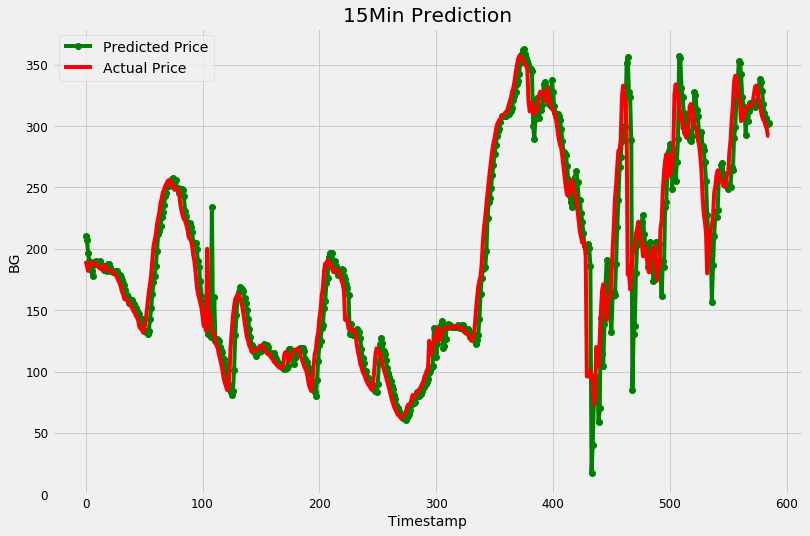

In [46]:
fig = plt.figure(figsize=(12,8))

# --------------------- Actual vs. Predicted --------------------------
#axes[0].plot(train, color='blue', label='Training Data')
plt.plot(forecasts, color='green', marker='o',
             label='Predicted Price')

plt.plot(test, color='red', label='Actual Price')
plt.title('15Min Prediction')
plt.xlabel('Timestamp')
plt.ylabel('BG')

#axes[0].set_xticks(np.arange(0, 7982, 1300).tolist(), df['Date'][0:7982:1300].tolist())
plt.legend()

#RMSE 13정도였음 


In [47]:
#import pmdarima as pm
#from pmdarima.model_selection import SlidingWindowForecastCV

In [48]:
#cv = SlidingWindowForecastCV(step=1, h=6, window_size=6)

In [49]:
#cv_gen =cv.split(train)

In [50]:
#cv_gen[1]

In [51]:
##ARIMA 모형의 차분 여부를 결정하기 위한 단위근 검정
def adf_test(y):
    adf_test = ADFTest(alpha=0.05)
    p_val, should_diff = adf_test.should_diff(y)
    return p_val

In [52]:
##Series 데이터로 변환 함수
def time_series(df,i):
    #store=df[df['Glucose']==i]
    #index=pd.date_range(min(store['year_month']),'2019-03',freq='BM') ##영업 시작일부터 2019년 2월까지 데이터가 존제
    ts=pd.Series(df['Glucose'].values,index=index)
    return ts

In [53]:
##acf. pacf 그래프
def acf_pacf_plot(data=None,store_id=None):
    ts=time_series(data,store_id)
    fig = plt.figure(figsize=(12,8))
    ax1 = fig.add_subplot(211)
    plot_acf(ts,lags=20,ax=ax1)
    ax2 = fig.add_subplot(212)
    plot_pacf(ts, lags=20, ax=ax2)


In [54]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [55]:
def stationarity_check(ts):
            
    # Calculate rolling statistics
    roll_mean = ts.rolling(window=6, center=False).mean()
    roll_std = ts.rolling(window=6, center=False).std()

    # Perform the Dickey Fuller test
    dftest = adfuller(ts) 
    
    # Plot rolling statistics:
    fig = plt.figure(figsize=(12,6))
    orig = plt.plot(ts, color='blue',label='Original')
    mean = plt.plot(roll_mean, color='red', label='Rolling Mean')
    std = plt.plot(roll_std, color='green', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Print Dickey-Fuller test results

    print('\nResults of Dickey-Fuller Test: \n')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', 
                                             '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

In [56]:
def decomposition_plot(ts):
# Apply seasonal_decompose 
    decomposition = seasonal_decompose(np.log(ts))
    
# Get trend, seasonality, and residuals
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

# Plotting
    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.plot(np.log(ts), label='Original', color='blue')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color='blue')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality', color='blue')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color='blue')
    plt.legend(loc='best')
    plt.tight_layout()

In [57]:
#plt.rcParams["figure.figsize"] = (14,8)
#plt.figure(1)

#model.plot_diagnostics()
#plt.show()

In [58]:
from sklearn.metrics import mean_squared_error
def RMSE(y_test,y_predict):
    return np.sqrt(mean_squared_error(y_test,y_predict))

## ARIMA_30MIN

In [59]:
#raw_seq = df['Glucose']
#raw_seq=raw_seq.to_numpy(dtype='int64')
def ARIMA_split_30(dataset,start_index,end_index, history_size, target_size):
    data=[]
    labels=[]
    
    start_index= start_index+history_size
    if end_index is None:
    #if end_index > len(dataset)-1:
        end_index = len(dataset)-target_size
        
    for i in range(start_index,end_index):
        indices = range(i-history_size,i)
        
        data.append(np.reshape(dataset[indices],(history_size,1)))
        #data.append(np.reshape(dataset[indices],(history_size)))
        #labels.append(dataset[i+target_size])
    return np.array(data)





In [60]:
TRAIN_SPLIT=int(len(raw_seq)*0.7)
uni_past_history=TRAIN_SPLIT - 6
uni_future_target= 6
# 이거 -1이면 naive method 

In [61]:
arima_train = ARIMA_split_30(raw_seq,0,None,
                                  uni_past_history,
                                  uni_future_target)

In [62]:
count = 1 
forecasts_30 = []
for i in range(len(arima_train)):
  n_diffs = param_d(arima_train[i])

  model = model_auto(arima_train[i])
  fc = model.predict(n_periods=6,verbose=1)
  forecasts_30.append(fc[5])
  print("-----")
  print(count)
  print("-----")
  print("appended :",fc[5])
  print("array :",forecasts_30)
  count+=1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9365.234, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9509.661, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9391.815, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9374.236, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9507.688, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9361.886, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9390.603, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9332.511, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9330.564, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9332.543, Time=0.41 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9332.777, Time=0.91 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9328.570, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9388.615, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9330.549, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9303.065, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9469.805, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9334.208, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9310.955, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9467.805, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9298.873, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9331.608, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9270.885, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9268.886, Time=0.25 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9270.885, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9270.602, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9266.886, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9329.609, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9268.885, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9268.885, Time=0.19 sec
 ARIMA(2,1

 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9269.962, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9269.962, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9298.133, Time=0.15 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9269.700, Time=0.35 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.719 seconds
-----
12
-----
appended : 187.41245450715124
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124]
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9304.414, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9470.868, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9335.304, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9312.223, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9468.869, Time=0.02 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9302.590, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9468.447, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9333.810, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9310.670, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9466.450, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9298.391, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9331.231, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9270.038, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9268.043, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9270.041, Time=0.33 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9269.763, Time=0.96 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9266.045, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9329.233, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9268.043, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9268.040, Time=0.17 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9299.858, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9465.525, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9331.541, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9308.190, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9463.526, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9295.794, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9328.855, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9267.641, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9265.646, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9267.644, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9267.331, Time=0.67 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9263.646, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9326.856, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9265.644, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9265.642, Time=0.29 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9299.813, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9465.507, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9331.525, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9308.151, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9463.509, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9295.757, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9328.826, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9267.614, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9265.619, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9267.617, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9267.307, Time=0.84 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9263.620, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9326.828, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9265.618, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9265.615, Time=0.34 sec
 ARIMA(2,1

 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9265.646, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9265.643, Time=0.31 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9293.763, Time=0.15 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9265.333, Time=0.35 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.668 seconds
-----
32
-----
appended : 178.6592724318717
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717]
Performing ste

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9299.810, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9465.569, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9331.496, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9308.141, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9463.574, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9295.728, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9328.814, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9267.569, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9265.573, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9267.571, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9267.249, Time=0.92 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9263.576, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9326.818, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9265.574, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9265.571, Time=0.29 sec
 ARIMA(2,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9308.568, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9464.189, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9296.168, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9329.247, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9267.830, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9265.836, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9267.834, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9267.525, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9263.841, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9327.254, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9265.839, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9265.836, Time=0.29 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9294.175, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9265.531, Time=0.35 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.595 seconds

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9300.259, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9466.146, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9331.763, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9308.488, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9464.172, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9296.124, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9329.139, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9267.763, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9265.770, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9267.767, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9267.475, Time=0.84 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9263.781, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9327.155, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9265.778, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9265.774, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9300.600, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9466.460, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9332.019, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9308.796, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9464.496, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9296.449, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9329.421, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9268.026, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9266.034, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9268.031, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9267.750, Time=0.79 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9264.049, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9327.444, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9266.046, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9266.042, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9300.880, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9466.916, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9332.321, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9309.074, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9464.964, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9296.723, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9329.732, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9268.214, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9266.222, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9268.219, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9267.941, Time=0.81 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9264.243, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9327.761, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9266.240, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9266.235, Time=0.18 sec
 ARIMA(2,1

 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9267.161, Time=0.34 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.756 seconds
-----
60
-----
appended : 153.05190476216168
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.902719788

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9304.402, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9471.932, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9335.495, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9312.315, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9469.932, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9299.954, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9333.067, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9271.168, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9269.170, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9271.169, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9270.824, Time=0.81 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9267.170, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9331.067, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9269.169, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9269.168, Time=0.20 sec
 ARIMA(2,1

 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9272.253, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9271.955, Time=0.90 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9268.267, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9332.736, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9270.263, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9270.257, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9299.637, Time=0.15 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9269.965, Time=0.37 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.591 seconds
-----
67
-----
appended : 216.17017880973992
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907,

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9308.694, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9478.422, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9338.854, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9316.035, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9476.517, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9303.754, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9336.814, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9273.234, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9271.266, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9273.254, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9273.030, Time=0.83 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9269.307, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9334.872, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9271.295, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9271.275, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9308.754, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9478.646, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9338.830, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9316.042, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9476.757, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9303.776, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9336.814, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9273.217, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9271.250, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9273.238, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9273.017, Time=0.95 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9269.297, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9334.882, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9271.284, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9271.263, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9308.716, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9478.518, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9338.775, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9316.020, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9476.613, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9303.723, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9336.775, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9273.163, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9271.195, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9273.183, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9272.947, Time=0.79 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9269.227, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9334.827, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9271.215, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9271.195, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9309.437, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9478.806, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9339.320, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9316.738, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9476.901, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9304.397, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9337.370, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9273.832, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9271.866, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9273.853, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9273.610, Time=0.74 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9269.900, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9335.425, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9271.887, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9271.866, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9309.638, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9478.870, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9339.381, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9316.851, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9476.966, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9304.599, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9337.437, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9273.997, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9272.038, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9274.022, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9273.825, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9270.072, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9335.492, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9272.056, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9272.030, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9310.918, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9480.299, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9340.670, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9318.119, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9478.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9305.833, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9338.723, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9275.373, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9273.412, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9275.398, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9275.160, Time=0.91 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9271.434, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9336.763, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9273.419, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9273.395, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9311.238, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9481.035, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9340.842, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9318.351, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9479.094, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9306.060, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9338.944, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9275.508, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9273.544, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9275.531, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9275.283, Time=0.80 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9271.562, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9336.977, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9273.548, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9273.526, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9311.489, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9481.379, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9341.082, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9318.596, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9479.430, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9306.274, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9339.197, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9275.664, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9273.704, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9275.689, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9275.430, Time=0.85 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9271.719, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9337.225, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9273.704, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9273.679, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9311.937, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9481.946, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9341.409, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9318.974, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9479.989, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9306.675, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9339.547, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9276.001, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9274.046, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9276.029, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9275.788, Time=0.81 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9272.061, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9337.572, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9274.044, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9274.015, Time=0.35 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9312.856, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9483.629, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9342.540, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9319.953, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9481.650, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9307.558, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9340.673, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9276.748, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9274.796, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9276.778, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9276.485, Time=0.84 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9272.802, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9338.686, Time=0.04 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9274.784, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9274.753, Time=0.16 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9313.832, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9486.515, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9343.432, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9320.736, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9484.520, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9308.225, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9341.651, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9277.045, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9275.087, Time=0.24 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9277.072, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9276.686, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9273.087, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9339.653, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9275.072, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9275.045, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9313.759, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9486.627, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9343.315, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9320.680, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9484.632, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9308.040, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9341.598, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9276.611, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9274.660, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9276.642, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9276.222, Time=0.63 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9272.661, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9339.600, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9274.643, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9274.612, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9315.099, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9488.414, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9344.643, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9321.988, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9486.414, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9309.308, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9342.945, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9277.808, Time=0.35 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9275.864, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9277.844, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9277.399, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9273.864, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9340.946, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9275.844, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9275.808, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9497.986, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9601.658, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9512.375, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.424, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9599.661, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9494.454, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9513.643, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.103, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.018, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.276, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.259, Time=0.72 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9460.018, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9511.643, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9461.276, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9460.104, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9497.079, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9481.377, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9510.505, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9478.451, Time=0.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.177, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9480.344, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.354, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.112, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.302, Time=0.22 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9481.265, Time=1.55 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9476.178, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9508.505, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9478.346, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9477.355, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9476.453, Time=0.31 sec
 ARIMA(2,1

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9482.877, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9511.623, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.162, Time=0.70 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.283, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.360, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.641, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.146, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.578, Time=0.23 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9480.857, Time=1.18 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9476.283, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9509.623, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9479.360, Time=0.08 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9477.641, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9477.162, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9517.146, Time=0.06 sec
 ARIMA(2,1

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9483.570, Time=0.51 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9512.466, Time=0.48 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9479.313, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9478.400, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9481.494, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9479.763, Time=0.67 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9519.479, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9480.708, Time=0.27 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9481.138, Time=0.93 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9476.401, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9510.468, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9479.494, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9477.764, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9477.313, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9517.481, Time=0.06 sec
 ARIMA(2,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.373, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9593.412, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9505.204, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.808, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.514, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9499.651, Time=0.30 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.291, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.537, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.479, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.814, Time=0.77 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9507.449, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9467.826, Time=0.23 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9468.102, Time=0.90 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9463.543, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9497.659, Time=0.15 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9505.147, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9595.982, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9505.835, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.783, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9594.000, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9505.620, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9485.038, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.738, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9500.041, Time=0.30 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.534, Time=0.48 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.795, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.764, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.060, Time=0.71 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9507.819, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9468.103, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9505.640, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9596.722, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9506.259, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.249, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9594.749, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9506.094, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9485.309, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9471.007, Time=0.33 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9500.473, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.823, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9466.087, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9469.100, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.349, Time=0.62 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9508.245, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9468.415, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9505.819, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9596.980, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9506.393, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.414, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9595.014, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9506.264, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9485.354, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9471.045, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9500.623, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.859, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9466.127, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9469.160, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.385, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9508.381, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9468.465, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9507.913, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9599.094, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9508.576, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9506.524, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9597.112, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9508.367, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9487.937, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9473.708, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9502.766, Time=0.30 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9469.546, Time=0.43 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9468.783, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9471.600, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9470.059, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9510.560, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9470.994, Time=0.21 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9514.324, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9608.346, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9514.660, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9512.747, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9606.346, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9514.638, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9494.552, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9480.684, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9508.994, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9476.708, Time=0.44 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9475.833, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9478.232, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9477.196, Time=0.66 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9516.645, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9477.787, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9516.272, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9611.224, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9516.109, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9514.574, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9609.227, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9516.502, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9495.683, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9481.755, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9510.626, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9477.690, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9476.798, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9479.099, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9478.172, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9518.108, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9478.680, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.519, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.207, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.253, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.785, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.220, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.721, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9491.890, Time=0.24 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9477.861, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.752, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9473.925, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.133, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.797, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.414, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.252, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.215, Time=0.36 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9513.496, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9609.020, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9513.249, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9511.770, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9607.031, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9513.704, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9491.834, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9477.805, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9507.738, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9473.874, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9473.073, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.798, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.357, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9515.249, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9475.182, Time=0.37 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9511.969, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9606.656, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9512.263, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9510.383, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9604.656, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9512.277, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9491.835, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9477.839, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9506.520, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9473.827, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9472.937, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9475.333, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9474.289, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9514.252, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9474.852, Time=0.38 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9505.193, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9598.260, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9506.115, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.776, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9596.276, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9505.615, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9487.460, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9473.672, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9500.151, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9469.735, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9468.736, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9470.643, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9470.177, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9508.069, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9470.398, Time=0.44 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9503.190, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9594.985, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9504.390, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.879, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9593.045, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9503.685, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9486.391, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9472.627, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9498.324, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9468.662, Time=0.52 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9467.626, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9469.356, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9469.095, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9506.325, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9469.196, Time=0.37 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9499.699, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9590.482, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9501.302, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9498.533, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9588.611, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9500.290, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9483.934, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.198, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9495.070, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.305, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.288, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9466.854, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.745, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9503.203, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.800, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9497.334, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9587.128, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9499.245, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9496.297, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9585.332, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9498.011, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9482.117, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9468.325, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9492.890, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9464.384, Time=0.86 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9463.363, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9464.967, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9464.825, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9501.121, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9464.899, Time=0.33 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.580, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.784, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.574, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.591, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9583.053, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9496.289, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.577, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.770, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9491.207, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.765, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.727, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.331, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.199, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.444, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.257, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.316, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.467, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.318, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.330, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.756, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9496.027, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.367, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.572, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.953, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.564, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.516, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.112, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.995, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.187, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.040, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.276, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.400, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.278, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.291, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.697, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.988, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.358, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.566, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.915, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.552, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.501, Time=0.52 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.089, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.983, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.147, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.021, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.327, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.467, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.321, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.337, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.756, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9496.035, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.421, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.641, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.970, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.617, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.560, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.150, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.046, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.190, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.079, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.155, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.286, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.149, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.163, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.593, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.861, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.283, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.529, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.809, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.521, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.465, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.037, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.950, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.017, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.976, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.163, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.300, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.161, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.173, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.623, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.871, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.286, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.530, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.820, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.519, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.465, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.027, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.949, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.029, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.972, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.969, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.032, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.975, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.984, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.386, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.680, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.096, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.343, Time=0.51 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.632, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.350, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.305, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.868, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.782, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.842, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.816, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.928, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.976, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.951, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.950, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.341, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.644, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.057, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.290, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.596, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.299, Time=0.73 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.263, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.837, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.735, Time=0.90 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.817, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.785, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.948, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.011, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.985, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.978, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.401, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.669, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.047, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.248, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.616, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.220, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.181, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.784, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.656, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.851, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.715, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.755, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.723, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.792, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.792, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.104, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.482, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9479.844, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.019, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.412, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.997, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9460.969, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.564, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.438, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.660, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.504, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.407, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.342, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.438, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.442, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9581.704, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.133, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9479.487, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9465.670, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.069, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.648, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9460.618, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.233, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.089, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.305, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.164, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.360, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.313, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.388, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.395, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9581.674, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.086, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9479.429, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9465.605, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.018, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.580, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9460.552, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.159, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.021, Time=0.95 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.256, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.094, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.364, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.305, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.390, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.399, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9581.674, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.090, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9479.429, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9465.603, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.021, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.572, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9460.543, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.150, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.013, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.259, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.083, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.314, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.245, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.323, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.343, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9581.615, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.037, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9479.366, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9465.546, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9489.962, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.519, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9460.487, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.084, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9461.959, Time=0.94 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.193, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.022, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.728, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.700, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.727, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.756, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9583.008, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9496.450, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.817, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.997, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9491.374, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.948, Time=0.81 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.908, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.485, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.386, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.599, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.430, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.747, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.719, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.804, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.786, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9583.053, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9496.476, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.911, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9467.112, Time=0.50 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9491.421, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.097, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.051, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.652, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.531, Time=0.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.667, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.581, Time=0.22 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9496.123, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9585.000, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9498.180, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9495.174, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9583.349, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9496.861, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9481.284, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9467.448, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9491.768, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.520, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.526, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9464.081, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.979, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9500.046, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9464.059, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.833, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.812, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.733, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.808, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9583.127, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9496.519, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.937, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9467.267, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9491.466, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.414, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.412, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.958, Time=0.12 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.868, Time=0.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.605, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.946, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.570, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9584.000, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.383, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.503, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9582.341, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.228, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9479.287, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9465.594, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.132, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.757, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9460.777, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.382, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.213, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.265, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.338, Time=0.32 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9493.424, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9582.639, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9495.322, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9492.390, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9580.933, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9494.103, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9478.435, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9464.758, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9489.041, Time=0.47 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9460.897, Time=0.86 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9459.890, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9461.434, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9461.345, Time=0.90 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9497.195, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9461.415, Time=0.38 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9493.163, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9582.263, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9495.116, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9492.151, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9580.532, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9493.856, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9478.351, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9464.681, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9488.805, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9460.831, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9459.816, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9461.302, Time=0.28 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9461.276, Time=0.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9496.983, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9461.308, Time=0.41 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9493.261, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9582.322, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9495.262, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9492.260, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9580.591, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9493.960, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9478.603, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9464.974, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9488.938, Time=0.48 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.152, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9460.135, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9461.588, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9461.596, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9497.121, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9461.612, Time=0.42 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.997, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.861, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9495.105, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9492.037, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9580.116, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9493.722, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9478.482, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9464.842, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9488.736, Time=0.52 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9461.012, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9459.990, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9461.474, Time=0.32 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9461.455, Time=0.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9496.954, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9461.484, Time=0.48 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9491.267, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9579.617, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.331, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.324, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.828, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.008, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9476.600, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9462.878, Time=0.50 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9486.978, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9459.020, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9458.002, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9459.497, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9459.460, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.192, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9459.491, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9491.735, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9580.292, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.745, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.762, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9578.542, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.455, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9476.924, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9463.238, Time=0.53 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.450, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9459.336, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9458.307, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9459.842, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9459.770, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.611, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9459.809, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9491.825, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9580.439, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.805, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.846, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9578.705, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.542, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9476.944, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9463.205, Time=0.60 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.492, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9459.321, Time=0.69 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9458.299, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9459.844, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9459.763, Time=0.90 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.675, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9459.807, Time=0.28 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.382, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.454, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9496.535, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.458, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9581.645, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.135, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9479.932, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.082, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.055, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.106, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.088, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9462.475, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9462.565, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9498.388, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9462.535, Time=0.41 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9495.302, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9585.135, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9497.154, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9494.238, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9583.290, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9495.961, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.611, Time=0.25 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.957, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9490.839, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.028, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.936, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.177, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.456, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9499.032, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.274, Time=0.39 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9489.909, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9579.593, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9491.956, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9488.921, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.784, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9490.614, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9474.604, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9460.700, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9485.618, Time=0.55 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.283, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.133, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.085, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.674, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9493.824, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9456.781, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9491.231, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.357, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9492.755, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.067, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.522, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9491.825, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9474.649, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9460.714, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9486.713, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.107, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9454.940, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.269, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.493, Time=1.00 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9494.674, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9456.761, Time=0.45 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9491.543, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.427, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9492.942, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.338, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.508, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.110, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9474.693, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9460.842, Time=0.35 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.046, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.181, Time=0.52 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.011, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.400, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.548, Time=0.92 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9494.871, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9456.842, Time=0.36 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9493.284, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9583.348, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9494.305, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9491.940, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9581.378, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9493.756, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9475.661, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9462.003, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9488.720, Time=0.50 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9457.389, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9456.228, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9458.850, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9457.752, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9496.255, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9458.179, Time=0.31 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9493.493, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9582.931, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9494.614, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9492.222, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9580.947, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9494.020, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9475.925, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9462.037, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9488.879, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9457.360, Time=0.58 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9456.225, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9458.826, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9457.740, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9496.566, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9458.179, Time=0.31 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.143, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.658, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.179, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.848, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.671, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.654, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9474.639, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9460.734, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.445, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.131, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9454.998, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.489, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.522, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.135, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9456.903, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.342, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.872, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.374, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9491.045, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.894, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.852, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9474.973, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9461.067, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.633, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.434, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.271, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.730, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.820, Time=0.66 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.330, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9457.152, Time=0.22 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.415, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.960, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.455, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9491.117, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.983, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.924, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9475.025, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9461.140, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.724, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.480, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.309, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.791, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.859, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.410, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9457.195, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.386, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.888, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.441, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9491.094, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.908, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.900, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9475.021, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9461.130, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.706, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.466, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.295, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.773, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.845, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.395, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9457.178, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.248, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.654, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.301, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.960, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.671, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.765, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9474.932, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9461.025, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.560, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.363, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.202, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.653, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.747, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.256, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9457.079, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.391, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.843, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.411, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9491.091, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.864, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9492.899, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9475.038, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9461.140, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9487.688, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.491, Time=0.80 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.330, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9457.778, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9456.874, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.368, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9457.205, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9492.745, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9582.268, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9493.733, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9491.433, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9580.294, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9493.245, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9475.332, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9461.438, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9488.031, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9456.766, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9455.596, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9458.053, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9457.145, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9495.692, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9457.467, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9501.951, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9590.753, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9502.869, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9500.655, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9588.803, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9502.467, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.539, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.621, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.232, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9465.947, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9464.777, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.282, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.335, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9504.835, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.680, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.724, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.376, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9503.469, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.384, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.437, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9503.213, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.881, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.872, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.860, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.178, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.006, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.523, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.565, Time=0.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9505.445, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.910, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.708, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.363, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9503.467, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.373, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.422, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9503.199, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.934, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.932, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.858, Time=0.47 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.214, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.051, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.520, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.602, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9505.443, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.926, Time=0.33 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.620, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.251, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9503.383, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.286, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.304, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9503.113, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.881, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.869, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.756, Time=0.47 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.202, Time=0.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.033, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.502, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.591, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9505.359, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.905, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.809, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.425, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9503.559, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.469, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.481, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9503.298, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9485.003, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.999, Time=0.35 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.935, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.371, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.213, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.708, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.763, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9505.534, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9467.104, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9503.670, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9592.643, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9504.376, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.307, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9590.719, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9504.141, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9485.714, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9471.740, Time=0.62 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9498.768, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9467.184, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9466.046, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.514, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.580, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9506.353, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9467.927, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9504.208, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9593.326, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9504.811, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.814, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9591.426, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9504.658, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9486.015, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9472.038, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9499.243, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9467.477, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9466.337, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.807, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.871, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9506.793, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9468.212, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9504.390, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9593.545, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9504.934, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.977, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9591.662, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9504.828, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9486.059, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9472.096, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9499.404, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9467.535, Time=0.70 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9466.393, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.892, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.929, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9506.918, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9468.280, Time=0.25 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9467.315, Time=0.60 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.937 seconds
-----
246
-----
appended : 93.73612480788832
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.902719788

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9504.545, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9593.779, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9505.069, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.127, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9591.912, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9504.979, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9486.113, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9472.140, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9499.538, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9467.585, Time=0.86 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9466.447, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.967, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.980, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9507.054, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9468.346, Time=0.25 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9467.281, Time=0.54 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.074 seconds
-----
249
-----
appended : 87.610921766564
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.90271978835

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9504.519, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9593.800, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9505.037, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.100, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9591.956, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9504.953, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9485.943, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9471.914, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9499.498, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9467.323, Time=0.85 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9466.196, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.815, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.724, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9507.022, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9468.150, Time=0.37 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9467.139, Time=0.59 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.591 seconds
-----
252
-----
appended : 83.22316982893571
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.902719788

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9504.166, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9593.165, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9504.803, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.795, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9591.294, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9504.633, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9485.768, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9471.711, Time=0.55 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9499.217, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9467.059, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.928, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9468.490, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.451, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9506.786, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9467.842, Time=0.32 sec
 ARIMA(4,1

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9471.616, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9467.817, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9468.813, Time=0.62 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.459 seconds
-----
255
-----
appended : 110.49547813569926
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9506.667, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9596.748, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9507.131, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9505.198, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9594.794, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9507.063, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9488.383, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9474.544, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9501.621, Time=0.50 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9470.181, Time=0.72 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9469.074, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9471.400, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9470.588, Time=0.93 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9509.114, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9470.897, Time=0.38 sec
 ARIMA(4,1

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9472.729, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9469.163, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9470.170, Time=0.52 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.080 seconds
-----
258
-----
appended : 125.00260382814321
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9505.628, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9595.612, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9506.123, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.164, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9593.648, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9506.026, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9487.269, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9473.504, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9500.607, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9469.393, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9468.402, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9470.713, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9469.836, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9508.103, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9470.280, Time=0.39 sec
 ARIMA(4,1

 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9467.597, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9506.235, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9471.697, Time=0.34 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9468.433, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9469.380, Time=0.52 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.177 seconds
-----
261
-----
appended : 108.18955851860571
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.1504407723609

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9506.135, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9596.282, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9506.605, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.659, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9594.338, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9506.525, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9487.877, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9474.122, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9501.098, Time=0.48 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9469.925, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9468.868, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9471.116, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9470.343, Time=0.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9508.587, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9470.676, Time=0.31 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9468.395, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9467.976, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9506.678, Time=0.13 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9472.168, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9468.727, Time=0.08 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9469.747, Time=0.53 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.475 seconds
-----
264
-----
appended : 93.72933817302052
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.998, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.868, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9503.513, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.574, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.997, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9503.428, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.980, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9471.162, Time=0.51 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9498.042, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.755, Time=0.69 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.649, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.923, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9467.158, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9505.496, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9467.450, Time=0.23 sec
 ARIMA(4,1

 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9465.297, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9464.554, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9464.147, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9502.917, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9468.574, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9464.837, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9465.901, Time=0.64 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.732 seconds
-----
267
-----
appended : 84.26206701700818
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.554, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.622, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9503.077, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.133, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.806, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9502.986, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.572, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.693, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.567, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.247, Time=0.69 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.142, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.403, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.655, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9505.061, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.941, Time=0.24 sec
 ARIMA(4,1

 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9465.598, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9464.814, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9464.406, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9503.312, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9468.848, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9465.120, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9466.160, Time=0.52 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.697 seconds
-----
270
-----
appended : 71.27763609345388
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.733, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.917, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9503.209, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9501.295, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9590.145, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9503.153, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.661, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.778, Time=0.50 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.719, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.337, Time=0.78 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.234, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.510, Time=0.30 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.745, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9505.194, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9467.040, Time=0.38 sec
 ARIMA(4,1

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9495.864, Time=0.25 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9465.614, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9464.826, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9464.417, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9503.340, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9468.854, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9465.134, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9466.169, Time=0.58 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.309 seconds
-----
273
-----
appended : 65.0099896193502
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9502.369, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9591.374, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9502.950, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9500.971, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9589.658, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9502.817, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9484.499, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9470.592, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9497.404, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9466.115, Time=0.78 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9465.009, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9467.223, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9466.520, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9504.932, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.781, Time=0.38 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9462.994, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9495.311, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9465.204, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9464.501, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9464.091, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9502.789, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9468.514, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9464.773, Time=0.14 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9465.847, Time=0.56 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.349 seconds
-----
276
-----
appended : 61.61394423714916
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.32724617

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9501.271, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9590.290, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9501.841, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9499.851, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9588.626, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9501.701, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9483.575, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9469.803, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9496.347, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9465.419, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9464.293, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9466.513, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9465.818, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9503.820, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9466.068, Time=0.43 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9466.645, Time=1.45 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9461.887, Time=0.35 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9493.918, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9464.087, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9463.408, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9463.004, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9501.330, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9467.374, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9463.659, Time=0.15 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9464.758, Time=0.51 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.836 seconds
-----
279
-----
appended : 62.71003962125808
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.0704342

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9499.247, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9587.881, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9499.839, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.835, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9586.278, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9499.683, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9481.849, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9468.145, Time=0.50 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9494.356, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.829, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.695, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9464.849, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9464.231, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9501.815, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9464.444, Time=0.33 sec
 ARIMA(4,1

 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9464.407, Time=0.38 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9465.541, Time=1.34 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9460.800, Time=0.24 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9492.542, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9462.959, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9462.330, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9461.925, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9500.000, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9466.237, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9462.554, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9463.668, Time=0.59 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.244 seconds
-----
282
-----
appended : 68.9199640532137
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9498.855, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9587.391, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9499.462, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.447, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9585.805, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9499.294, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9481.594, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9467.922, Time=0.50 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9493.982, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.617, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.482, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9464.595, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9464.019, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9501.437, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9464.216, Time=0.24 sec
 ARIMA(4,1

 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9464.220, Time=0.23 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9465.363, Time=1.35 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9460.623, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9492.244, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9462.766, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9462.156, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9461.752, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9499.685, Time=0.05 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9466.049, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9462.373, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9463.496, Time=0.61 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.926 seconds
-----
285
-----
appended : 75.29005414347856
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.3

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9498.681, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9587.108, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9499.312, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.287, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9585.539, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9499.130, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9481.424, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9467.732, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9493.815, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.372, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.216, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9464.319, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.765, Time=1.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9501.287, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.929, Time=0.25 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9463.279, Time=0.51 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.914 seconds
-----
289
-----
appended : 80.1801454113302
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.9027197883

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9498.657, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9587.068, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9499.297, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9497.269, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9585.495, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9499.111, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9481.384, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9467.687, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9493.805, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9463.277, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9462.120, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9464.226, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.669, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9501.273, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.830, Time=0.36 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.532, Time=0.77 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9501.094, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.697, Time=0.23 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9464.867, Time=1.39 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9460.129, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9491.847, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9462.281, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9461.672, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9461.280, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9499.353, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9465.542, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9461.859, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9463.008, Time=0.65 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.936 seconds
-----
292
-----
appended : 84.8231465162846
array : [197.61437564

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9462.756, Time=0.74 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.980 seconds
-----
293
-----
appended : 87.2415105889695
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.9027197883

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9498.166, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9586.420, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9498.786, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9496.758, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9584.874, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9498.603, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9480.478, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9466.991, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9493.349, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9462.835, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.705, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.763, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.196, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9500.762, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.370, Time=0.23 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9461.699, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9463.784, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9463.208, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9500.796, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9463.231, Time=0.34 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9464.588, Time=1.36 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9459.844, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9491.541, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9461.969, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9461.357, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9460.881, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9499.063, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9464.632, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9461.388, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9462.735, Time=0.68 sec

Best mode

 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9460.834, Time=0.51 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 6.396 seconds
-----
297
-----
appended : 94.1300094242708
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.9027197883

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9494.586, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9586.772, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9490.720, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9483.378, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9585.199, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9485.138, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9474.267, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9463.022, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9484.644, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9445.449, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9444.944, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9451.127, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9445.585, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9490.584, Time=0.24 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9443.621, Time=0.47 sec
 ARIMA(5,1

 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9199.983, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9226.842, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9202.017, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9196.615, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9251.241, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9201.107, Time=0.11 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9198.565, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=9198.581, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=9320.486, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=9225.492, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9196.973, Time=0.14 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=9200.614, Time=0.20 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.528 seconds
-----
300
-----
appended : 107.02572310608326
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.2083045505963

 ARIMA(2,1,3)(0,0,0)[0]             : AIC=9158.826, Time=0.21 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.972 seconds
-----
301
-----
appended : 105.67607685177929
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.90271978

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8513.275, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8818.083, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8630.703, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8705.213, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8816.109, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8487.793, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8496.288, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8489.319, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8488.932, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8487.012, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8578.123, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8488.973, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8539.796, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8490.682, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8485.015, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8704.201, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8539.791, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8488.033, Time=0.12 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8485.322, Time=0.76 sec
 ARIMA(3,1,3)(0,0,0)[0]             : AIC=8491.480, Time=0.68 sec
 ARIMA(2,1,4)(0,0,0)[0]             : AIC=8490.951, Time=0.40 sec
 ARIMA(1,1,4)(0,0,0)[0]             : AIC=8489.485, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=8489.581, Time=0.16 sec
 ARIMA(3,1,4)(0,0,0)[0]             : AIC=8490.875, Time=0.48 sec

Best model:  ARIMA(2,1,3)(0,0,0)[0]          
Total fit time: 7.716 seconds
-----
305
-----
appended : 124.36032430133275
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8513.899, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8819.919, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8632.284, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8706.808, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8817.931, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8489.944, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8499.559, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8491.436, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8490.972, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8488.984, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8582.232, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8490.978, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8543.015, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8492.984, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8486.986, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8488.973, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8582.316, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8490.968, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8543.014, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8492.973, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8486.976, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8580.320, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8511.908, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8488.964, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8488.970, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8704.863, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8541.019, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8487.941, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8490.976, Time=0.14 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.001 seconds

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8488.786, Time=0.14 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8488.791, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8704.548, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8540.980, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8487.759, Time=0.12 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8490.795, Time=0.14 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 3.900 seconds
-----
309
-----
appended : 143.76067690639547
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.8646051

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8820.996, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8636.672, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8709.728, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8818.997, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8494.681, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8504.231, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8496.138, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8495.667, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8493.684, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8586.127, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8495.675, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8546.345, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8497.485, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8491.686, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8584.129, Time=0.08 sec
 ARIMA(1,1

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8495.343, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8493.358, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8585.591, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8495.351, Time=0.28 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8546.031, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8497.155, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8491.358, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8583.591, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8516.212, Time=0.11 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8493.343, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8493.351, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8706.980, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8544.031, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8492.313, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8495.155, Time=0.43 sec

Best mode

 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8583.712, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8516.964, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8494.222, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8494.249, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8707.666, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8544.769, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8493.013, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8495.996, Time=0.34 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.399 seconds
-----
313
-----
appended : 138.80368917053664
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907

 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8496.005, Time=0.44 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.994 seconds
-----
314
-----
appended : 140.81954380877232
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03061537081692, 154.60475341845392, 157.73052812061388, 155.90271978

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8517.112, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8819.981, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8634.488, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8708.108, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8817.983, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8493.202, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8502.365, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8494.770, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8494.386, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8492.432, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8583.944, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8494.410, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8544.996, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8496.161, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8490.432, Time=0.10 sec
 ARIMA(0,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8494.775, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8494.379, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8492.419, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8583.945, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8494.400, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8544.995, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8496.155, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8490.419, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8581.946, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8515.118, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8492.379, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8492.400, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8706.105, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8542.996, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8491.214, Time=0.11 sec
 ARIMA(2,1

 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8496.028, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8490.305, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8581.848, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8514.599, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8492.250, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8492.278, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8705.937, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8542.968, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8491.012, Time=0.07 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8494.028, Time=0.41 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.215 seconds
-----
318
-----
appended : 136.01361705377494
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434

 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8491.487, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8705.772, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8542.904, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8490.075, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8493.211, Time=0.37 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.987 seconds
-----
319
-----
appended : 135.89430106515
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8510.420, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8818.964, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8633.866, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8707.433, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8816.968, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8487.030, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8498.834, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8488.719, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8488.477, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8486.588, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8583.412, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8488.531, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8544.006, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8490.246, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8484.603, Time=0.16 sec
 ARIMA(0,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8486.741, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8498.735, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8488.429, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8488.189, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8486.300, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8582.942, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8488.242, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8543.911, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8489.957, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8484.319, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8580.944, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8508.197, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8486.208, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8486.262, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8703.934, Time=0.06 sec
 ARIMA(0,1

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8482.405, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8574.465, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8484.352, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8536.670, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8486.069, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8480.413, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8572.465, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8504.025, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8482.311, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8482.360, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8691.898, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8534.670, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8480.875, Time=0.12 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8484.077, Time=0.42 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.106 seconds

 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8481.694, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8476.021, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8564.007, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8499.544, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8477.905, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8477.958, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8681.020, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8527.300, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8476.463, Time=0.12 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8479.694, Time=0.38 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.236 seconds
-----
324
-----
appended : 135.621447802801
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.07043428

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8471.528, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8471.602, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8669.163, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8518.985, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8469.995, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8473.296, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.388 seconds
-----
325
-----
appended : 135.4689196515805
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8465.561, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8468.820, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.094 seconds
-----
326
-----
appended : 137.89216962168086
array : [197.61437564113695, 206.32854442306234, 210.0078719071662, 210.20830455059638, 207.12373976483306, 195.15897052887937, 188.9173870968367, 183.30322387004702, 180.46836214325637, 176.95761068398838, 190.070434288484, 187.41245450715124, 190.13566084437332, 188.0, 186.3272461786607, 190.20549814937763, 187.25071899830124, 185.22584179242907, 183.6919751561324, 182.47323660238428, 183.50531640115707, 181.97325083604758, 187.87336546270726, 187.73075509064392, 184.86460511539798, 181.73757410395388, 180.34134545137232, 181.15044077236092, 181.644493541456, 182.0, 182.0, 178.6592724318717, 178.05270488341154, 176.4798574565521, 174.1646247298223, 172.02539341229974, 169.66910930714934, 165.99669253068336, 161.18219980881787, 160.03

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.029, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8593.496, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8651.352, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.340, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8459.108, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8469.712, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8460.750, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8460.454, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8458.520, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8539.046, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8460.488, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8505.280, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8462.233, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8456.575, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8537.208, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.849, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.578, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8458.342, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8468.731, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8459.999, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8459.707, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8457.778, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.616, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8459.744, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8504.136, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8461.473, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8455.845, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8535.804, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8479.848, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8457.773, Time=0.20 sec
 ARIMA(1,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8458.326, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8468.714, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8459.980, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8459.686, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8457.754, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.461, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8459.721, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8503.931, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8461.454, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8455.822, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8535.656, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8479.784, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8457.753, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8457.789, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8647.538, Time=0.05 sec
 ARIMA(0,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8459.911, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8459.622, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8457.694, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.055, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8459.659, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8503.776, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8461.388, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8455.765, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8535.266, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8479.756, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8457.692, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8457.730, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8647.277, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8501.944, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8456.320, Time=0.08 sec
 ARIMA(2,1

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8458.046, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8456.101, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8535.045, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8458.076, Time=0.27 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8502.154, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8459.807, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8454.196, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8533.299, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8477.940, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8456.139, Time=0.14 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8456.170, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8644.539, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8500.358, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8454.770, Time=0.08 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8457.900, Time=0.46 sec

Best mode

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8456.362, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8535.270, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8458.337, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8502.387, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8460.068, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8454.466, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8533.537, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8478.181, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8456.409, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8456.440, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8644.698, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8500.608, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8455.035, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8458.170, Time=0.43 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.620 seconds

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.697, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.351, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.647, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8499.876, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8458.372, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.834, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8530.691, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8476.684, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8454.728, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8454.782, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8642.768, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8498.153, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8453.288, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8456.506, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.817 seconds

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.353, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8531.991, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.291, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8499.542, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8458.008, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.479, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8530.317, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8476.548, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8454.354, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8454.416, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8642.775, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8497.806, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8452.902, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8456.133, Time=0.37 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.080 seconds

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.396, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.042, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.335, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8499.631, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8458.050, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.529, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8530.375, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8476.593, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8454.403, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8454.466, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8642.870, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8497.905, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8452.951, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8456.181, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.066 seconds

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8448.163, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8526.240, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8450.121, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.239, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8451.813, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8446.356, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8524.663, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8471.141, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8448.259, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8448.313, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8638.507, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8492.592, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8446.852, Time=0.09 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8450.003, Time=0.37 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.766 seconds

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8450.168, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8448.269, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8526.241, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8450.224, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.311, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8451.913, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8446.448, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8524.642, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8471.200, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8448.343, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8448.401, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8638.524, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8492.645, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8446.918, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8450.089, Time=0.36 sec

Best mode

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8450.056, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8449.802, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8447.906, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8525.950, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8449.861, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.270, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8451.537, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8446.056, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8524.315, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8470.525, Time=0.09 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8447.949, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8448.010, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8638.073, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8492.577, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8446.483, Time=0.10 sec
 ARIMA(2,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.032, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8451.782, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8449.890, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8527.507, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8451.844, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.919, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8453.517, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.011, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8525.842, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8472.490, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8449.900, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8449.963, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8639.764, Time=0.11 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8494.196, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8448.429, Time=0.10 sec
 ARIMA(2,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.547, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.094, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.213, Time=0.65 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.908, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.982, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8531.369, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.950, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8499.152, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.657, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.052, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8529.632, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8475.813, Time=0.09 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8452.977, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8453.019, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8643.581, Time=0.05 sec
 ARIMA(0,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.434, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8738.503, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.522, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.825, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.176, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.876, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.964, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.792, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.924, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8500.070, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.627, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.012, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8531.010, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8476.946, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8453.922, Time=0.20 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8739.497, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8588.134, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.033, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8737.979, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.772, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.470, Time=0.26 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.340, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.870, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8451.885, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.364, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.878, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.661, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.612, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8449.946, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8530.589, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.695, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8737.394, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.719, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.868, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8735.908, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8448.690, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8458.238, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8450.057, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8449.548, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8447.568, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8528.452, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8449.558, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8492.701, Time=0.50 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8451.379, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8445.667, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8737.594, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.118, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.730, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8736.101, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8448.210, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.160, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8449.645, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8449.201, Time=0.56 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8447.248, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8526.956, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8449.224, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8492.023, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8451.008, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8445.360, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8525.249, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8473.438, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8739.459, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8586.834, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.827, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8737.868, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8445.616, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8454.897, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8447.061, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8446.641, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8444.750, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8526.792, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8446.690, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8491.230, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8448.413, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8442.808, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8748.049, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8590.084, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8652.545, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8746.340, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8449.746, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8458.987, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8451.282, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8451.022, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8449.239, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.436, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8451.105, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8496.090, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8452.846, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8447.252, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8530.546, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8465.020, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8740.970, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8579.970, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8643.383, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.302, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8438.504, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8448.185, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8439.874, Time=0.63 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8439.426, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8437.496, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.401, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8439.453, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8484.973, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8441.255, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8435.531, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8464.909, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8742.511, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8580.341, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.384, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8740.817, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8438.177, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8447.755, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8439.517, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8439.059, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8437.130, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.119, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8439.085, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8484.187, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8440.893, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8435.172, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8745.048, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.417, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.186, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8743.320, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8438.388, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8448.053, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8439.712, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8439.252, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8437.321, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8524.277, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8439.277, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8484.777, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8441.091, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8435.361, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8522.422, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8464.026, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8747.417, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.124, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.704, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8745.627, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8436.709, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8446.867, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8437.970, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8437.476, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8435.536, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8525.039, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8437.498, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8484.665, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8439.325, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8433.553, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8749.555, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8583.015, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.272, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8747.737, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8436.782, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8446.908, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8438.090, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8437.649, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8435.734, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8525.743, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8437.680, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8485.584, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8439.492, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8433.745, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8523.818, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8461.911, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8748.451, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.151, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.537, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8746.641, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8433.955, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8444.283, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8435.244, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8434.819, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8432.931, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.683, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8434.857, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8483.038, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8436.664, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8430.948, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.251, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8747.981, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8579.979, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.079, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8746.175, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.407, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.709, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.701, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.303, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.430, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8521.682, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.345, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8480.635, Time=0.53 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.158, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.457, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.221, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8749.663, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8580.685, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.259, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8747.819, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.362, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.809, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.657, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.265, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.394, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8522.434, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.306, Time=0.27 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.172, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.121, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.412, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.242, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8750.639, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.016, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.868, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8748.778, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.400, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.894, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.699, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.311, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.443, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8522.824, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.354, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.484, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.168, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.459, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.188, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8750.974, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.105, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.086, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8749.106, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.335, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.835, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.634, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.248, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.382, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8522.863, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.291, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.484, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.116, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.399, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.003, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8751.722, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.493, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.668, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8749.845, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.221, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.872, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.532, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.160, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.300, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.302, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.204, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.781, Time=0.45 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.028, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.319, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.052, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.421, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.766, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.110, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.528, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.337, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8442.057, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.658, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.295, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.440, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.722, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.341, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8482.149, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.161, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.456, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.085, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.536, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.765, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.151, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.638, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.354, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8442.069, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.666, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.296, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.436, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.716, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.341, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8482.126, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.157, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.455, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.088, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.627, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.818, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.233, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.720, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.357, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8442.063, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.670, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.300, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.439, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.750, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.344, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8482.132, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.159, Time=0.66 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.459, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.103, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.553, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.795, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.197, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.638, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.321, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8442.007, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.632, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.256, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.394, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.699, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.300, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8482.089, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.114, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.412, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8458.968, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.344, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.535, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.945, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.419, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.155, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.817, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.453, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.065, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.193, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.493, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.106, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.861, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.922, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.209, Time=0.12 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8458.898, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.458, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.608, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.040, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.528, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.160, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.869, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.466, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.087, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.220, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.584, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.129, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.954, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.950, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8458.940, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.354, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.539, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.939, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.419, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.185, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.882, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.489, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.108, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.239, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.525, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.150, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.901, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.971, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.255, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8458.825, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.442, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.662, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.069, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.501, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.071, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.831, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.380, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.005, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.141, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.609, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.047, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.950, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.867, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.158, Time=0.09 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8458.852, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8752.013, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.564, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.831, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8750.064, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.080, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.823, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.390, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8432.012, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.147, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.463, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.055, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.935, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.874, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.164, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8458.806, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8751.153, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.217, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.240, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8749.188, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8430.982, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.698, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.278, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8431.870, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8429.984, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.207, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8431.907, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.714, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.729, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8427.996, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8459.060, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8750.620, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.166, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.988, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8748.641, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8431.159, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.804, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.413, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8431.977, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.076, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.092, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.009, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.264, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.839, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.082, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8749.536, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8580.271, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.990, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8747.546, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8430.885, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.184, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.135, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8431.701, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8429.808, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8521.746, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8431.735, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8480.080, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.560, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8427.811, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8519.750, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8749.349, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8580.232, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.830, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8747.354, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8430.696, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.137, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8431.937, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8431.495, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8429.601, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8521.746, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8431.529, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8480.139, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.355, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8427.605, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8519.749, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8749.353, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8580.724, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.229, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8747.354, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8430.646, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8441.207, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8431.867, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8431.431, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8429.542, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8522.315, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8431.465, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8480.431, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.297, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8427.546, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8520.316, Time=0.08 sec
 ARIMA(1,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8457.396, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8744.218, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8578.337, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.610, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8742.221, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8429.091, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8439.696, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8430.270, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8429.753, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8427.823, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8520.088, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8429.775, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8478.174, Time=0.54 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8431.621, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8454.713, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8738.688, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8575.109, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8640.471, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8736.709, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8425.847, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8436.279, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8426.911, Time=0.65 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8426.346, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8424.407, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8515.774, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8426.364, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8473.181, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8428.230, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8422.409, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8453.357, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8736.030, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8572.867, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8638.001, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8734.083, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8424.481, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8434.462, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8425.562, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8425.061, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8423.151, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8512.719, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8425.086, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8470.802, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8426.953, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8421.162, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8453.547, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8736.002, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8572.773, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8637.835, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8734.083, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8424.747, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8434.722, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8425.838, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8425.341, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8423.434, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8512.934, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8425.367, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8471.223, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8427.229, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8421.448, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8453.619, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8735.667, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8572.961, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8637.874, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.779, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8424.798, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8434.769, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8425.889, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8425.396, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8423.491, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8513.134, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8425.423, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8471.364, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8427.283, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8421.507, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8450.672, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8731.178, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8570.484, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8634.687, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8729.344, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8421.461, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8431.562, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8422.521, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8422.052, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8420.168, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8509.507, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8422.082, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8467.567, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8423.950, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8418.197, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8446.644, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8727.127, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8566.462, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8630.611, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8725.340, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.663, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8427.580, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.783, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.404, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.577, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8505.042, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.443, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.362, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.315, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.622, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8727.039, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8566.437, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8630.542, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8725.256, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.864, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8427.713, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.982, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.597, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.767, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8505.075, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.636, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.416, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.509, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.808, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8503.188, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8726.951, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8566.437, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8630.516, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8725.173, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.842, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8427.713, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.963, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.584, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.756, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8505.065, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.622, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.417, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.496, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.797, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8503.179, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8445.734, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8726.608, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8566.096, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8630.211, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8724.838, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8416.779, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.897, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8417.933, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8417.566, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8415.749, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8504.619, Time=0.36 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8417.608, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.986, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8419.474, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8413.798, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8445.199, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8726.840, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8566.093, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8630.334, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8725.061, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8416.198, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.560, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8417.338, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8416.957, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8415.126, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8504.719, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8416.996, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.885, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8418.863, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8413.181, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8445.185, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8726.442, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8565.975, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8630.057, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8724.643, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8416.139, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.535, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8417.277, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8416.898, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8415.070, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8504.680, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8416.938, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.885, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8418.805, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8413.129, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8445.214, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8725.582, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8565.906, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8629.704, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8723.752, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8416.151, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.548, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8417.287, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8416.907, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8415.077, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8504.557, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8416.946, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.814, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8418.814, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8413.133, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8464.915, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8741.078, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8584.006, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.722, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.137, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8436.424, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8446.900, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8437.542, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8437.154, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8435.303, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8523.950, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8437.187, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8482.381, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8439.066, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8433.309, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8463.773, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8741.111, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.501, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8645.237, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.137, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8435.674, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8445.971, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8436.818, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8436.461, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8434.621, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8522.783, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8436.494, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8481.331, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8438.381, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8432.622, Time=0.22 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8465.882, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8740.234, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.780, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.754, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8738.254, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8439.875, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8450.697, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8441.037, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8440.668, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8438.748, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8525.407, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8440.685, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8484.466, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8442.600, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8436.753, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8467.482, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8739.932, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8582.779, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.544, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8737.951, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8442.333, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8452.136, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8443.781, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8443.538, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8441.739, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8525.485, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8443.586, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8486.282, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8445.438, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8439.750, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8469.199, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8741.489, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.964, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.020, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.495, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8444.625, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8455.598, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8446.182, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8445.912, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8444.070, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8530.103, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8445.958, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8491.424, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8447.749, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8442.071, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8467.908, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8740.803, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.467, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.443, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8738.806, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8443.190, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8454.416, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8444.763, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8444.516, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8442.695, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8529.289, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8444.566, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8490.584, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8446.361, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8440.695, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8468.286, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8741.050, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.715, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.629, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.054, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8443.831, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8455.375, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8445.361, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8445.043, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8443.148, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8530.486, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8445.075, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8491.559, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8446.883, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8441.148, Time=0.11 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8468.283, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8740.828, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.782, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.559, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8738.834, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8443.833, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8455.471, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8445.354, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8445.038, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8443.144, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8530.637, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8445.070, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8491.552, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8446.872, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]          

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8468.650, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8740.380, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.898, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.438, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8738.392, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8444.056, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8455.640, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8445.565, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8445.255, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8443.367, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8530.544, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8445.288, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8491.524, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8447.098, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8471.473, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8741.762, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.894, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.136, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.798, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.968, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8458.515, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8448.427, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8448.068, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.150, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.327, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.091, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8493.564, Time=0.52 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.907, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.156, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8470.773, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8739.754, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8586.500, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.317, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8737.813, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.313, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.772, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8447.755, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.380, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.453, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.102, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.401, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8492.293, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.223, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.464, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8470.785, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8738.385, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8586.019, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8645.476, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8736.460, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8446.517, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.911, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8447.966, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.596, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.668, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8531.571, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.616, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8491.947, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.441, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.678, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8470.101, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8736.152, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8584.505, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8643.584, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8734.249, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8445.988, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.104, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8447.481, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.138, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.226, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8529.994, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.164, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8491.036, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8448.975, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.238, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8470.057, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8735.169, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8584.159, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8642.945, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.280, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8445.964, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8457.051, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8447.451, Time=0.64 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.105, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.190, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8529.771, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.129, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8490.862, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8448.944, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.202, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8469.929, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8733.827, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8583.779, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8642.202, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8731.951, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8445.611, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8456.692, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8447.050, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8446.669, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8444.737, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8529.209, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8446.688, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8489.991, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8448.514, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8442.752, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8468.319, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8731.668, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8581.938, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8640.249, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8729.816, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8443.764, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8454.632, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8445.217, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8444.836, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8442.911, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8526.811, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8444.858, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8487.962, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8446.671, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8440.935, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8473.065, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8734.523, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8585.681, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8643.474, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8732.727, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8449.072, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8459.926, Time=0.26 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8450.535, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8450.180, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8448.261, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8531.397, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8450.201, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8492.558, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8452.031, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8446.312, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.754, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8735.203, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.948, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8645.104, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.391, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8450.377, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8461.503, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8451.816, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8451.450, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8449.529, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.974, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8451.471, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8493.994, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8453.303, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8447.565, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.016, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8734.895, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.515, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.578, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.087, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.291, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.495, Time=0.28 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.731, Time=0.58 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.350, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.406, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.586, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.366, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.668, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.209, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.437, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.224, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8735.093, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.520, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.679, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.280, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.467, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.497, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.947, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.594, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.669, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.451, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.615, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.817, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.441, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.698, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.267, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8735.235, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.598, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.788, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.419, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.473, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.506, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.947, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.595, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.671, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.475, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.616, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.821, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.445, Time=0.98 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.697, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.415, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.502, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.004, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.437, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.432, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.915, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.573, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.653, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.244, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.595, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.694, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.425, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.685, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8531.345, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8473.240, Time=0.07 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8474.979, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8734.214, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.070, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.050, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8732.422, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.185, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.168, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.665, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.315, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.390, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.904, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.336, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.501, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.164, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.426, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8734.016, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.014, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8643.919, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8732.228, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.192, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.218, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.666, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.309, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.379, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.942, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.329, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.537, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.157, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.415, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8531.049, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.242, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8734.269, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.293, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.210, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8732.477, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.443, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.425, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.921, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.579, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.659, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.060, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.601, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.646, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.431, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.692, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.846, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8735.196, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.777, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.870, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.391, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.117, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.987, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8453.614, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.289, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8451.381, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.589, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.315, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.269, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.140, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8449.410, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8476.318, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8736.547, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8588.484, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8645.844, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8734.719, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.530, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.375, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.033, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.716, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8451.817, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8534.317, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.744, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.871, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.567, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8449.837, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8476.323, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8736.744, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8588.576, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.028, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8734.913, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.508, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.350, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.010, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.692, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8451.793, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8534.319, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.719, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.857, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.542, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8449.813, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8735.203, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8586.827, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8644.333, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8733.391, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8450.990, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8461.732, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8452.487, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.164, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.263, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8532.598, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.191, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8494.086, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.015, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.295, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8530.697, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8475.450, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8736.554, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8587.968, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8645.596, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8734.719, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.689, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.623, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8453.187, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.863, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.957, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.898, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.888, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.233, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.711, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.980, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8476.157, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8738.093, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8588.864, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.733, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8736.239, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.585, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.591, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.110, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.806, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8451.910, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8535.091, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.834, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8496.534, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.651, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8449.927, Time=0.21 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8476.961, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8740.100, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8590.012, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.267, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8738.227, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.428, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.430, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.974, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.694, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.818, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8536.187, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.728, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.687, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.541, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.829, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8741.632, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8590.723, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.346, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.743, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.692, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.750, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.232, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.946, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.065, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8536.926, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.978, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.191, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.791, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.075, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8534.977, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8742.189, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8590.659, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.545, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8740.294, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.295, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.412, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.795, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.464, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.552, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8536.999, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.489, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.780, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.310, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.566, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8535.050, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8477.360, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8742.189, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8590.670, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.532, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8740.294, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.645, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.570, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.137, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.802, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.891, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8536.886, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.826, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.594, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.650, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.910, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8478.076, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8742.263, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8590.706, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.553, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8740.377, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.397, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8465.104, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.878, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.530, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.611, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8536.969, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.552, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.858, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.380, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.636, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.351, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8591.371, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.480, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.478, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.189, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.779, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.602, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.198, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.265, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.226, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.216, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.648, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.051, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.289, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8535.296, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8478.751, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.325, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8591.458, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.565, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.478, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.290, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.783, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.689, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.270, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.331, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.360, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.287, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.721, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.123, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.356, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8477.198, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8739.571, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8589.664, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.936, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8737.758, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.916, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.550, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.339, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.967, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.046, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8535.240, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.988, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.928, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.829, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.076, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8738.151, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8588.440, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.543, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8736.350, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.897, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.189, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.389, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.073, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.184, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8534.133, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.101, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.409, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.929, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.213, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8532.228, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8476.528, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8737.724, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8588.195, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8646.170, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8735.936, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.707, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.057, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8454.194, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.871, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8451.975, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8533.935, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.898, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8495.261, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.726, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.011, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8739.263, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8589.903, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8647.945, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8737.454, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8453.733, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.020, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.174, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8454.816, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8452.908, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8535.141, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8454.839, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8496.060, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.674, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8450.937, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8533.238, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8478.153, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8740.020, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8590.041, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8648.255, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8738.199, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.028, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.373, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.445, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.059, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.132, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8535.817, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.077, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8496.381, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.920, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.159, Time=0.14 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8478.949, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8741.783, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8591.180, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.750, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8739.936, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.684, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.988, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.124, Time=0.59 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.733, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.806, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8536.709, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.752, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.563, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.579, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8479.775, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.926, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8592.394, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8651.343, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8742.056, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8455.544, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8465.958, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.967, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8456.585, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.659, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8538.053, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.604, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.668, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8458.443, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.672, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8592.396, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8651.457, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8742.386, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8455.506, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8465.946, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.938, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8456.557, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.631, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8538.104, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.577, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.671, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8458.412, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.646, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8536.164, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8477.700, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8744.709, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8592.649, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8651.851, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8742.825, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8455.003, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8465.734, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.396, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.986, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.041, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8538.308, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.001, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8498.542, Time=0.45 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.850, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.061, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8536.365, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8479.222, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8744.617, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8592.685, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8651.867, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8742.743, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.371, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.939, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.748, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.316, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.377, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.772, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.333, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.850, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8457.174, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.413, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8479.013, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8744.849, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8592.761, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8652.159, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8742.963, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8454.184, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8464.742, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8455.564, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8455.137, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8453.200, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.849, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8455.154, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.875, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.994, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8451.239, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8743.171, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8591.259, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8650.493, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8741.230, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8452.508, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8463.565, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8453.894, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8453.507, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8451.575, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8536.924, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8453.524, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8496.615, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8455.380, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8449.585, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8534.953, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8747.942, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8984.354, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8843.910, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8899.095, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8982.393, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8731.587, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8738.909, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8733.551, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8733.540, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8732.206, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8732.169, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8735.586, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8729.722, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8746.082, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8737.031, Time=0.06 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8984.258, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8868.053, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8908.877, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8982.301, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8744.496, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8755.183, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8746.405, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8746.368, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8745.139, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8745.374, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8748.305, Time=0.98 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8742.577, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8765.356, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8753.246, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8744.486, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8773.405, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8984.237, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8868.042, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8909.192, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8982.278, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8762.535, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8776.301, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8764.383, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8764.281, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8762.281, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8824.166, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8764.281, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8797.129, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8766.210, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8760.309, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8777.843, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8984.590, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8868.408, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8909.707, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8982.623, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8767.015, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8776.712, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8768.866, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8768.764, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8767.898, Time=0.27 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8769.481, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8770.654, Time=0.33 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8765.026, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8775.860, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8774.721, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8777.838, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8985.386, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8869.642, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8910.834, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8983.430, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8767.239, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8777.833, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8769.035, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8768.832, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8768.125, Time=0.29 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8770.579, Time=0.24 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8770.674, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8765.256, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8775.860, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8775.851, Time=0.07 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8985.389, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8869.832, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8910.970, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8983.430, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8767.392, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8777.876, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8769.239, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8769.050, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8768.223, Time=0.30 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8770.617, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8770.816, Time=0.69 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8765.407, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8776.508, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8775.892, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8767.254, Time=0.25 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8996.089, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8881.875, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8922.791, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8994.165, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8778.670, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8789.042, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8779.990, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8779.576, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8780.080, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8782.306, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8781.177, Time=0.86 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8776.709, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8786.603, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8787.085, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8778.028, Time=0.25 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8791.948, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8996.651, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8885.056, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8924.892, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8994.713, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8781.007, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8791.394, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8782.447, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8781.931, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8782.412, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8784.688, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8783.220, Time=0.85 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8779.029, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8789.967, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8789.421, Time=0.07 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8843.298, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9036.212, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8925.154, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8963.135, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9034.216, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8836.255, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8847.477, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8838.138, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8837.972, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8836.740, Time=0.21 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8840.119, Time=0.15 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8839.695, Time=0.82 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8834.260, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8841.304, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8845.480, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8856.248, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9041.183, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8942.145, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8975.159, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9039.199, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8847.900, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8863.176, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8849.895, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8849.890, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8848.162, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8852.126, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8851.768, Time=0.83 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8845.900, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8854.248, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8861.178, Time=0.04 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8856.167, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9041.114, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8942.360, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8975.387, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9039.132, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8848.829, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8864.724, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8850.822, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8850.815, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8849.014, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8853.685, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8852.634, Time=0.79 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8846.829, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8854.167, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8862.729, Time=0.06 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8867.322, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9050.004, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8953.174, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8984.820, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9048.012, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8860.157, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8880.379, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8861.823, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8861.217, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8859.704, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8924.673, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8861.571, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8895.909, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8862.223, Time=1.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8857.707, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8873.660, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9058.417, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8957.287, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8989.989, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9056.418, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8867.788, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8887.270, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8869.614, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8868.240, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8867.435, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8931.158, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8869.247, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8907.247, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8871.268, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8865.447, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8875.874, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9065.275, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8960.630, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8994.845, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9063.276, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8869.847, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8888.771, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8871.745, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8870.531, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8869.586, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8933.162, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8871.494, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8909.546, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8873.413, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8867.615, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8873.613, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9060.926, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8957.260, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8990.942, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9058.926, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8867.806, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8886.496, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8869.710, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8868.482, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8867.555, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8929.897, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8869.461, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8906.657, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8871.397, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8865.566, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9061.959, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8960.493, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8993.138, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9059.971, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8876.796, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8893.060, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8878.774, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8877.774, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8876.702, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8933.077, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8878.687, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8911.876, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8880.436, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8874.702, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8931.085, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8881.835, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9060.828, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8958.897, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8991.492, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9058.861, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8877.306, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8892.499, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8879.299, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8878.471, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8877.262, Time=0.37 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8931.886, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8879.260, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8910.958, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8880.961, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8875.270, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8883.370, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9062.222, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8960.013, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8992.858, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9060.276, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8878.446, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8893.009, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8880.437, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8879.808, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8878.405, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8932.511, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8880.404, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8911.347, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8882.100, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8876.420, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9066.038, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8966.716, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8998.526, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9064.079, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8886.098, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8900.781, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8888.082, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8888.044, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8886.216, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8891.371, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8889.774, Time=0.90 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8884.104, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8888.367, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8898.790, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8886.087, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8889.343, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9065.336, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8965.910, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8997.705, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9063.385, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8885.129, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8899.699, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8887.105, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8887.054, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8885.265, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8890.400, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8888.791, Time=0.91 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8883.138, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8887.352, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8897.713, Time=0.07 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8889.394, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9065.316, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8965.912, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8997.701, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9063.363, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8885.231, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8900.054, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8887.214, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8887.175, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8885.346, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8890.564, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8888.915, Time=0.83 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8883.241, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8887.404, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8898.071, Time=0.07 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9071.518, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8972.527, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9004.148, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9069.537, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8891.292, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8906.653, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8893.292, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8893.292, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8891.332, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8896.086, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8895.155, Time=0.60 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8889.293, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8893.641, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8904.656, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8891.293, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8978.692, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9011.219, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9078.951, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8898.564, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8913.933, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8900.563, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8900.558, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8898.561, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8953.088, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8900.561, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8932.542, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8902.208, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8896.563, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8951.088, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8900.381, Time=0.08 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8905.758, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9088.678, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8982.741, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9016.682, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9086.678, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8901.861, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8916.727, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8903.861, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8903.859, Time=0.56 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8901.896, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8906.824, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8905.632, Time=0.75 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8899.869, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8903.766, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8914.731, Time=0.07 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9099.890, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8989.902, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9025.561, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9097.902, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8906.499, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8921.570, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8908.498, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8908.497, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8906.515, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8911.173, Time=0.28 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8910.308, Time=0.91 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8904.520, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8908.804, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8919.585, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8906.519, Time=0.21 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9102.903, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8990.486, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9026.941, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9100.926, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8906.334, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8921.485, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8908.333, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8908.331, Time=0.59 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8906.344, Time=0.25 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8910.976, Time=0.23 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8910.146, Time=0.98 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8904.353, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8908.701, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8919.499, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8906.353, Time=0.20 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9107.283, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8993.425, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9030.742, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9105.333, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8906.836, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8922.578, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8908.834, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8908.830, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8906.836, Time=0.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8911.696, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8910.642, Time=1.01 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8904.866, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8909.395, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8920.603, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8906.864, Time=0.27 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9110.041, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8994.457, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9032.375, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9108.130, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8906.262, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8922.906, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8908.256, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8907.939, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8906.233, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8967.979, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8908.232, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8944.443, Time=0.52 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8909.931, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8904.281, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8966.036, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8912.182, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9109.952, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8994.661, Time=0.21 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9032.389, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9108.046, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8907.505, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8923.523, Time=0.28 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8909.493, Time=0.73 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8909.134, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8907.455, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8968.101, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8909.453, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8944.601, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8911.194, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8905.495, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9111.612, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8996.470, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9034.339, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9109.726, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8907.874, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8924.370, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8909.864, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8909.579, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8907.834, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8969.489, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8909.834, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8945.704, Time=0.48 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8911.573, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8905.883, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8967.562, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8933.091, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9135.987, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9019.188, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9057.378, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9134.184, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8929.887, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8949.333, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8931.884, Time=0.61 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8931.875, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8929.875, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8995.618, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8931.875, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8971.085, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8933.597, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8927.977, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8933.187, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9137.606, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9019.215, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9057.464, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9135.832, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8929.892, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8949.352, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8931.887, Time=0.63 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8931.876, Time=0.63 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8929.876, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8995.615, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8931.876, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8971.104, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8933.603, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8927.974, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9140.117, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9023.405, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9060.352, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9138.300, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8940.208, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8959.659, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8942.130, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8941.125, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8940.074, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9002.971, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8941.971, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8979.769, Time=0.50 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8943.933, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8938.125, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9001.064, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8942.624, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9140.100, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9023.604, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9060.445, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9138.279, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8940.437, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8959.651, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8942.379, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8941.317, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8940.321, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9003.227, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8942.237, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8979.761, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8944.150, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8938.363, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9149.195, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9033.502, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9070.534, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9147.312, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8951.491, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8967.775, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8953.463, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8952.767, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8951.417, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9010.772, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8953.407, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8986.474, Time=0.45 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8955.277, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8949.430, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9008.829, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9246.438, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9423.490, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9302.183, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9339.845, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9421.505, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9244.182, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9254.512, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9243.875, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9242.308, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9243.449, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9242.900, Time=0.71 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9240.427, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9252.610, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9241.572, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9241.996, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9270.557, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9423.347, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9330.209, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9354.879, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9421.355, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9265.266, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9279.673, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9264.500, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9263.129, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9264.090, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9263.533, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9261.170, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9277.696, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9262.134, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9262.544, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9270.187, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9427.336, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9335.062, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9362.471, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9425.354, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9266.083, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9280.763, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9265.153, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9263.937, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9264.672, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9264.000, Time=0.69 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9261.960, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9278.774, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9262.699, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9263.180, Time=0.20 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9431.068, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9341.557, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9368.700, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9429.075, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9279.631, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9286.427, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9281.585, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9281.567, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9279.582, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9316.735, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9281.568, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9293.023, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9282.997, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9277.584, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9314.738, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9433.079, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9342.458, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9369.674, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9431.081, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9283.121, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9288.730, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9284.570, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9284.741, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9282.747, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9318.226, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9284.738, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9293.082, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9286.710, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9280.747, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9316.226, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9289.087, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9434.273, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9342.974, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9370.511, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9432.273, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9283.658, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9288.896, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.035, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9285.110, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9283.139, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9318.684, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9285.094, Time=0.63 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9293.117, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9287.062, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9281.140, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9289.190, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9434.273, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9343.050, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9370.539, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9432.273, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9283.950, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9289.164, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.420, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9285.525, Time=0.60 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9283.532, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9318.813, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9285.520, Time=0.57 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9293.315, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9287.529, Time=0.55 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9281.532, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9435.663, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9344.637, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9372.175, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9433.663, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9284.721, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9290.191, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9286.232, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9286.249, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9284.269, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9320.278, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9286.241, Time=0.61 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9295.094, Time=0.46 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9287.861, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9282.269, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9318.278, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9435.779, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9344.514, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9372.033, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9433.779, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9284.339, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9290.201, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9285.681, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9285.760, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9283.807, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9320.416, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9285.739, Time=0.60 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9294.675, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9287.544, Time=1.54 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9281.807, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9318.416, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9289.574, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9436.373, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9344.908, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9372.426, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9434.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9283.403, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9288.888, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9284.875, Time=0.59 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9284.907, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9282.917, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9319.634, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9284.903, Time=0.59 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9294.036, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9286.495, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9280.917, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9436.836, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9340.021, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9369.413, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9434.837, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9281.814, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9287.057, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9283.312, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9283.338, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9281.367, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9318.215, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9283.327, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9292.734, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9284.785, Time=1.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9279.377, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9316.220, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9237.393, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9395.303, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9289.306, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9320.978, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9393.320, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9233.370, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9238.059, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9234.739, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9234.776, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9232.857, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9269.926, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9234.740, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9243.269, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9236.440, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9230.862, Time=0.09 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9393.404, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9286.404, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9318.436, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9391.411, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9230.018, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9234.860, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9231.377, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9231.416, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9229.502, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9267.169, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9231.377, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9240.190, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9233.077, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9227.502, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9265.172, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9235.826, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9395.248, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9288.215, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9320.268, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9393.252, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9231.708, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9236.587, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.985, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9233.020, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9231.133, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9269.076, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9232.970, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9241.639, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9234.853, Time=1.23 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9229.133, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9395.093, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9288.386, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9320.293, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9393.098, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9231.924, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9236.783, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9233.202, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9233.248, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9231.354, Time=0.38 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9269.143, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9233.200, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9241.746, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9235.101, Time=1.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9229.354, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9267.145, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9237.539, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9395.561, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9289.168, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9320.855, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9393.575, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9233.622, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9238.411, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9234.879, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9234.937, Time=0.59 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9233.053, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9270.390, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9234.879, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9243.098, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9236.746, Time=1.30 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9231.058, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9396.517, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9291.076, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9322.417, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9394.529, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9235.181, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9240.303, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9236.377, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9236.470, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9234.598, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9272.409, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9236.406, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9244.747, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9238.598, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9232.600, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9270.414, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9239.124, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9396.655, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9291.081, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9322.428, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9394.665, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9235.286, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9240.429, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9236.497, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9236.591, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9234.717, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9272.534, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9236.528, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9244.959, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9238.717, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9232.718, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9240.083, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9397.883, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9292.176, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9323.690, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9395.889, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9236.159, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9241.131, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9237.442, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9237.532, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9235.625, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9273.149, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9237.485, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9245.875, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9239.212, Time=1.31 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9233.625, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9240.244, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9397.866, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9292.279, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9323.729, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9395.872, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9236.309, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9241.258, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9237.616, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9237.691, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9235.782, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9273.202, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9237.647, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9246.119, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9239.343, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9233.783, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9402.181, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.971, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9328.109, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9400.201, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9242.452, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9247.264, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9243.730, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9243.858, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9241.947, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9278.488, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9243.813, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9251.819, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9245.636, Time=1.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9239.957, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9276.503, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9245.843, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9401.971, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.822, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9327.866, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9399.997, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9242.208, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9247.064, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9243.484, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9243.614, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9241.703, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9278.292, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9243.568, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9251.593, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9245.701, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9239.715, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9245.827, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9402.018, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.849, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9327.941, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9400.048, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9242.217, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9247.098, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9243.497, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9243.630, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9241.719, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9278.293, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9243.584, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9251.639, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9245.716, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9239.731, Time=0.19 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9245.803, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9402.016, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.833, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9327.928, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9400.048, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9242.199, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9247.070, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9243.493, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9243.626, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9241.710, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9278.290, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9243.583, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9251.628, Time=0.54 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9245.706, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9239.721, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9405.349, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9300.575, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9331.505, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9403.366, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9246.472, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9251.139, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9247.678, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9247.885, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9245.960, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9282.014, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9247.837, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9254.971, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9249.959, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9243.963, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9280.021, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9302.415, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9333.700, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9406.659, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9248.972, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9253.429, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9250.158, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9250.342, Time=0.59 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9248.435, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9284.410, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9250.279, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9257.196, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9252.221, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9246.435, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9282.411, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9250.489, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9411.876, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9308.141, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9338.353, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9409.894, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9255.690, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9260.510, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9256.883, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9257.136, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9255.215, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9290.726, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9257.080, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9263.875, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9259.019, Time=1.11 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9253.225, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9288.740, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9259.086, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9412.149, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9309.094, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9339.217, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9410.163, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9255.774, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9260.711, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9256.925, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9257.186, Time=0.60 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9255.272, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9291.189, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9257.125, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9263.987, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9259.061, Time=1.26 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9253.281, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9277.102, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9427.233, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9326.967, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9356.974, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9425.270, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9272.460, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9276.037, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9273.723, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9273.907, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9271.927, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9305.347, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9273.890, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9279.050, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9275.927, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9269.957, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9277.041, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9427.893, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9326.955, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9356.891, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9425.936, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9272.401, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9275.981, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9273.656, Time=0.55 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9273.841, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9271.862, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9305.381, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9273.823, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9278.988, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9275.862, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9269.890, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9283.256, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9437.141, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9335.417, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9366.603, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9435.216, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9277.341, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9280.543, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9278.738, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9278.726, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9276.741, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9310.924, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9278.716, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9284.649, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9280.305, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9274.788, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9284.043, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9440.806, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9336.664, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9368.416, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9438.911, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9278.263, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9281.811, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9279.542, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9279.570, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9277.600, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9313.162, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9279.549, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9285.713, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9281.279, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9275.657, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9442.415, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9337.252, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9369.485, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9440.541, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9278.297, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9281.865, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9279.597, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9279.615, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9277.644, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9313.502, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9279.597, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9286.069, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9281.300, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9275.702, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9311.581, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9284.148, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9442.813, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9337.330, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9369.676, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9440.952, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9278.334, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9281.865, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9279.640, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9279.647, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9277.676, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9313.569, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9279.627, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9286.067, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9281.318, Time=1.11 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9275.733, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9294.236, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9448.722, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9344.650, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9376.349, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9446.811, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9288.158, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9290.882, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9289.346, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9289.222, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9287.300, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9320.947, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9289.172, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9294.193, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9291.110, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9285.322, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9298.433, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9451.439, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9350.425, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9381.206, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9449.559, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9292.364, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9295.611, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9293.618, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9293.630, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9291.660, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9325.720, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9293.610, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9299.234, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9295.555, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9289.704, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9451.821, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9350.446, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9381.237, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9449.951, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9292.899, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9296.261, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9294.180, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9294.246, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9292.270, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9326.333, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9294.228, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9299.987, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9296.174, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9290.322, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9324.416, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9303.995, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9455.527, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9355.178, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9385.313, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9453.622, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9298.620, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9302.678, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9299.581, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9299.684, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9297.800, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9332.994, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9299.608, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9305.429, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9301.525, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9295.827, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9306.318, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9456.813, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9358.131, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9387.757, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9454.925, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9300.663, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9304.942, Time=0.24 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9301.420, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9301.626, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9299.749, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9335.266, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9301.527, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9306.772, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9303.406, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9297.789, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9458.694, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9359.275, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9388.918, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9456.829, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9302.961, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9307.427, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9303.724, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9303.904, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9302.075, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9337.936, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9303.767, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9309.332, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9305.659, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9300.128, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9336.022, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9490.934, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9389.616, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9420.420, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9489.211, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9334.270, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9337.219, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9335.671, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9335.634, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9333.673, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9366.560, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9335.613, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9342.160, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9337.579, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9331.824, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9364.757, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9491.900, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9389.920, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9420.407, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9490.211, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9334.500, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9337.502, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9335.933, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9335.885, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9333.921, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9366.617, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9335.867, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9342.523, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9337.838, Time=1.20 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9332.065, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9364.811, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9492.494, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9391.086, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9421.007, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9490.781, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9339.405, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9342.423, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9340.862, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9340.922, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9338.961, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9369.752, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9340.900, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9347.117, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9342.866, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9337.064, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9367.906, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9492.565, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9391.090, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9421.022, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9490.845, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9339.785, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9342.511, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9341.321, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9341.359, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9339.381, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9369.759, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9341.347, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9347.296, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9343.320, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9337.473, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9367.915, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9345.502, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9493.861, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9392.332, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9422.349, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9492.113, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9341.075, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9343.486, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9342.471, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9342.514, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9340.551, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9370.534, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9342.489, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9347.630, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9344.442, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9338.627, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9347.302, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9496.110, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9393.799, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9424.026, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9494.328, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9342.685, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9345.060, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9343.968, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9343.900, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9342.002, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9372.534, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9343.837, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9348.799, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9345.787, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9340.065, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9348.845, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9496.603, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9395.156, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9425.006, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9494.834, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9344.434, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9346.855, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9345.710, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9345.746, Time=0.62 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9343.811, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9373.955, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9345.693, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9350.156, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9347.626, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9341.890, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9351.641, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.294, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9398.815, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9428.570, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9497.487, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9346.851, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9349.422, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9348.087, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9348.117, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9346.187, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9376.771, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9348.069, Time=0.58 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9352.919, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9350.007, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9344.245, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9351.951, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.307, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9399.146, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9428.808, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9497.503, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9347.034, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9349.540, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9348.275, Time=0.63 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9348.293, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9346.361, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9376.811, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9348.246, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9353.019, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9350.183, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9344.424, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.823, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9399.756, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9429.512, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9498.008, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9347.217, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9349.715, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9348.506, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9348.518, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9346.573, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9377.038, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9348.482, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9353.410, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9350.426, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9344.632, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9375.141, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9352.197, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.892, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9399.759, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9429.521, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9498.071, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9347.190, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9349.712, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9348.469, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9348.483, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9346.539, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9377.083, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9348.446, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9353.371, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9350.388, Time=0.98 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9344.601, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9499.905, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9399.761, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9429.530, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9498.087, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9347.198, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9349.697, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9348.460, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9348.478, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9346.535, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9377.051, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9348.439, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9353.294, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9350.379, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9344.606, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9375.161, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9353.306, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9500.511, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9400.628, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9430.330, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9498.701, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9348.221, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9350.656, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9349.495, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9349.481, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9347.543, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9377.920, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9349.440, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9354.234, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9351.383, Time=1.30 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9345.623, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9503.510, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9402.707, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9432.709, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9501.724, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9350.510, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9352.770, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9351.760, Time=0.59 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9351.725, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9349.795, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9380.030, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9351.679, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9356.264, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9353.619, Time=1.18 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9347.887, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9378.164, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9355.796, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9503.548, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9402.804, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9432.720, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9501.772, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9350.644, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9352.933, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9351.896, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9351.869, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9349.937, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9380.113, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9351.825, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9356.408, Time=0.45 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9353.765, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9348.024, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9356.392, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9503.661, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9402.975, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9432.804, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9501.882, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9351.471, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9353.710, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9352.750, Time=0.69 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9352.740, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9350.803, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9380.593, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9352.698, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9357.187, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9354.638, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9348.882, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9356.601, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9503.800, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9403.040, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9432.889, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9502.007, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9351.670, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9353.822, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9352.967, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9352.950, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9351.009, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9380.626, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9352.910, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9357.308, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9354.852, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9349.079, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9358.133, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9505.344, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9404.429, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9434.367, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9503.516, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9353.024, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.066, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9354.257, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9354.221, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9352.293, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9381.841, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9354.169, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9358.225, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9356.100, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9350.344, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9358.137, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9505.494, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9404.432, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9434.390, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9503.657, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9353.025, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.066, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9354.257, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9354.220, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9352.292, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9381.864, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9354.168, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9358.225, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9356.099, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9350.343, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9358.150, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9505.512, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9404.429, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9434.398, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9503.673, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9353.067, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.107, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9354.298, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9354.268, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9352.339, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9381.874, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9354.216, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9358.237, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9356.145, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9350.392, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9358.883, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9506.470, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9405.342, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9435.321, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9504.615, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9353.826, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.981, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9355.030, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9355.015, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9353.091, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9382.930, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9354.962, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9359.120, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9356.890, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9351.137, Time=0.25 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9358.803, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9506.674, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9405.248, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9435.296, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9504.803, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9353.789, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.954, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9355.000, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9354.990, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9353.064, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9382.956, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9354.937, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9359.150, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9356.866, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9351.103, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9359.045, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9507.436, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9405.713, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9435.917, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9505.556, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9353.995, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9356.157, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9355.216, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9355.220, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9353.285, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9383.247, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9355.174, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9359.424, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9357.103, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9351.322, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9360.423, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9509.661, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9407.299, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9437.699, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9507.750, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9355.445, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9357.692, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9356.638, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9356.671, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9354.736, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9385.060, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9356.623, Time=0.52 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9360.878, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9358.545, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9352.759, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9516.586, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9412.620, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9443.623, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9514.638, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.389, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.659, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.632, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.657, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.713, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.571, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.614, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.216, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.543, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.721, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9388.594, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9366.356, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9520.093, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9414.032, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9445.677, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9518.123, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9361.472, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9363.763, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9362.714, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9362.751, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9360.804, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9392.132, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9362.710, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.487, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9364.638, Time=1.18 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9358.808, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9366.339, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9520.846, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9414.141, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9446.025, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9518.869, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9361.465, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9363.748, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9362.708, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9362.744, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9360.798, Time=0.38 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9392.159, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9362.702, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.472, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9364.631, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9358.802, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9366.546, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9522.097, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9414.957, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9447.074, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9520.111, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9361.653, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9364.061, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9362.884, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9362.933, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9360.986, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9392.922, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9362.892, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.842, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9364.819, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9358.988, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9380.318, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9538.888, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9430.498, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9463.139, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9536.888, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9376.067, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9379.290, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9377.431, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9377.558, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9375.584, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9409.628, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9377.539, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9384.359, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9379.489, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9373.588, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9388.809, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9541.029, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9437.838, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9468.513, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9539.032, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9383.829, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9386.916, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9385.027, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9385.071, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9383.145, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9415.879, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9385.022, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9390.807, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9386.959, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9381.145, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9391.837, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.873, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9438.818, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9469.379, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.882, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9387.736, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9390.640, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9388.901, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9388.897, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9387.050, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9418.825, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9388.806, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9394.355, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9390.753, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9385.055, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9394.093, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.427, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9440.451, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9471.509, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.447, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9389.524, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9391.802, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9390.838, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9390.722, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9388.840, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9419.590, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9390.664, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9395.977, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9392.626, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9386.852, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9440.407, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9471.460, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.523, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9389.541, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9391.827, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9390.897, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9390.786, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9388.891, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9419.554, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9390.736, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9396.289, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9392.703, Time=1.25 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9386.903, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9417.568, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9392.075, Time=0.08 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9394.385, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.221, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9441.021, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9472.202, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9544.255, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9389.740, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9392.066, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9391.084, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9390.934, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9389.057, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9420.113, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9390.880, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9396.551, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9393.054, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9387.072, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9552.259, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9446.355, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9477.731, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9550.323, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9394.807, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9397.492, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9396.127, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9395.944, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9394.118, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9426.119, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9395.895, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9402.628, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9398.114, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9392.152, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9424.164, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9552.629, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9446.356, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9477.753, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9550.703, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9394.806, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9397.494, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9396.121, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9395.936, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9394.113, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9426.116, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9395.886, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9402.629, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9397.870, Time=1.23 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9392.145, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9424.161, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9553.776, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.260, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9478.917, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9551.870, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9395.048, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9397.749, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9396.366, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9396.199, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9394.358, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9426.561, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9396.152, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9402.904, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9398.133, Time=1.23 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9392.396, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9424.616, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9399.671, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9553.945, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.271, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9478.955, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.052, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9395.033, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9397.749, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9396.351, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9396.185, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9394.343, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9426.667, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9396.138, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9402.890, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9398.119, Time=1.21 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9392.383, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9553.945, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.452, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9479.035, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.052, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9395.573, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9398.213, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9396.850, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9396.676, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9394.851, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9426.929, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9396.623, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9403.114, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9398.602, Time=1.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9392.886, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9424.987, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9400.771, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.270, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.708, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9479.290, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.370, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9396.093, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9398.638, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9397.369, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9397.155, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9395.348, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9427.272, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9397.099, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9403.468, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9399.080, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9393.377, Time=0.16 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9400.742, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.205, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.700, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9479.262, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.310, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9396.064, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9398.618, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9397.343, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9397.135, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9395.323, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9427.244, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9397.080, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9403.453, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9399.061, Time=1.18 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9393.357, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9400.721, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.205, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.657, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9479.236, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.310, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9396.028, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9398.576, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9397.304, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9397.091, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9395.283, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9427.204, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9397.036, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9403.402, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9399.016, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9393.317, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.291, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.633, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9479.247, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.385, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9395.964, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9398.535, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9397.232, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9397.015, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9395.213, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9427.241, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9396.960, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9403.366, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9398.941, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9393.241, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9425.292, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9400.638, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.161, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.583, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9479.161, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.264, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9395.949, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9398.522, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9397.210, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9396.995, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9395.194, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9427.203, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9396.937, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9403.296, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9398.917, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9393.227, Time=0.18 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.114, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9447.575, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9479.148, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.219, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9395.916, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9398.486, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9397.178, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9396.965, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9395.162, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9427.164, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9396.908, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9403.254, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9398.888, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9393.196, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9425.223, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9402.372, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9555.540, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9449.220, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9480.742, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9553.673, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9397.631, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9400.138, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9398.900, Time=0.60 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9398.678, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9396.874, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9428.686, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9398.623, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9404.940, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9400.604, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9394.926, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9402.455, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9555.540, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9449.347, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9480.813, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9553.673, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9397.697, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9400.210, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9398.968, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9398.747, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9396.941, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9428.740, Time=0.44 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9398.693, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9405.003, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9400.674, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9394.988, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9560.323, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9454.540, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9486.115, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9558.508, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9402.094, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9404.522, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9403.378, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9403.110, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9401.301, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9433.206, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9403.062, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9409.411, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9405.045, Time=1.17 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9399.380, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9431.320, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9561.518, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9454.790, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9486.541, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9559.729, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9402.452, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9404.916, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9403.709, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9403.441, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9401.646, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9433.800, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9403.388, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9409.748, Time=0.46 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9405.370, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9399.737, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9431.931, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9409.908, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9565.745, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.914, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.355, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9564.018, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9404.558, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9406.872, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9405.898, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9405.591, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9403.766, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9436.125, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9405.553, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9412.275, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9407.766, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9401.891, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9567.154, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9458.033, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9490.924, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9565.444, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9403.874, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9406.279, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9405.201, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9404.914, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9403.078, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9436.101, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9404.878, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9411.803, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9407.076, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9401.195, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9434.276, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.479, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.731, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9495.428, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.836, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9406.379, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9408.920, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9407.762, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9407.471, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9405.619, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9439.639, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9407.444, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9415.086, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9409.447, Time=1.28 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9403.758, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9437.851, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9410.522, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9571.296, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9459.981, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.726, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9569.714, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9405.009, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9407.441, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9406.409, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9406.108, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9404.254, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9437.971, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9406.082, Time=1.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9413.574, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9408.247, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9402.413, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9411.019, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9571.304, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.018, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9493.722, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9569.714, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9405.587, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9407.912, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9406.967, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9406.642, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9404.809, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9438.159, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9406.612, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9413.851, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9408.808, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9402.944, Time=0.10 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9413.435, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.586, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.467, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9495.101, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9570.970, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9407.845, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9409.789, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9409.257, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9408.851, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9407.031, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9439.482, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9408.825, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9415.660, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9410.830, Time=2.01 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9413.473, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9572.754, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.307, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9495.012, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9571.135, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9407.805, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9409.677, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9409.192, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9408.753, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9406.952, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9439.340, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9408.725, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9415.428, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9410.944, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9405.066, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9573.080, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.441, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9495.247, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9571.448, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9407.816, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9409.671, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9409.196, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9408.739, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9406.945, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9439.389, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9408.711, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9415.406, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9410.936, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9405.060, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9437.594, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9576.478, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9464.456, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9498.440, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9574.791, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9410.426, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9412.403, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9411.748, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9411.204, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9409.478, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9442.578, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9411.183, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9418.166, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9413.476, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9407.566, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9440.744, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9419.463, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9577.651, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.257, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9500.638, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9575.998, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9413.493, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9415.391, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9414.794, Time=0.55 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9414.271, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9412.525, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.012, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.234, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9420.692, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9416.521, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9410.644, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.388, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9468.744, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.057, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9576.712, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.073, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.016, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.381, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9414.876, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.107, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.764, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9414.844, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.419, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.105, Time=0.55 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.213, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9443.947, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.007, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.723, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.496, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.774, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.070, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.564, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.377, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.900, Time=0.89 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.367, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.586, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9445.991, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.340, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.847, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.586, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.708, Time=0.13 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.204, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.926, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.578, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.852, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.293, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.809, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.653, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.104, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.556, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.798, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.294, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.524, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.947, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.518, Time=1.21 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.204, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.937, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.578, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.854, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.308, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.816, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.669, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.107, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.562, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.804, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.303, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.529, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.946, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.524, Time=1.19 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.935, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.216, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.937, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.580, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.854, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.308, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.838, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.687, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.135, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.591, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.831, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.314, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.558, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.975, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.552, Time=1.48 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.958, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.918, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.569, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.841, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.293, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.827, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.676, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.123, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.577, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.819, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.306, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.545, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.958, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.539, Time=1.24 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.947, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9444.518, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.183, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.899, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.550, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.824, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.278, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.793, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.639, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.087, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.540, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.782, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.272, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.507, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.909, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.501, Time=1.17 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.914, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.910, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.556, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.833, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.293, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.805, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.649, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.100, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.556, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.796, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.274, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.522, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.924, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.517, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.931, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9444.496, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.141, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9578.910, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.540, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9502.827, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9577.293, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9414.743, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9416.591, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.036, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9415.495, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9413.733, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.236, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9415.461, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9421.852, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9417.455, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9411.866, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9579.610, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9470.180, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.495, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9578.021, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9415.399, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9417.236, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.695, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9416.156, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9414.391, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.890, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9416.122, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9422.501, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9418.115, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9412.538, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9445.128, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.943, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9579.972, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9470.325, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.707, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9578.423, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9415.543, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9417.362, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.838, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9416.294, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9414.531, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9447.041, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9416.259, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9422.631, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9418.252, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9412.696, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9421.921, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9579.914, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9470.243, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.616, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9578.378, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9415.541, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9417.356, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.836, Time=0.58 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9416.293, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9414.531, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9446.992, Time=0.32 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9416.257, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9422.605, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9418.251, Time=1.18 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9412.696, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9580.051, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9470.394, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9503.748, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9578.497, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9415.864, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9417.645, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9417.170, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9416.631, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9414.864, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9447.189, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9416.596, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9422.905, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9418.589, Time=1.14 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9413.012, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9445.437, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9423.009, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9580.742, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9470.988, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.366, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.166, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9416.653, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9418.353, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9417.963, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9417.417, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9415.648, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9447.776, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9417.381, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9423.557, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9419.374, Time=1.19 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9413.780, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9423.294, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.234, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9471.226, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.681, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.641, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9416.912, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9418.584, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9418.213, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9417.651, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9415.890, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9448.033, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9417.613, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9423.744, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9419.606, Time=1.28 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9414.015, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9423.382, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9581.559, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9471.376, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9504.906, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9579.953, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9416.961, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9418.631, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9418.257, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9417.683, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9415.927, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9448.142, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9417.645, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9423.788, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9419.638, Time=1.20 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9414.051, Time=0.14 sec
 ARIMA(0,1

In [63]:
# 예측값 상한선 = 400 
for i in range(len(forecasts_30)):
    if forecasts_30[i] >= 400: 
        forecasts_30[i]=400

### 30min_result

In [64]:

print(f"Mean squared error: {mean_squared_error(test, forecasts_30)}")
print(f"SMAPE: {smape(test, forecasts_30)}")
print(f"RMSE: {RMSE(test, forecasts_30)}")

Mean squared error: 1437.3422493396633
SMAPE: 15.110512358906846
RMSE: 37.91229680907849


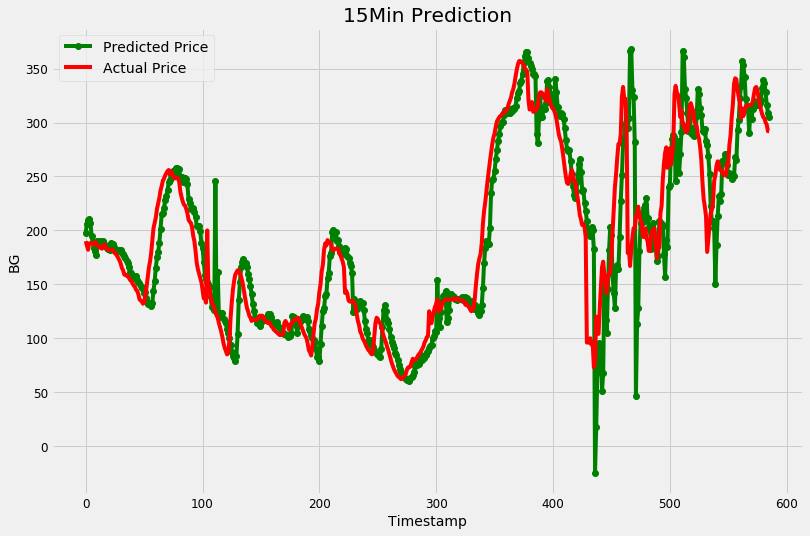

In [65]:
fig = plt.figure(figsize=(12,8))

# --------------------- Actual vs. Predicted --------------------------
#axes[0].plot(train, color='blue', label='Training Data')
plt.plot(forecasts_30, color='green', marker='o',
             label='Predicted Price')

plt.plot(test, color='red', label='Actual Price')
plt.title('15Min Prediction')
plt.xlabel('Timestamp')
plt.ylabel('BG')

#axes[0].set_xticks(np.arange(0, 7982, 1300).tolist(), df['Date'][0:7982:1300].tolist())
plt.legend()

#RMSE 13정도였음 


In [66]:
def uni_data(dataset,start_index,end_index, history_size, target_size):
    data=[]
    labels=[]
    
    start_index= start_index+history_size
    if end_index is None:
    #if end_index > len(dataset)-1:
        end_index = len(dataset)-target_size
        
    for i in range(start_index,end_index):
        indices = range(i-history_size,i)
        
        data.append(np.reshape(dataset[indices],(history_size,1)))
        #data.append(np.reshape(dataset[indices],(history_size)))
        labels.append(dataset[i+target_size])
    return np.array(data),np.array(labels)



In [67]:
#raw_seq = df['Glucose']
#raw_seq=raw_seq.to_numpy(dtype='int64')

In [68]:
import pmdarima as pm
#from pmdarima.model_selection import train_test_split

In [69]:

#train, test = train_test_split(raw_seq, train_size=0.7)

In [70]:
train.shape

(1366,)

In [71]:
df.head()

,index,Unnamed: 0,Timestamp,Event,Glucose
0,0,0,2020-07-23T11:00:04,교정,161.0
1,1,1,2020-07-23T11:05:27,교정,166.0
2,2,2,2020-07-23T20:28:15,교정,209.0
3,3,3,2020-07-23T20:29:14,EGV,182.0
4,4,4,2020-07-23T20:34:07,EGV,181.0


In [72]:
train

array([161, 166, 209, ..., 208, 201, 195], dtype=int64)

In [73]:
test.shape

(586,)

In [74]:
#model = pm.auto_arima(train, seasonal=True,m=6)

In [75]:
#forecasts = model.predict(test.shape[0])  # predict N steps into the future

In [76]:
#x = np.arange(raw_seq.shape[0])
#plt.plot(len(train), train, c='blue')
#plt.plot(len(test), forecasts, c='green')
#plt.show()

In [77]:
#plt.plot(forecasts)

In [78]:
#len(raw_seq) * 0.7

In [79]:
# SG필터 테스트 
#import scipy.signal 

#yhat = scipy.signal.savgol_filter(raw_seq,15,5)
#plt.plot(raw_seq)
#plt.plot(yhat,color='red')
#plt.show()

In [80]:
# SG필터 적용하는 부분 
# x_train_uni_origin 이런 식이었음 
#TRAIN_SPLIT=int(len(raw_seq)*0.7)
#uni_past_history=6
#uni_future_target=2 # 이거 -1이면 naive method 
#x_train_uni,y_train_uni = uni_data(,0,TRAIN_SPLIT,
#                                  uni_past_history,
#                                  uni_future_target)
#x_val_uni,y_val_uni=uni_data(yhat,TRAIN_SPLIT,None,
#                            uni_past_history,
#                            uni_future_target)

In [81]:
#TRAIN_SPLIT=int(len(raw_seq)*0.7)
#uni_past_history=6
#uni_future_target=2 # 이거 -1이면 naive method 
#x_train_uni_origin,y_train_uni_origin = uni_data(raw_seq,0,TRAIN_SPLIT,
#                                  uni_past_history,
#                                  uni_future_target)
#x_val_uni_origin,y_val_uni_origin=uni_data(raw_seq,TRAIN_SPLIT,None,
#                            uni_past_history,
#                            uni_future_target)

In [82]:
#arima_train,arima_test = uni_data(test,0,None,
#                                  uni_past_history,
#                                  uni_future_target)

In [83]:
TRAIN_SPLIT=int(len(raw_seq)*0.7)
uni_past_history=6
uni_future_target=2 # 이거 -1이면 naive method 
x_train_uni,y_train_uni = uni_data(raw_seq,0,TRAIN_SPLIT,
                                  uni_past_history,
                                  uni_future_target)
x_val_uni,y_val_uni=uni_data(raw_seq,TRAIN_SPLIT,None,
                            uni_past_history,
                            uni_future_target)

In [84]:
y_val_uni.shape

(578,)

In [85]:
y_train_uni.shape

(1360,)

In [86]:
#y_train_uni_origin[:10]

In [87]:
#y_train_uni.shape
df[:15]

,index,Unnamed: 0,Timestamp,Event,Glucose
0,0,0,2020-07-23T11:00:04,교정,161.0
1,1,1,2020-07-23T11:05:27,교정,166.0
2,2,2,2020-07-23T20:28:15,교정,209.0
3,3,3,2020-07-23T20:29:14,EGV,182.0
4,4,4,2020-07-23T20:34:07,EGV,181.0
5,5,5,2020-07-23T20:39:08,EGV,185.0
6,6,6,2020-07-23T20:44:08,EGV,187.0
7,7,7,2020-07-23T20:49:08,EGV,190.0
8,8,8,2020-07-23T20:54:09,EGV,192.0
9,9,9,2020-07-23T20:59:08,EGV,195.0


In [88]:
x_train_uni[5:10]

array([[[185],
        [187],
        [190],
        [192],
        [195],
        [197]],

       [[187],
        [190],
        [192],
        [195],
        [197],
        [197]],

       [[190],
        [192],
        [195],
        [197],
        [197],
        [196]],

       [[192],
        [195],
        [197],
        [197],
        [196],
        [189]],

       [[195],
        [197],
        [197],
        [196],
        [189],
        [183]]], dtype=int64)

In [89]:
y_train_uni[5:10]

array([189, 183, 176, 171, 170], dtype=int64)

In [90]:
#df['Glucose'].head(10)

In [91]:
x_train_uni.shape[-2:]

(6, 1)

## ARIMA_60MIN

In [92]:
#raw_seq = df['Glucose']
#raw_seq=raw_seq.to_numpy(dtype='int64')
def ARIMA_split_60(dataset,start_index,end_index, history_size, target_size):
    data=[]
    labels=[]
    
    start_index= start_index+history_size
    if end_index is None:
    #if end_index > len(dataset)-1:
        end_index = len(dataset)-target_size
        
    for i in range(start_index,end_index):
        indices = range(i-history_size,i)
        
        data.append(np.reshape(dataset[indices],(history_size,1)))
        #data.append(np.reshape(dataset[indices],(history_size)))
        #labels.append(dataset[i+target_size])
    return np.array(data)





In [93]:
TRAIN_SPLIT=int(len(raw_seq)*0.7)
uni_past_history=TRAIN_SPLIT - 12
uni_future_target= 12
# 이거 -1이면 naive method 

In [94]:
arima_train = ARIMA_split_60(raw_seq,0,None,
                                  uni_past_history,
                                  uni_future_target)

In [95]:
count = 1 
forecasts_60 = []
for i in range(len(arima_train)):
  n_diffs = param_d(arima_train[i])

  model = model_auto(arima_train[i])
  fc = model.predict(n_periods=12,verbose=1)
  forecasts_60.append(fc[11])
  print("-----")
  print(count)
  print("-----")
  print("appended :",fc[11])
  print("array :",forecasts_60)
  count+=1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9325.204, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9469.320, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9351.911, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9334.253, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9467.382, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9321.933, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9350.626, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9292.880, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9290.933, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9292.911, Time=0.42 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9293.143, Time=1.08 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9288.957, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9348.662, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9290.935, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9266.273, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9432.163, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9297.084, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9274.003, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9430.169, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9262.077, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9294.566, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9233.996, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9231.998, Time=0.26 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9233.998, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9233.761, Time=0.87 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9229.999, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9292.568, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9231.998, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9231.997, Time=0.21 sec
 ARIMA(2,1

 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9233.289, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9233.288, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9261.221, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9233.021, Time=0.36 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.935 seconds
-----
12
-----
appended : 194.61002960068112
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112]
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9267.645, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9433.567, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9298.693, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9275.525, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9431.567, Time=0

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9267.319, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9432.487, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9298.404, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9275.350, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9430.491, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9263.174, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9295.844, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9234.860, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9232.865, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9234.863, Time=0.37 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9234.617, Time=1.01 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9230.868, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9293.846, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9232.866, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9232.863, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9264.533, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9429.481, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.079, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9272.825, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9427.482, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9260.490, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9293.414, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.455, Time=0.65 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.459, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.457, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.152, Time=0.79 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.459, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9291.415, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.458, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.455, Time=0.41 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9264.465, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9429.415, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.012, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9272.755, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9427.417, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9260.427, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9293.347, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.364, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.369, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.367, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.068, Time=0.89 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.370, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9291.349, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.368, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.365, Time=0.41 sec
 ARIMA(2,1

 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.675, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.672, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9258.677, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9230.378, Time=0.35 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.523 seconds
-----
32
-----
appended : 181.60111943346254
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9264.548, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9429.497, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.111, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9272.850, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9427.498, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9260.505, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9293.441, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.505, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.509, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.507, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.195, Time=0.98 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.509, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9291.441, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.508, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.505, Time=0.33 sec
 ARIMA(2,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9272.880, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9427.546, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9260.535, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9293.486, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.464, Time=0.68 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.469, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.467, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.162, Time=0.91 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.470, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9291.487, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.468, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.465, Time=0.31 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9258.536, Time=0.16 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9230.162, Time=0.35 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.962 seconds

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9264.660, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9429.793, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.181, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9272.921, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9427.804, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9260.597, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9293.533, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.459, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.463, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.462, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.164, Time=0.80 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.469, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9291.540, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.467, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.464, Time=0.29 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9264.976, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9430.093, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.387, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9273.196, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9428.110, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9260.879, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9293.772, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.689, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.695, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.693, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.398, Time=0.93 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.702, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9291.783, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.700, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.696, Time=0.33 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9265.129, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9430.233, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.494, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9273.318, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9428.255, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9261.030, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9293.883, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.825, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.831, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.829, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.549, Time=0.81 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.840, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9291.897, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.838, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.834, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9265.328, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9430.481, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.653, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9273.492, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9428.512, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9261.226, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9294.058, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.944, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.951, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.948, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.683, Time=0.84 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.965, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9292.077, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.962, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.958, Time=0.19 sec
 ARIMA(2,1

 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9230.896, Time=0.38 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.754 seconds
-----
60
-----
appended : 131.46179239527464
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.4717700

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9265.066, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9430.308, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9296.699, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9273.398, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9428.335, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9261.003, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9294.060, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9232.789, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9230.793, Time=0.25 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9232.792, Time=0.39 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9232.468, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9228.807, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9292.077, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9230.806, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9230.803, Time=0.20 sec
 ARIMA(2,1

 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9233.073, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9261.578, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9232.728, Time=0.38 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.935 seconds
-----
70
-----
appended : 189.32832812951742
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.624680

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9271.374, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9439.379, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9301.788, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9278.893, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9437.416, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9266.693, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9299.570, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9237.212, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9235.224, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9237.219, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9236.956, Time=1.00 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9233.243, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9297.593, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9235.238, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9235.230, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9272.463, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9441.141, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9302.686, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9279.857, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9439.205, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9267.643, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9300.572, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9237.684, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9235.708, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9237.699, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9237.454, Time=0.91 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9233.740, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9298.613, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9235.731, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9235.716, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9273.091, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9442.080, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9303.072, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9280.382, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9440.163, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9268.159, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9301.070, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9237.759, Time=0.52 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9235.788, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9237.777, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9237.555, Time=0.99 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9233.824, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9299.119, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9235.812, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9235.793, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9273.213, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9442.269, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9303.113, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9280.465, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9440.371, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9268.252, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9301.135, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9237.780, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9235.813, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9237.801, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9237.589, Time=0.89 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9233.852, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9299.194, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9235.840, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9235.819, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9273.552, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9442.588, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9303.462, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9280.810, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9440.690, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9268.587, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9301.478, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9238.183, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9236.215, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9238.203, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9237.977, Time=1.00 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9234.250, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9299.535, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9236.238, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9236.218, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9274.290, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9442.888, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9304.051, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9281.561, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9440.993, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9269.283, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9302.114, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9238.888, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9236.921, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9238.909, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9238.670, Time=0.87 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9234.958, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9300.174, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9236.945, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9236.924, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9274.404, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9442.884, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9304.055, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9281.600, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9440.993, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9269.395, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9302.119, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9238.971, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9237.009, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9238.995, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9238.792, Time=0.90 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9235.048, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9300.181, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9237.033, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9237.008, Time=0.19 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9275.650, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9444.276, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9305.306, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9282.835, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9442.363, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9270.575, Time=0.45 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9303.368, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9240.317, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9238.355, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9240.341, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9240.088, Time=0.90 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9236.380, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9301.414, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9238.366, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9238.342, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9276.001, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9444.993, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9305.475, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9283.082, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9443.064, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9270.844, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9303.590, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9240.455, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9238.492, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9240.478, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9240.241, Time=1.03 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9236.515, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9301.630, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9238.501, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9238.477, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9276.017, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9445.406, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9305.739, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9283.225, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9443.462, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9270.850, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9303.846, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9240.421, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9238.454, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9240.442, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9240.129, Time=0.73 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9236.473, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9301.879, Time=0.04 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9238.461, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9238.440, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9274.761, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9445.143, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9304.770, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9282.010, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9443.192, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9269.485, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9302.825, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9239.182, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9237.210, Time=0.29 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9239.200, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9238.777, Time=0.88 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9235.224, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9300.851, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9237.213, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9237.194, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9275.381, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9446.171, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9305.467, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9282.641, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9444.210, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9270.051, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9303.524, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9239.624, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9237.663, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9239.649, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9239.206, Time=0.91 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9235.674, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9301.546, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9237.660, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9237.635, Time=0.18 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9278.015, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9449.948, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9307.668, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9285.001, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9447.960, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9272.410, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9305.882, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9241.519, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9239.558, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9241.544, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9241.088, Time=0.87 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9237.559, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9303.888, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9239.545, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9239.521, Time=0.23 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9278.252, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9450.636, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9307.869, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9285.224, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9448.642, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9272.479, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9306.147, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9241.330, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9239.372, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9241.356, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9240.833, Time=1.25 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9237.373, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9304.150, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9239.358, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9239.331, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9279.318, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9452.179, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9308.911, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9286.266, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9450.179, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9273.341, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9307.212, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9242.260, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9240.313, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9242.294, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9241.684, Time=0.81 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9238.313, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9305.212, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9240.294, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9240.260, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9461.616, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9564.996, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9476.060, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9468.157, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9562.997, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9457.961, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9477.330, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.962, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9425.770, Time=0.27 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.078, Time=0.30 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.114, Time=0.87 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9423.771, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9475.330, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9425.078, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9423.962, Time=0.22 sec
 ARIMA(2,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9478.531, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9564.453, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9480.336, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9460.569, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9444.531, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9473.403, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9441.598, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9441.448, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9443.411, Time=0.34 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9442.578, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9482.453, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9443.497, Time=0.28 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9443.206, Time=0.97 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9439.448, Time=0.24 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9471.403, Time=0.18 sec
 ARIMA(3,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.535, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9555.837, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9468.359, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.431, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.683, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9462.357, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.039, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.312, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.097, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.597, Time=0.68 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9470.646, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.521, Time=0.25 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9431.718, Time=1.54 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9427.313, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9460.358, Time=0.17 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9468.214, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9558.244, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.001, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.881, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9556.248, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9468.707, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.639, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.444, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9463.227, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.242, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.458, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.321, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.755, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9470.980, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.700, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9468.288, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9558.418, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.054, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.948, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9556.423, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9468.777, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.643, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.478, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9463.327, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.251, Time=0.52 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.475, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.363, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.769, Time=0.68 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9471.034, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.736, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9468.740, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9559.013, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.481, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9467.393, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9557.024, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9469.225, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.929, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.709, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9463.707, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.515, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.755, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.674, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.036, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9471.462, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9432.034, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9469.148, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9559.579, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.820, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9467.777, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9557.594, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9469.616, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9449.121, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.921, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9464.080, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.760, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9430.016, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.945, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.282, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9471.804, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9432.303, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9469.583, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9560.256, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9470.169, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9468.174, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9558.282, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9470.023, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9449.324, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.154, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9464.475, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.924, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9430.131, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9433.139, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.426, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9472.155, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9432.431, Time=0.28 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9469.710, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9560.371, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9470.302, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9468.310, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9558.399, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9470.157, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9449.322, Time=0.26 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.107, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9464.587, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.888, Time=0.77 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9430.124, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9433.168, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.397, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9472.289, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9432.451, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9468.740, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9559.908, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.439, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9467.352, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9557.916, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9469.192, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.035, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.739, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9463.588, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9429.666, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9428.994, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.253, Time=0.34 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.182, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9471.421, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.467, Time=0.38 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9475.112, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9568.955, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9475.544, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9473.560, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9566.955, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9475.443, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9454.618, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9440.621, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9469.768, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9436.813, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9436.084, Time=0.35 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9438.975, Time=0.28 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9437.323, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9477.526, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9438.351, Time=0.40 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9475.370, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9569.347, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9475.784, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9473.824, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9567.347, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9475.706, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9455.337, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9441.326, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9470.007, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9437.385, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9436.580, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9439.124, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9437.873, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9477.769, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9438.625, Time=0.40 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9468.391, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9560.816, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.359, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.993, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9558.823, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9468.826, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9450.421, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9436.638, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9463.411, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9432.836, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9431.942, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9434.032, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9433.298, Time=0.88 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9471.310, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9433.735, Time=0.41 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9465.618, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9556.394, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9466.947, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.364, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9554.416, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.152, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.666, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.946, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9460.878, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9431.197, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9430.276, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.136, Time=0.28 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.649, Time=0.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9468.874, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.947, Time=0.40 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9461.914, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9551.533, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9463.749, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9460.843, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9549.597, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9462.568, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9446.368, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9432.722, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9457.467, Time=0.52 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9429.040, Time=0.72 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9428.093, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9429.677, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9429.490, Time=0.94 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9465.628, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9429.637, Time=0.29 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9459.933, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9548.668, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9462.073, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.991, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9546.798, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9460.671, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9445.140, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9431.452, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9455.663, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9427.663, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9426.676, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9428.217, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9428.110, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9463.924, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9428.197, Time=0.34 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.861, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.418, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.002, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.930, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.632, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.607, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.218, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.483, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.594, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.566, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.541, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.081, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.004, Time=0.95 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.855, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.050, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9459.019, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.739, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.086, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.059, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9546.001, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.747, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.281, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.532, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.710, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.575, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.540, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.092, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.011, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.947, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.051, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9459.178, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.929, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.197, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.204, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9546.223, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.897, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.343, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.582, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.841, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.614, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.578, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.149, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.051, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9463.064, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.098, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9459.331, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9548.051, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.320, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.343, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9546.355, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9460.040, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.476, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.752, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.999, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.777, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.728, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.308, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.208, Time=0.88 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9463.189, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.247, Time=0.29 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9459.097, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.841, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.089, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.106, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9546.164, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.804, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.288, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.589, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.771, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.633, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.583, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.137, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.064, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.956, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.089, Time=0.23 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9459.002, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.741, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.988, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.009, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9546.060, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.708, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.186, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.491, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.684, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.508, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.451, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.010, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.936, Time=0.88 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.856, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.957, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.867, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.538, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.861, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.878, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.868, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.575, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.069, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.378, Time=0.51 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.559, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.400, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.349, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.911, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.830, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.727, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.860, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.862, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.482, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.861, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.877, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.824, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.573, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.051, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.354, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.561, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.373, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.328, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.910, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.806, Time=0.92 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.728, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.853, Time=0.22 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.903, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.547, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.924, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.928, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.913, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.621, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.087, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.362, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.600, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.361, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.314, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.902, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.793, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.789, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.839, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.671, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.220, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.693, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.703, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.573, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.394, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.853, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.107, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.360, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.111, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.072, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.652, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.547, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.560, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.596, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.342, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.848, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.366, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.375, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.175, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.066, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.532, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.793, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.041, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.798, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.759, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.350, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.234, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.232, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.292, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.382, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.900, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.407, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.417, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.234, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.108, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.559, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.809, Time=0.53 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.078, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.807, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.772, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.361, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.245, Time=0.88 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.274, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.305, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.431, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.943, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.446, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.464, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.293, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.155, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.590, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.835, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.120, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.832, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.798, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.385, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.271, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.315, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.330, Time=0.31 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.374, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.887, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.369, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.401, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.249, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9459.095, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.505, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.754, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9454.053, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.753, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.718, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.299, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.191, Time=0.92 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.240, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.246, Time=0.26 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.267, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.777, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.250, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.292, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.130, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9458.987, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.371, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.608, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9453.940, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.582, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.541, Time=0.67 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.134, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9426.018, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.123, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.071, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.225, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.702, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.212, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.251, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.071, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9458.947, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.320, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.558, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9453.900, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.536, Time=0.58 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.489, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.095, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9425.969, Time=0.88 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.085, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9426.021, Time=0.21 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.174, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.635, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9460.159, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.203, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.012, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9458.897, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9443.244, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.475, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9453.848, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.461, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.426, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9426.004, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9425.896, Time=0.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9462.033, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9425.946, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9459.346, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.867, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9461.156, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.298, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9546.178, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9460.018, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.402, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9430.803, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9455.001, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.848, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.792, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.334, Time=0.11 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.275, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9463.039, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.293, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.085, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9547.075, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9459.868, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.007, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9545.440, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9458.734, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9442.857, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9429.256, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9453.698, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9425.357, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9424.323, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9425.940, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9425.786, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9461.752, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9425.863, Time=0.30 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9457.325, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9546.058, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9459.201, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9456.289, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9544.377, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9458.003, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9442.419, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9428.803, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9452.963, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9424.962, Time=0.72 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9423.937, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9425.477, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9425.406, Time=0.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9461.076, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9425.455, Time=0.38 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9457.067, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.776, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9458.999, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9456.045, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9544.052, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9457.753, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9442.330, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9428.740, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9452.737, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9424.930, Time=0.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9423.908, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9425.396, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9425.374, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9460.866, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9425.403, Time=0.35 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.925, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.514, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9458.895, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9455.919, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.756, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9457.621, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9442.293, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9428.718, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9452.618, Time=0.44 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9424.930, Time=0.52 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9423.915, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9425.370, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9425.375, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9460.757, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9425.396, Time=0.34 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.527, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9544.836, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9458.632, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9455.572, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.047, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9457.255, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9442.082, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9428.506, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9452.305, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9424.718, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9423.703, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9425.197, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9425.163, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9460.480, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9425.208, Time=0.48 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9454.796, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.560, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9456.893, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9453.873, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.723, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9455.551, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9440.261, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.588, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9450.556, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9422.777, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9421.769, Time=0.50 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9423.255, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9423.220, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9458.750, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9423.261, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9454.892, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.775, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9456.970, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9453.952, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.960, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9455.633, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9440.364, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.761, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9450.687, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9422.915, Time=0.53 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9421.882, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9423.366, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9423.348, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9458.827, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9423.362, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9455.047, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.994, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.103, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.103, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9541.197, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9455.787, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9440.479, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.825, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9450.799, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9422.985, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9421.954, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9423.433, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9423.425, Time=0.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9458.964, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9423.431, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9454.946, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.965, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.044, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.036, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9541.167, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9455.712, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9440.300, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.446, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9450.666, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9422.363, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9421.314, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9422.864, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9422.806, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9458.908, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9422.822, Time=0.41 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9455.479, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9543.757, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.500, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.534, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9541.996, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.221, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9440.654, Time=0.24 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9426.821, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.156, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9422.686, Time=0.69 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9421.600, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9423.134, Time=0.31 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9423.113, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9459.377, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9423.077, Time=0.36 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9448.860, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9536.755, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9451.225, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9448.044, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9535.112, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9449.681, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9433.713, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9419.655, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9444.772, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9415.192, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9414.099, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9416.353, Time=0.11 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9415.605, Time=0.94 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9453.070, Time=0.09 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9415.930, Time=0.29 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9450.815, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9539.102, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9453.059, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9449.945, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9537.415, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9451.601, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9435.518, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9421.492, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9446.647, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9417.070, Time=0.69 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.993, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9418.155, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9417.489, Time=0.90 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9454.916, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9417.783, Time=0.38 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9450.021, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9538.247, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9452.259, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9449.138, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9536.450, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9450.796, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9435.052, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9421.168, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9445.883, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9416.826, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.720, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9417.664, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9417.223, Time=0.90 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9454.111, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9417.377, Time=0.35 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9450.080, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9538.322, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9452.203, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9449.158, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9536.450, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9450.832, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9434.957, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9421.069, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9445.896, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9416.667, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9415.542, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9417.518, Time=0.27 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9417.059, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9454.068, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9417.210, Time=0.30 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9451.812, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9540.043, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9453.646, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9450.796, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9538.113, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9452.506, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9436.046, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9422.149, Time=0.34 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9447.525, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9417.600, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.459, Time=0.49 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9418.698, Time=0.21 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9417.994, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9455.541, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9418.259, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9452.437, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9541.414, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9453.861, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9451.257, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9539.448, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9453.022, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9435.821, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9422.014, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9447.991, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9417.421, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9416.268, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9418.686, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9417.803, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9455.787, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9418.144, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9455.395, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9544.794, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9456.373, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.054, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9542.810, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9455.870, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9437.762, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9424.116, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9450.844, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9419.445, Time=0.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9418.271, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9420.939, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9419.807, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9458.328, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9420.244, Time=0.22 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9455.944, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.194, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.016, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.655, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.209, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.458, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9438.342, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9424.495, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.324, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9419.819, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9418.672, Time=0.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9421.301, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9420.197, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9458.970, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9420.638, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.128, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.180, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.169, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.837, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.195, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.642, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9438.688, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9424.839, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.472, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9420.242, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9419.102, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9421.612, Time=0.22 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9420.630, Time=0.77 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9459.125, Time=0.10 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9421.016, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.007, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.004, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.032, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.713, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.017, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.520, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9438.748, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9424.902, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.336, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9420.270, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9419.095, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9421.531, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9420.650, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9458.988, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9420.959, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.109, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.122, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.146, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.816, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.136, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.621, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9438.859, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9425.040, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.458, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9420.397, Time=0.58 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9419.219, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9421.660, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9420.773, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9459.102, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9421.083, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.073, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.050, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.112, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.781, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.062, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.586, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9438.837, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9425.019, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.426, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9420.375, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9419.197, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9421.631, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9420.750, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9459.068, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9421.058, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.258, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.212, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.307, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9454.971, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.224, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.775, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9439.057, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9425.220, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.606, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9420.585, Time=0.51 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9419.418, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9421.843, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9420.966, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9459.262, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9421.282, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.383, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.373, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.402, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9455.085, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.387, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9456.892, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9439.160, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9425.335, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9451.717, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9420.716, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9419.549, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9421.967, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9421.097, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9459.358, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9421.410, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9456.762, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9545.841, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9457.752, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9455.452, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9543.860, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9457.263, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9439.475, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9425.651, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9452.084, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9421.012, Time=0.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9419.838, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9422.265, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9421.389, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9459.710, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9421.695, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9465.859, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.219, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9466.779, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.565, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.258, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.376, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.566, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.721, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.178, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.088, Time=0.58 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9428.918, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.399, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.475, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9468.745, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.813, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.598, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.798, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.344, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9465.260, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.846, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9467.088, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.859, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.921, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.774, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.261, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.087, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.596, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.647, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9469.320, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.989, Time=0.24 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.581, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.798, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.336, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9465.246, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.846, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9467.073, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.898, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.962, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.767, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.272, Time=0.69 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.105, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.571, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.658, Time=0.77 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9469.311, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.980, Time=0.25 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.585, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.766, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.335, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9465.249, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.816, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9467.077, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.919, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.971, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.750, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.326, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.150, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.614, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.712, Time=0.90 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9469.311, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.019, Time=0.27 sec
 ARIMA(4,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.758, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.946, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.494, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9465.415, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9553.007, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9467.244, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9449.027, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.094, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.914, Time=0.30 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.493, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.329, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.804, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.882, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9469.470, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.208, Time=0.24 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9430.800, Time=0.62 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.256 seconds
-----
246
-----
appended : 114.93125506574728
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.471770

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9467.761, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9556.397, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9468.410, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.380, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9554.489, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9468.220, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9449.808, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.914, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9462.864, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9431.403, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9430.260, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.697, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.797, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9470.389, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9432.124, Time=0.24 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9431.344, Time=0.53 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.318 seconds
-----
249
-----
appended : 96.36686823847323
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.4717700

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9468.347, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9557.096, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9468.891, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.938, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9555.222, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9468.787, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9450.023, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9436.072, Time=0.32 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9463.385, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9431.500, Time=0.54 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9430.360, Time=0.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.922, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.896, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9470.875, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9432.285, Time=0.32 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9431.284, Time=0.60 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.899 seconds
-----
252
-----
appended : 92.9654712455405
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.47177001

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9467.829, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9556.384, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9468.457, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.455, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9554.504, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9468.295, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9449.525, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9435.546, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9462.914, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.926, Time=0.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.791, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9432.335, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9431.317, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9470.440, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.698, Time=0.32 sec
 ARIMA(4,1

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9432.959, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9429.222, Time=0.10 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9430.174, Time=0.55 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.595 seconds
-----
255
-----
appended : 87.02676716885699
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.624680

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.725, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9555.069, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9467.308, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9465.342, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9553.169, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9467.185, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.379, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.478, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.804, Time=0.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.037, Time=0.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9428.950, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.445, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.446, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9469.292, Time=0.09 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.861, Time=0.31 sec
 ARIMA(4,1

 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9432.538, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9428.938, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9429.859, Time=0.56 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.148 seconds
-----
258
-----
appended : 82.7757685963111
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9465.883, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.097, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9466.449, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.499, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.170, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.343, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9447.278, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9433.345, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9460.955, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9428.947, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9427.924, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9430.512, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9429.373, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9468.434, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9429.912, Time=0.24 sec
 ARIMA(4,1

 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9429.483, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9468.718, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9433.865, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9430.398, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9431.253, Time=0.52 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.862 seconds
-----
261
-----
appended : 112.23047111482728
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9469.510, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9559.049, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9469.948, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9468.038, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9557.082, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9469.903, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9451.033, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9437.221, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9464.496, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9432.888, Time=0.52 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9431.831, Time=0.35 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9434.281, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9433.306, Time=0.69 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9471.933, Time=0.11 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9433.743, Time=0.30 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9431.522, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9431.101, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9470.024, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9435.372, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9431.985, Time=0.07 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9432.869, Time=0.47 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.608 seconds
-----
264
-----
appended : 126.13911717820686
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.586

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.174, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.338, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9466.774, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.781, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.420, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.625, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.273, Time=0.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.511, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.310, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.216, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.170, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.503, Time=0.15 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.639, Time=0.65 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9468.753, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9431.040, Time=0.24 sec
 ARIMA(4,1

 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9428.936, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9428.176, Time=0.36 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9427.756, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9466.204, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9432.056, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9428.513, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9429.527, Time=0.52 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.437 seconds
-----
267
-----
appended : 107.70147120859791
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9465.872, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.232, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9466.495, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.486, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.361, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.328, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.235, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.457, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9460.985, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.099, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9428.995, Time=0.39 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.179, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.505, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9468.474, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.759, Time=0.24 sec
 ARIMA(4,1

 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9429.283, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9428.600, Time=0.34 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9428.193, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9466.614, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9432.552, Time=0.19 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9428.859, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9429.951, Time=0.58 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.487 seconds
-----
270
-----
appended : 92.9119509620681
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.074, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.532, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9466.655, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.673, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.699, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.520, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.412, Time=0.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.618, Time=0.51 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.158, Time=0.33 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.224, Time=0.70 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.107, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.293, Time=0.28 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.627, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9468.635, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.868, Time=0.37 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9427.197, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9459.306, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9429.406, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9428.715, Time=0.41 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9428.311, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9466.783, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9432.706, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9428.970, Time=0.14 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9430.063, Time=0.71 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.306 seconds
-----
273
-----
appended : 83.46685625176816
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9466.012, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9554.409, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9466.662, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.639, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.640, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9466.478, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9448.474, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.644, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9461.124, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9430.200, Time=0.60 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9429.084, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9431.230, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.602, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9468.641, Time=0.15 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.825, Time=0.37 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9427.151, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9459.150, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9429.305, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9428.665, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9428.258, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9466.606, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9432.650, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9428.903, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9430.015, Time=0.54 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.921 seconds
-----
276
-----
appended : 70.36402071745992
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9465.222, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9553.764, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9465.805, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9463.807, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9552.067, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9465.656, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9447.708, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9434.012, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9460.346, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9429.655, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9428.523, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9430.704, Time=0.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9430.052, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9467.783, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9430.280, Time=0.41 sec
 ARIMA(4,1

 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9430.844, Time=1.22 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9426.079, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9457.900, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9428.247, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9427.603, Time=0.38 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9427.202, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9465.278, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9431.540, Time=0.28 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9427.837, Time=0.18 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9428.957, Time=0.55 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.918 seconds
-----
279
-----
appended : 64.41875633498404
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9463.258, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9551.465, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9463.843, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9461.845, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9549.862, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9463.694, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9445.929, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9432.292, Time=0.54 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9458.400, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9428.010, Time=0.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9426.876, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9429.021, Time=0.26 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9428.410, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9465.820, Time=0.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9428.622, Time=0.32 sec
 ARIMA(4,1

 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9428.535, Time=0.34 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9429.669, Time=1.33 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9424.938, Time=0.23 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9456.547, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9427.095, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9426.467, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9426.063, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9463.963, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9430.338, Time=0.21 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9426.694, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9427.808, Time=0.57 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.950 seconds
-----
282
-----
appended : 61.25638197794201
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9462.594, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9550.620, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9463.205, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9461.191, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9549.082, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9463.037, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9445.384, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9431.781, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9457.761, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9427.527, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9426.399, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9428.515, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.931, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9465.180, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9428.140, Time=0.24 sec
 ARIMA(4,1

 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9428.177, Time=0.22 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9429.314, Time=1.16 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9424.596, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9456.078, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9426.737, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9426.124, Time=0.35 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9425.719, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9463.480, Time=0.05 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9429.970, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9426.350, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9427.466, Time=0.60 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.116 seconds
-----
285
-----
appended : 62.69432649677801
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9462.218, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9550.121, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9462.851, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9460.828, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9548.611, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9462.670, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9445.079, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9431.470, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9457.392, Time=0.48 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9427.179, Time=0.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9426.031, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9428.099, Time=0.18 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.575, Time=0.90 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9464.826, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.735, Time=0.27 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.583, Time=0.71 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9464.773, Time=0.14 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.730, Time=0.23 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9428.931, Time=1.19 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9424.209, Time=0.28 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9455.648, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9426.287, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9425.748, Time=0.37 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9425.351, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9463.068, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9429.615, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9425.920, Time=0.11 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9427.096, Time=0.59 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.135 seconds
-----
288
-----
appended : 69.24817606554367
array : [233.0993998

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9427.173, Time=0.61 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.176 seconds
-----
289
-----
appended : 75.14844580090042
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.4717700

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9462.273, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9550.237, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9462.886, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9460.877, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9548.699, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9462.721, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9445.115, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9431.513, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9457.449, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9427.165, Time=0.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9426.011, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9428.064, Time=0.20 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.558, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9464.862, Time=0.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.703, Time=0.36 sec
 ARIMA(4,1

 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.362, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9464.648, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.503, Time=0.25 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9428.702, Time=1.35 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9423.977, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9455.471, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9426.061, Time=0.10 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9425.517, Time=0.40 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9425.122, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9462.932, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9429.335, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9425.681, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9426.856, Time=0.66 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 7.988 seconds
-----
292
-----
appended : 76.24969101913199
array : [233.0993998

 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9426.746, Time=0.55 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0]          
Total fit time: 8.147 seconds
-----
293
-----
appended : 81.79993948095178
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.4717700

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9462.015, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9549.837, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9462.654, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9460.614, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9548.331, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9462.456, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9444.508, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9431.095, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9457.248, Time=0.46 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9426.953, Time=0.80 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.813, Time=0.45 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.832, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.310, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9464.628, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.458, Time=0.25 sec
 ARIMA(4,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9425.800, Time=0.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9427.844, Time=0.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9427.315, Time=0.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9464.664, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9427.313, Time=0.34 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9428.700, Time=1.52 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9423.962, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9455.473, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9426.050, Time=0.09 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9425.480, Time=0.39 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=9425.009, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9462.958, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9428.749, Time=0.29 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9425.489, Time=0.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=9426.865, Time=0.61 sec

Best mode

 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9424.929, Time=0.43 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 6.692 seconds
-----
297
-----
appended : 81.24785660224049
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.4717700

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9458.409, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9549.905, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9454.486, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9447.149, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9548.390, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9448.904, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9438.190, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9427.010, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9448.433, Time=0.62 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9409.516, Time=0.61 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9409.010, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9415.140, Time=0.33 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9409.654, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9454.341, Time=0.26 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9407.689, Time=0.48 sec
 ARIMA(5,1

 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9165.129, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9191.740, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9167.164, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9161.803, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9216.023, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9166.259, Time=0.11 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=9163.753, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=9163.769, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=9284.824, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=9190.447, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9162.162, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=9165.803, Time=0.21 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.723 seconds
-----
300
-----
appended : 89.55016828679236
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.2493747473140

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=9121.163, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=9124.176, Time=0.21 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.968 seconds
-----
301
-----
appended : 91.87201585949889
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8454.789, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8767.364, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8571.359, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.563, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8765.432, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8430.858, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8438.895, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8432.374, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8431.996, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8430.050, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8522.117, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8432.023, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8482.863, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8434.049, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8428.061, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8430.147, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8647.836, Time=0.13 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8480.983, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8428.962, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8432.176, Time=0.15 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.503 seconds
-----
305
-----
appended : 104.70964188931814
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8454.328, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8767.983, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8571.476, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8649.943, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8766.036, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8430.325, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8438.492, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8431.847, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8431.477, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8429.535, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8522.141, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8431.506, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8482.807, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8433.533, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8427.549, Time=0.11 sec
 ARIMA(0,1

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8447.381, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8445.449, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8537.879, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8447.416, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8499.066, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8449.155, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8443.449, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8535.882, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8468.030, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8445.381, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8445.416, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8662.872, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8497.068, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8444.166, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8447.155, Time=0.50 sec

Best mode

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8480.772, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8783.179, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8598.514, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8671.799, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8781.183, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8456.649, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8466.450, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8458.004, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8457.451, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8455.452, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8548.457, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8457.451, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8508.343, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8456.883, Time=1.50 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8453.453, Time=0.12 sec
 ARIMA(0,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8457.931, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8457.443, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8455.451, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8547.816, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8457.447, Time=0.27 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8509.146, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8459.448, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8453.451, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8545.816, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8478.304, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8455.444, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8455.448, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8669.464, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8507.146, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8454.419, Time=0.09 sec
 ARIMA(2,1

 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8545.572, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8478.282, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8455.352, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8455.363, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8669.727, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8506.995, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8454.268, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8457.131, Time=0.49 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.211 seconds
-----
313
-----
appended : 140.69907980876596
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 

 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8457.360, Time=0.15 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.058 seconds
-----
314
-----
appended : 141.16619366368573
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 176.3607775807142, 173.9978849341755, 171.84799792087597, 169.471770

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8484.308, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8786.192, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8600.982, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8674.532, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8784.192, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8460.260, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8469.393, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8461.756, Time=0.82 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8461.283, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8459.300, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8550.990, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8461.292, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8511.747, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8463.079, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8457.302, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.579, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8461.670, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8512.321, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8463.463, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8457.679, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8549.579, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8482.128, Time=0.09 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8459.661, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8459.670, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8672.751, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8510.321, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8458.573, Time=0.09 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8461.464, Time=0.43 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.290 seconds
-----
318
-----
appended : 126.32210639653957
array : [233.099399

 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8549.819, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8481.615, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8459.911, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8459.951, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8673.282, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8511.159, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8458.543, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8461.671, Time=0.39 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.005 seconds
-----
319
-----
appended : 140.1320404889661
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 1

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8455.898, Time=0.12 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8459.078, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.841 seconds
-----
320
-----
appended : 142.21999912097945
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 17

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8782.300, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8601.482, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8673.509, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8780.300, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8455.273, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8467.222, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8456.964, Time=0.55 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8456.725, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8454.835, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8551.068, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8456.778, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8512.219, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8458.492, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8452.855, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8549.070, Time=0.08 sec
 ARIMA(1,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8451.406, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8462.788, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8453.093, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8452.847, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8450.950, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8542.597, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8452.896, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8504.981, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8454.614, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8448.957, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8540.598, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8472.453, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8450.854, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8450.904, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8659.499, Time=0.06 sec
 ARIMA(0,1

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8446.540, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8534.120, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8448.477, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8497.588, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8450.214, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8444.540, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8532.133, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8467.945, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8446.424, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8446.478, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8648.626, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8495.595, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8444.980, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8448.215, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.966 seconds

 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8489.289, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8443.843, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8438.230, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8521.843, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8461.444, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8440.075, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8440.149, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8636.820, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8487.317, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8438.541, Time=0.10 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8441.845, Time=0.32 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.927 seconds
-----
325
-----
appended : 135.88998666025108
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 20

 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8515.733, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8456.653, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8435.576, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8435.630, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8628.206, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8481.879, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8434.079, Time=0.13 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8437.342, Time=0.41 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 5.118 seconds
-----
326
-----
appended : 135.93182021721694
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 

 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8623.341, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8477.820, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8430.717, Time=0.09 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8433.889, Time=0.36 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.770 seconds
-----
327
-----
appended : 135.97988020734283
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181

 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8425.540, Time=0.13 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=8428.675, Time=0.43 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0]          
Total fit time: 4.443 seconds
-----
328
-----
appended : 136.00049796153957
array : [233.09939980957654, 232.51102243642117, 230.74044891230338, 226.24937474731402, 222.94675842308703, 222.68372636926298, 195.80019212912177, 206.21497112060598, 209.95776272406482, 210.11919248798395, 206.98063040599308, 194.61002960068112, 188.35505113346335, 182.75448581476834, 180.02512271403353, 176.54605503810683, 190.33699060849077, 187.40119404933213, 190.2583215381173, 188.0, 186.2609644512701, 190.32662614415491, 187.18632866538533, 185.12545306084107, 183.58646110349494, 182.36077666826043, 183.47457575286904, 181.886464388112, 188.06325398039124, 187.8117622585518, 184.8008042432743, 181.60111943346254, 180.21219792543087, 181.09965321893085, 181.6246807647601, 182.0, 182.0, 178.52457732822097, 177.96190882106632, 17

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8450.107, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8707.789, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8559.778, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8616.943, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8706.165, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8426.781, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8437.093, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8428.437, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8428.148, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8426.219, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8505.545, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8428.185, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8472.183, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8429.917, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8424.286, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8559.679, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8616.672, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8705.478, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8426.708, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8436.975, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8428.367, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8428.082, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8426.157, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8505.139, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8428.121, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8472.026, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8429.850, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8424.228, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8503.349, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8448.132, Time=0.08 sec
 ARIMA(2,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8613.896, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.757, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8425.166, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8435.389, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8426.835, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8426.535, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8424.591, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8503.168, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8426.565, Time=0.27 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8470.418, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8428.298, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8422.679, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8501.409, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8446.333, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8424.621, Time=0.14 sec
 ARIMA(1,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8425.166, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8435.388, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8426.836, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8426.534, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8424.590, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8503.169, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8426.565, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8470.392, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8428.298, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8422.679, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8501.410, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8446.333, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8424.621, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8424.652, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8612.159, Time=0.05 sec
 ARIMA(0,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8425.477, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8425.197, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8423.275, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.308, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8425.237, Time=0.27 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8468.344, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8426.987, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8421.392, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8499.601, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8445.263, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8423.312, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8423.352, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8610.845, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8466.589, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8421.942, Time=0.09 sec
 ARIMA(2,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8425.070, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8424.822, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8422.925, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.243, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8424.875, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8467.876, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8426.601, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8421.053, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.564, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8444.773, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8422.948, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8423.001, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8610.120, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8466.138, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8421.507, Time=0.10 sec
 ARIMA(2,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8424.698, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8424.461, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8422.584, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8499.857, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8424.523, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8467.539, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8426.241, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8420.699, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.156, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8444.636, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8422.573, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8422.636, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8610.120, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8465.782, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8421.119, Time=0.10 sec
 ARIMA(2,1

 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8424.690, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8424.451, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8422.573, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8499.859, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8424.512, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8467.539, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8426.231, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8420.689, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.159, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8444.620, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8422.565, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8422.627, Time=0.21 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8610.109, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=8465.782, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8421.114, Time=0.11 sec
 ARIMA(2,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.043, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.636, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.733, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.466, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.567, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8494.187, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.522, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.379, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.211, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.744, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8492.574, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8439.342, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8416.639, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8416.697, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8605.912, Time=0.06 sec
 ARIMA(0,1

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8416.535, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.271, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.249, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8417.994, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.097, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.863, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.053, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.295, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8419.730, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.248, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8492.218, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8438.620, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8416.143, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=8416.203, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8605.449, Time=0.05 sec
 ARIMA(0,1

 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8607.066, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.914, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8416.585, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.309, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.297, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.039, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.138, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.796, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.096, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.233, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8419.774, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.292, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8492.172, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8438.714, Time=0.17 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8416.191, Time=0.23 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8697.207, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.961, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8607.132, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.914, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8415.561, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8425.374, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8417.233, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8416.947, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8415.040, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.599, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8416.998, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.287, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8418.692, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8413.171, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8491.964, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8438.329, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8694.453, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.552, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8605.203, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8693.256, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8413.587, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8423.805, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8415.181, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8414.740, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8412.759, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8492.478, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8414.751, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8459.419, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8416.474, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8410.926, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8435.488, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8691.630, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8546.064, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8602.692, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8690.510, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8409.612, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8419.697, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8411.006, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8410.521, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8408.543, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8488.449, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8410.532, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8453.547, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8412.347, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8406.753, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8435.303, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8691.483, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8545.379, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8602.313, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8690.371, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8409.365, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8418.824, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8410.830, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8410.408, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8408.457, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8486.942, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8410.432, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8452.947, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8412.209, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8406.669, Time=0.16 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8434.997, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8692.376, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8546.443, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8603.580, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8691.148, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8407.156, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8416.431, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8408.607, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8408.185, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8406.292, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8485.852, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8408.233, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8451.294, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8409.952, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8404.426, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8696.748, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8546.487, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8605.628, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.389, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8408.469, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8417.289, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8409.878, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8409.486, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8407.603, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8487.631, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8409.533, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8451.975, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8411.299, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8405.673, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8485.916, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8425.063, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8688.935, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8536.591, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8596.400, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8687.646, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8397.531, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8406.714, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8398.723, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8397.993, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8395.998, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8478.684, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8397.995, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8440.920, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8399.841, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8394.109, Time=0.08 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8690.983, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8537.386, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.830, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8689.649, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8397.403, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8406.498, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8398.545, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8397.787, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8395.793, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8478.913, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8397.790, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8440.526, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8399.642, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8393.907, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8477.257, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8425.128, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8691.443, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8536.921, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.747, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8690.093, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8397.253, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8406.113, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8398.416, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8397.700, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8395.710, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8478.275, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8397.704, Time=0.30 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8440.091, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8399.549, Time=1.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8393.836, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8423.536, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8691.500, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8536.451, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.628, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8690.093, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8394.973, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8404.026, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8396.031, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8395.277, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8393.286, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8477.207, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8395.280, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8438.129, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8397.145, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8391.386, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8424.809, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8694.220, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8538.761, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8600.262, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8692.757, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8396.357, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8405.644, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8397.467, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8396.788, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8394.808, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8479.669, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8396.795, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8440.655, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8398.645, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8392.877, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8543.494, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8605.527, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8400.148, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8409.714, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8401.360, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.839, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.908, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8484.502, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.864, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8445.511, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.683, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.964, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8482.723, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8426.361, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8701.641, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8541.683, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8605.047, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8700.112, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8398.250, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8407.589, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8399.495, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8399.045, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8397.151, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8482.925, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8399.081, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8443.741, Time=0.50 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8400.901, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8395.215, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8481.159, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8703.355, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8542.026, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8606.077, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8701.765, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8397.951, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8407.320, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8399.187, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8398.729, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8396.828, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8482.937, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8398.762, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8443.511, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8400.585, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8394.886, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8481.149, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8706.130, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8543.705, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8608.328, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8704.489, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8398.337, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8407.994, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8399.542, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8399.060, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8397.146, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8484.909, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8399.089, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8444.562, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8400.920, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8395.195, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8483.087, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8426.841, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8708.808, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8545.051, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.256, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8707.125, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8398.912, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8408.864, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.153, Time=0.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8399.671, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8397.751, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8486.861, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8399.699, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8446.488, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8401.520, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8395.793, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8710.812, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8545.753, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8611.555, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8709.099, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8398.901, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8408.985, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.178, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8399.737, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8397.835, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8487.504, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8399.771, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8447.325, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8401.584, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8395.876, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8485.647, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.047, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8713.071, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8546.861, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8613.210, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8711.316, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.256, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8409.475, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.543, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.134, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.250, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8488.594, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.173, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8448.072, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8401.987, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.284, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.182, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8714.855, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8547.620, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8614.432, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8713.065, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.436, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8409.776, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.727, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.330, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.454, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8489.541, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.370, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8448.623, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.186, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.485, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.408, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8716.610, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.487, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8615.727, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8714.784, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.699, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8410.147, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8401.003, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.618, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.750, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8490.471, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.661, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8449.419, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.476, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.777, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.416, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8717.511, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.795, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8616.304, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8715.657, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.694, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8410.182, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8401.000, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.616, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.748, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8490.787, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.659, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8449.683, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.472, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.771, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.288, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8717.725, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.644, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8616.305, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8715.848, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.534, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8409.993, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.827, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.428, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.551, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8490.683, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.468, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8449.489, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.284, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.570, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.376, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8718.724, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.298, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8617.151, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8716.828, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.714, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8410.320, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8401.018, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.635, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.765, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8491.397, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.677, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8450.043, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.498, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.782, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.436, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8719.315, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.488, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8617.487, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8717.400, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.841, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8410.501, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8401.154, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.780, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.915, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8491.750, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.823, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8450.343, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.643, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.929, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.324, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8719.405, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.486, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8617.526, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8717.482, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.722, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8410.422, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8401.033, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.656, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.788, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8491.745, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.698, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8450.313, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.517, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.807, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.331, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8719.092, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.431, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8617.378, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8717.155, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.726, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8410.407, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8401.038, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.657, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.787, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8491.634, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.698, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8450.298, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.518, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.805, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8718.154, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.963, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8616.670, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8716.202, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.571, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8410.216, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.865, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.451, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.560, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8491.319, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.487, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8449.980, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.311, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.576, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8489.349, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8427.148, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8717.212, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.584, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8616.071, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8715.248, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.342, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8409.893, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.598, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8400.153, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8398.248, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8490.759, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8400.184, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8449.144, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8402.013, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8396.260, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8426.941, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8715.998, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8547.698, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8615.030, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8714.020, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8399.041, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8409.280, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.292, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8399.855, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8397.959, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8489.404, Time=0.44 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8399.888, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8447.947, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8401.713, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8395.966, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8426.874, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8715.567, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8547.554, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8614.689, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8713.584, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8398.837, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8409.216, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8400.078, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8399.630, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8397.731, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8489.331, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8399.662, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8447.962, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8401.489, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8395.742, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8426.651, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8715.000, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8547.680, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8614.633, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8713.010, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8398.502, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8408.965, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8399.732, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8399.298, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8397.410, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8489.419, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8399.332, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8447.895, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8401.163, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8395.423, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8425.154, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8709.645, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8545.264, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.915, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8707.646, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8396.943, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8407.439, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8398.130, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8397.617, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8395.688, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8487.106, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8397.639, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8445.570, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8399.484, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8393.695, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8703.571, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8541.682, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8606.314, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8701.573, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8393.538, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8403.844, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8394.612, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8394.047, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8392.107, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8482.499, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8394.065, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8440.317, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8395.929, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8390.108, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8480.499, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8420.596, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8700.030, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8538.923, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8603.165, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.042, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8391.838, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8401.643, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8392.929, Time=0.61 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8392.426, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8390.516, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8478.817, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8392.452, Time=0.28 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8437.448, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8394.318, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8388.517, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8420.615, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8699.273, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8538.510, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8602.504, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8697.297, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8391.924, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8401.706, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8393.019, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8392.517, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8390.608, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8478.655, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8392.543, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8437.533, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8394.405, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8388.610, Time=0.09 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8420.669, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8698.513, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8538.548, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8602.268, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8696.550, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8391.960, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8401.724, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8393.054, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8392.554, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8390.646, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8478.721, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8392.580, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8437.579, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8394.440, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8388.648, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8418.086, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8694.487, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8536.514, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8599.544, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8692.563, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8388.973, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8398.914, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8390.027, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8389.546, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8387.654, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8475.608, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8389.573, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8434.217, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8391.443, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8385.666, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8413.846, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8690.696, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8532.528, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8595.599, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8688.815, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8384.954, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8394.794, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8386.076, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8385.684, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8383.849, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8471.227, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8385.722, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8430.047, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8387.593, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8381.878, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8414.056, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8691.257, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8532.959, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8596.113, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8689.399, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8385.183, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8395.047, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8386.312, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8385.928, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8384.098, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8471.596, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8385.967, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8430.429, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8387.837, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8382.132, Time=0.15 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8414.600, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8692.475, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8533.817, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.130, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8690.649, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8385.860, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8395.851, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8386.992, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8386.623, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8384.796, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8472.680, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8386.662, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8431.340, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8388.536, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8413.681, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8692.990, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8533.792, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.367, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8691.204, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8384.968, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8395.230, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8386.152, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8385.806, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8384.000, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8472.638, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8385.850, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8431.297, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8387.716, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8382.065, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8412.999, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8693.631, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8533.881, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.737, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8691.870, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8384.253, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8394.782, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8385.429, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8385.083, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8383.272, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8472.726, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8385.126, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8431.144, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8386.993, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8381.354, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8412.989, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8693.441, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8533.815, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.583, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8691.676, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8384.199, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8394.753, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8385.373, Time=0.61 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8385.029, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8383.221, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8472.745, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8385.072, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8431.153, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8386.940, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8381.304, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8413.224, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8692.467, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8533.689, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8597.126, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8690.676, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8384.455, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8394.926, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8385.623, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8385.276, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8383.465, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8472.604, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8385.318, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8431.110, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8387.188, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8381.540, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8411.835, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8689.177, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8531.750, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8594.599, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8687.340, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8383.038, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8393.355, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8384.197, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8383.845, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8382.034, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8470.335, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8383.885, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8428.974, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8385.758, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8380.085, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8410.700, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8686.983, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8530.248, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8592.751, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8685.112, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8382.010, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8392.243, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8383.169, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8382.836, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8381.038, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8468.697, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8382.877, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8427.485, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8384.759, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8379.076, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8410.427, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8686.115, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8529.846, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8592.149, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8684.219, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8381.794, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8392.000, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8382.967, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8382.644, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8380.853, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8468.208, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8382.686, Time=0.33 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8427.175, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8384.567, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8378.884, Time=0.09 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8409.967, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8685.386, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8529.441, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8591.575, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8683.466, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8381.510, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8391.805, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8382.696, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8382.383, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8380.595, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8467.958, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8382.425, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8426.958, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8384.307, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8378.616, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8409.228, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8684.731, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8529.097, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8591.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8682.796, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8380.835, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8391.296, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8382.041, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8381.752, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8379.983, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8467.499, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8381.796, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8426.500, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8383.681, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8377.999, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8407.719, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8684.159, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8528.411, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8590.521, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8682.209, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8379.386, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8390.101, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8380.624, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8380.365, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8378.622, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8466.676, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8380.412, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8425.625, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8382.299, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8376.630, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8428.672, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8702.956, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.411, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.054, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8700.967, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8400.950, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8411.932, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8402.186, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8401.925, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8400.159, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8488.315, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8401.968, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8447.286, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8403.865, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8398.161, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8428.714, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8704.943, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.359, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.289, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.949, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8401.247, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8412.127, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8402.501, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8402.247, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8400.479, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8488.734, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8402.289, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8447.716, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8404.188, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8398.484, Time=0.13 sec
 ARIMA(0,1

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8431.244, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8704.359, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.905, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.067, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.371, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8405.742, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8417.161, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8406.989, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8406.708, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8404.829, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8491.726, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8406.731, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8451.099, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8408.658, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]          

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8703.684, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.980, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8609.795, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8701.710, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8408.519, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8418.709, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8410.024, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8409.827, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8408.073, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8491.637, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8409.882, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8452.897, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8411.737, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8406.075, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8489.652, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8551.105, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.883, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8701.710, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8410.790, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8421.917, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.364, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.113, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.282, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8495.464, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.161, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8457.174, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8413.958, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.282, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8493.472, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8433.119, Time=0.07 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8435.163, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8702.322, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8550.862, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.171, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8700.360, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8410.561, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8421.594, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.125, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8411.873, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.046, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8494.709, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8411.921, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8456.623, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8413.721, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.047, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8434.972, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8700.312, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.596, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8608.446, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8410.694, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8421.781, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.227, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8411.906, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.008, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8494.337, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8411.938, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8456.574, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8413.742, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.015, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8699.334, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.360, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8607.863, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8697.407, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8410.645, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8421.806, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.168, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8411.841, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8409.938, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8494.324, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8411.870, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8456.405, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8413.680, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8407.945, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8492.358, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8434.561, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8697.784, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.891, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8606.997, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.887, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8410.046, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8421.214, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8411.530, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8411.199, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8409.295, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.387, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8411.228, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8455.323, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8413.058, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8407.311, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8435.877, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8698.247, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.534, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8607.539, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8696.412, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8411.257, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8422.265, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.708, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.337, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.418, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8494.353, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.361, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8455.733, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8414.176, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.463, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8435.704, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8698.026, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.107, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8607.073, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8696.218, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8411.141, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8422.131, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.592, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.215, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.290, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8494.128, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.237, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8455.560, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8414.052, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.340, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8435.826, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8697.995, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8549.115, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8607.076, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8696.191, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8411.533, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8422.552, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.996, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.624, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.697, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8494.395, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.646, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8455.825, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8414.463, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.737, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8435.446, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8697.006, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.352, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8606.212, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.223, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8411.118, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8421.912, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.598, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.237, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.320, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.433, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.261, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8455.058, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8414.071, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.362, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8696.776, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.190, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8606.005, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.001, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8411.143, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8421.869, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8412.617, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.257, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.341, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.274, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.281, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8454.935, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8414.094, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.383, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8491.395, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8436.037, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8697.116, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.602, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8606.396, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.333, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8411.601, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8422.283, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8413.055, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.672, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.746, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.747, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.693, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8455.233, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8414.508, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.780, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8696.776, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8548.437, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8606.147, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8695.001, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8411.552, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8422.208, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8413.003, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8412.614, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8410.685, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8493.556, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8412.635, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8455.130, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8414.450, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8408.721, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8491.671, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8440.640, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8699.357, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8552.151, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8609.283, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8697.656, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8416.689, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8427.320, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.154, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8417.790, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8415.867, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8497.922, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8417.811, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8459.584, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8419.639, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8413.939, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8699.610, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.198, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.568, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8697.904, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.917, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.816, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.345, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.955, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8417.023, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8499.328, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.973, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8460.766, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.806, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8415.084, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8497.483, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8699.864, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.328, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.623, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.153, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.278, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8430.299, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.704, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.307, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.356, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.478, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.321, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.909, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.168, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.407, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.620, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8699.864, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.083, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.499, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.153, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.304, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8430.079, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.783, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.420, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.491, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.022, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.440, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.929, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.264, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.540, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.175, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8443.026, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8700.094, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.180, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.650, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.196, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8429.955, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.675, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.318, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.394, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.011, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.339, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.885, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.163, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.438, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.173, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.600, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.153, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.213, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8429.948, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.695, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.346, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.427, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8499.938, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.369, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.847, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.194, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.477, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.086, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8441.079, Time=0.08 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8698.176, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8552.420, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8608.835, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8696.495, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.698, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.356, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.176, Time=0.61 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.819, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.897, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8498.238, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.841, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8460.172, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.667, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.961, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8496.408, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8441.612, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8698.407, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8552.600, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8609.038, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8696.716, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.818, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.525, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.299, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.945, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8417.022, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8498.454, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.967, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8460.469, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.790, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8415.079, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8441.976, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8698.859, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8552.982, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8609.454, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8697.158, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8418.233, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.932, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.730, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8419.393, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8417.480, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8498.850, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8419.418, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8460.918, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8421.237, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8415.531, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8699.984, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8553.762, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.367, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8698.263, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.038, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8429.736, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.540, Time=0.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.216, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.311, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8499.747, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.242, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.749, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.064, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.353, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8497.887, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8701.107, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.375, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8611.211, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8699.367, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.456, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8430.152, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.957, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.623, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.712, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.405, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.648, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.351, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.466, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.750, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.534, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.045, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.997, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8699.367, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.015, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8429.740, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.475, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.092, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.154, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.183, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.110, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.768, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8421.938, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.201, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8498.317, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8440.882, Time=0.08 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.850, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8701.337, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.124, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8611.164, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8699.588, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8418.987, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8429.641, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.439, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.052, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.114, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.104, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.070, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.520, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8421.900, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.164, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8443.526, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8702.687, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.137, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8612.341, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8700.911, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.688, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8430.533, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8421.138, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.746, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.804, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.257, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.763, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.633, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.593, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.842, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8704.246, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.610, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8613.336, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.426, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8418.461, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8429.680, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.892, Time=0.64 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8419.497, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8417.558, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.644, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8419.514, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8462.513, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8421.346, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8415.573, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8499.728, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8443.460, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8706.053, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8556.886, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8614.955, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8704.214, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8419.267, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8430.455, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.721, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8420.359, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8418.438, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8502.849, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8420.381, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.698, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8422.207, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.446, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8441.530, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8703.837, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.314, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8613.173, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.013, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.118, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.418, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.559, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.202, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.286, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.749, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.225, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.406, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.056, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.300, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8702.058, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8553.324, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8611.262, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8700.250, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8414.906, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.208, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8416.352, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8415.988, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8414.068, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8498.605, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8416.010, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8459.264, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8417.834, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8412.092, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8496.699, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8439.501, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8701.632, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8553.057, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.889, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8699.836, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8415.081, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.260, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8416.523, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8416.152, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8414.230, Time=0.36 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8498.358, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8416.174, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8459.100, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8418.000, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8412.263, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8701.474, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8553.084, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8610.821, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8699.698, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8415.724, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8426.660, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8417.156, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8416.773, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8414.845, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8498.399, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8416.793, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8459.227, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8418.622, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8412.893, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8496.522, Time=0.12 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.062, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8702.532, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.075, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8611.820, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8700.801, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.548, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.065, Time=0.24 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.954, Time=0.69 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.540, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.603, Time=0.42 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8499.408, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.557, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8460.267, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.391, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.674, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.302, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8702.921, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.156, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8611.996, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8701.215, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.729, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.171, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.121, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.687, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.743, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8499.528, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.703, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8460.338, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.539, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.818, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8443.016, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8703.064, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8554.679, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8612.291, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8701.352, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8418.870, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8429.394, Time=0.22 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8420.300, Time=0.61 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8419.922, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8417.996, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.295, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8419.942, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.390, Time=0.46 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8421.781, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8416.056, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8444.675, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8704.327, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.783, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8613.403, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.591, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8421.057, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8431.303, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8422.558, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8422.244, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8420.352, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.709, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8422.271, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.219, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8424.100, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8418.396, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8444.187, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8704.097, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.650, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8613.188, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.371, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8420.540, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8431.093, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8422.004, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8421.661, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8419.745, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.697, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8421.683, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.003, Time=0.49 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8423.523, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8417.799, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8445.076, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8705.776, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8557.313, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8615.045, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8704.022, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8420.512, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8431.032, Time=0.25 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8421.913, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8421.521, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8419.599, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8502.435, Time=0.34 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8421.540, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.063, Time=0.49 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8423.381, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8417.654, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8445.157, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8706.768, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8557.410, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8615.546, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8704.984, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8420.712, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8431.252, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8422.085, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8421.656, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8419.713, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8503.180, Time=0.34 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8421.670, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8463.427, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8423.518, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8417.767, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.058, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8704.644, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.063, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8613.360, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8702.784, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.440, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.168, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.825, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.382, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.435, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8500.530, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.396, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8460.799, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.233, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.459, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.473, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8706.472, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.998, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8614.680, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8704.572, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.788, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.657, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.147, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.714, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.770, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.479, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.728, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.371, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.578, Time=0.98 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.782, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.278, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8706.818, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8555.872, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8614.726, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8704.901, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.601, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.450, Time=0.25 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.967, Time=0.63 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.544, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.604, Time=0.60 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.329, Time=0.42 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.559, Time=0.78 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.221, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.409, Time=1.31 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.614, Time=0.17 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.329, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8707.488, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8556.283, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8615.312, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8705.561, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.600, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.474, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8418.963, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.541, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8416.601, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.561, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.556, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.341, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.407, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8414.611, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8442.944, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8707.483, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8556.435, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8615.373, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8705.561, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8418.146, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.820, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.512, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8419.085, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8417.147, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.621, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8419.101, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.525, Time=0.46 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.950, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8415.163, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8707.712, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8556.730, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8615.693, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8705.780, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8417.998, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8428.724, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8419.373, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8418.948, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8417.013, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8501.715, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8418.965, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8461.695, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8420.808, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8415.025, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8499.750, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8444.670, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8709.925, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8558.716, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8617.725, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8707.975, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8420.248, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8431.243, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8421.641, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8421.262, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8419.336, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8504.340, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8421.280, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8464.260, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8423.134, Time=0.91 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8417.340, Time=0.17 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8950.147, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8810.294, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8865.257, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8948.180, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8698.432, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8705.722, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8700.403, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8700.394, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8699.090, Time=0.25 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8699.040, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8702.432, Time=0.27 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8696.570, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8712.759, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8703.845, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8698.540, Time=0.23 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8733.957, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8950.126, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8834.478, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8875.110, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8948.157, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8711.429, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8722.111, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8713.349, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8713.318, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8712.113, Time=0.27 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8712.348, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8715.260, Time=1.19 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8709.503, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8732.016, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8720.168, Time=0.13 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8739.353, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8949.924, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8834.256, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8875.226, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8947.951, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8728.756, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8742.843, Time=0.24 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8730.620, Time=0.58 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8730.532, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8728.534, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8790.652, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8730.533, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8763.704, Time=0.45 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8732.454, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8726.553, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8743.508, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8950.296, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8834.652, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8875.771, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8948.318, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8732.960, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8743.073, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8734.781, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8734.670, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8733.870, Time=0.25 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8735.605, Time=0.21 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8736.570, Time=0.32 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8730.963, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8741.514, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8741.077, Time=0.04 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8743.326, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8951.019, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8835.917, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8876.913, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8949.052, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8733.076, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8744.161, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8734.819, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8734.590, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8734.006, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8736.686, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8736.452, Time=0.32 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8731.080, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8741.331, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8742.167, Time=0.06 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8743.564, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8949.170, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8835.160, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8875.821, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8947.216, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8732.639, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8743.203, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8734.431, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8734.202, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8733.555, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8736.014, Time=0.26 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8735.986, Time=0.77 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8730.644, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8741.569, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8741.214, Time=0.06 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8753.206, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8957.889, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8845.404, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8885.571, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8956.008, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8743.579, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8753.768, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8744.798, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8744.355, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8745.030, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8747.268, Time=0.26 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8745.994, Time=0.85 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8741.613, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8751.238, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8751.816, Time=0.06 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8756.362, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8958.260, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8848.530, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8887.662, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8956.373, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8745.640, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8755.876, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8747.008, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8746.460, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8747.088, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8749.358, Time=0.26 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8747.783, Time=0.92 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8743.656, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8754.374, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8753.902, Time=0.07 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8992.990, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8885.386, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8921.983, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8991.039, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8798.672, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8809.467, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8800.539, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8800.376, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8799.182, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8802.396, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8802.126, Time=0.81 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8796.673, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8803.561, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8807.467, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8798.540, Time=0.20 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8817.346, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8995.243, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8900.504, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8931.910, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8993.350, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8809.172, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8823.568, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8811.156, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8811.146, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8809.495, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8813.202, Time=0.24 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8813.029, Time=0.52 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8807.181, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8815.356, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8821.593, Time=0.04 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8816.009, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8993.011, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8898.786, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8930.000, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8991.151, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8809.011, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8823.932, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8810.995, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8810.978, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8809.241, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8813.667, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8812.802, Time=0.83 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8807.036, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8814.030, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8821.982, Time=0.05 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8827.584, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9003.428, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8910.546, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8940.566, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9001.518, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8820.850, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8840.522, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8822.543, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8822.012, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8820.440, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8882.652, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8822.324, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8854.976, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8823.068, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8818.445, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8833.198, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9012.322, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8915.456, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8946.651, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9010.382, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8827.410, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8846.764, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8829.245, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8828.028, Time=0.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8827.077, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8889.156, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8828.913, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8865.739, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8830.918, Time=0.71 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8825.078, Time=0.10 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9018.642, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8917.981, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8950.713, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9016.681, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8828.762, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8847.407, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8830.678, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8829.701, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8828.536, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8890.174, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8830.470, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8867.188, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8832.356, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8826.536, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8888.191, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8835.057, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9019.175, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8917.977, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8950.823, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9017.205, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8829.266, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8847.740, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8831.193, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8830.149, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8829.053, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8890.151, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8830.985, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8867.615, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8832.869, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8827.053, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8844.303, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9022.752, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8922.651, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8954.812, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9020.799, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8839.459, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8855.703, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8841.441, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8840.545, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8839.374, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8895.251, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8841.361, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8874.414, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8843.100, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8837.385, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8922.834, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8955.164, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9021.778, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8841.092, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8856.286, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8843.085, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8842.371, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8841.054, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8895.553, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8843.053, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8874.721, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8844.748, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8839.078, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8893.596, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8843.746, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9025.454, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8924.003, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8956.667, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9023.537, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8842.264, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8856.807, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8844.256, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8843.726, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8842.230, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8896.208, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8844.229, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8875.139, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8845.920, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8840.265, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8894.260, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8855.835, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9031.014, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8931.934, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8963.696, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9029.063, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8851.584, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8866.127, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8853.564, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8853.516, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8851.710, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8856.859, Time=0.24 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8855.246, Time=0.81 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8849.594, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8853.844, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8864.140, Time=0.07 sec
 ARIMA(3,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9031.081, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8931.952, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8963.677, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9029.127, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8851.442, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8865.890, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8853.419, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8853.367, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8851.576, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8856.665, Time=0.21 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8855.101, Time=0.89 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8849.453, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8853.687, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8863.906, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8851.430, Time=0.20 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9030.741, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8931.828, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8963.488, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9028.781, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8851.354, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8866.142, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8853.338, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8853.299, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8851.465, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8856.695, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8855.030, Time=0.83 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8849.365, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8853.543, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8864.160, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8851.349, Time=0.22 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8860.890, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9036.230, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8937.874, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8969.319, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9034.242, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8856.466, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8872.037, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8858.465, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8858.464, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8856.487, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8861.282, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8860.339, Time=0.84 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8854.466, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8858.890, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8870.038, Time=0.08 sec
 ARIMA(3,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8867.480, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9045.622, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8943.990, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8976.366, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9043.623, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8863.527, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8879.069, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8865.523, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8865.352, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8863.507, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8918.365, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8865.507, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8897.663, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8867.173, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8861.514, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9053.298, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8948.003, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8981.804, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9051.302, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8866.807, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8881.832, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8868.807, Time=0.55 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8868.807, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8866.825, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8871.750, Time=0.22 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8870.592, Time=0.79 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8864.824, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8868.855, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8879.843, Time=0.06 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8866.824, Time=0.21 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9063.459, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8954.146, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8989.653, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9061.473, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8870.373, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8885.621, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8872.371, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8872.368, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8870.377, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8875.049, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=8874.189, Time=0.94 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8868.399, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8872.801, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=8883.639, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=8870.398, Time=0.23 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9066.462, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8954.820, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8991.068, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9064.488, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8870.404, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8885.778, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8872.402, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8872.397, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8870.404, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8928.444, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8872.403, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8905.807, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8874.073, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8868.431, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8926.464, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8875.670, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9071.152, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8957.862, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8995.032, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9069.199, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8871.079, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8886.973, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8873.077, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8873.069, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8871.072, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8930.902, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8873.071, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8907.945, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8874.737, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8869.105, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8876.042, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9074.651, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8959.553, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8997.349, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9072.720, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8871.504, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8888.103, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8873.499, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8873.185, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8871.479, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8933.087, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8873.479, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8909.609, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8875.168, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8869.518, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9074.651, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8959.877, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8997.445, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9072.720, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8873.058, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8889.059, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8875.046, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8874.682, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8873.009, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8933.464, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8875.007, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8910.038, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8876.746, Time=0.64 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8871.034, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8931.504, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9076.307, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8961.578, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8999.324, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9074.394, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8873.279, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8889.705, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8875.270, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8874.986, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8873.242, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8934.696, Time=0.22 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8875.242, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8910.972, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8876.975, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8871.269, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8932.745, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9101.056, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8984.872, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9022.900, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9099.257, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8895.726, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8915.133, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8897.722, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8897.712, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8895.712, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8961.301, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8897.712, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8936.879, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8899.435, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8893.808, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8959.444, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8898.581, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9102.342, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8984.482, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9022.593, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9100.591, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8895.231, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8914.723, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8897.225, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8897.118, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8895.207, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8960.926, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8897.207, Time=0.34 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8936.432, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8898.937, Time=0.79 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8893.314, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8907.869, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9104.846, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8988.649, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9025.459, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9103.049, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8905.546, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8925.016, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8907.462, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8906.333, Time=0.85 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8905.405, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8968.270, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8907.293, Time=0.55 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8945.070, Time=0.52 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8909.266, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8903.463, Time=0.15 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9104.846, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8988.847, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9025.562, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9103.049, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8905.800, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8925.009, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8907.737, Time=0.54 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8906.522, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8905.676, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8968.521, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8907.584, Time=0.57 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8945.073, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8909.503, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8903.730, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8966.635, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9113.737, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8998.521, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9035.417, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9111.865, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8916.720, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8933.019, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8918.694, Time=0.64 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8917.848, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8916.649, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8975.902, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=8918.640, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=8951.596, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=8920.487, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8914.667, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=8973.966, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9210.764, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9387.046, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9266.317, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9303.802, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9385.057, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9208.539, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9218.868, Time=0.25 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9208.232, Time=0.48 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9206.671, Time=0.22 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9207.792, Time=0.35 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9206.924, Time=0.86 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=9204.767, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=9216.947, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9205.892, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=9206.330, Time=0.21 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9234.650, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9387.046, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9294.312, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9318.881, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9385.057, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9229.499, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9244.052, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9228.876, Time=0.36 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9227.618, Time=0.25 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9228.346, Time=0.38 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9227.161, Time=0.81 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=9226.907, Time=0.79 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=9227.221, Time=0.57 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=9211.633, Time=2.16 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9212.264, Time=1.89 sec
 ARIMA(5,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9234.023, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9391.127, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9299.302, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9326.520, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9389.156, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9230.054, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9245.398, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9228.602, Time=0.47 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9227.377, Time=0.24 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9228.092, Time=0.37 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9226.913, Time=1.07 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=9226.664, Time=0.84 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=9227.018, Time=0.49 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=9212.186, Time=2.02 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9212.490, Time=1.78 sec
 ARIMA(5,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9305.751, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9332.609, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9392.879, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9242.677, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9249.512, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9244.639, Time=0.57 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9244.620, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9242.645, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9280.350, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9244.622, Time=0.60 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9256.366, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9245.845, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9240.656, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9278.359, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9245.698, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9396.273, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9300.171, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9329.131, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9394.283, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9242.574, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9248.162, Time=0.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9244.039, Time=0.72 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9244.226, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9242.234, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9278.869, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9244.220, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9253.027, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9246.190, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9240.245, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9276.880, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9198.241, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9355.739, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9250.028, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9281.582, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9353.751, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9194.338, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9199.086, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9195.590, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9195.698, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9193.790, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9230.925, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9195.638, Time=0.53 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9203.458, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9197.590, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9191.801, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9353.686, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9247.195, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9278.982, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9351.691, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9191.319, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9196.225, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9192.671, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9192.835, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9190.878, Time=0.34 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9228.310, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9192.803, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9200.669, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9194.755, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9188.879, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9226.312, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9196.039, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9354.765, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9248.539, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9280.323, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9352.781, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9192.135, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9197.189, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9193.455, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9193.551, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9191.628, Time=0.34 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9229.562, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9193.509, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9202.228, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9195.341, Time=1.26 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9189.634, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9354.878, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9248.532, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9280.314, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9352.900, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9192.151, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9197.239, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9193.469, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9193.564, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9191.644, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9229.666, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9193.523, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9202.315, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9195.644, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9189.651, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9227.678, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9354.863, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9248.572, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9280.419, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9352.900, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9191.929, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9197.000, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9193.275, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9193.365, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9191.434, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9229.432, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9193.330, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9202.173, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9195.118, Time=1.31 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9189.448, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9227.453, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9197.760, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9355.531, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9249.886, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9281.491, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9353.564, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9193.772, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9198.632, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9195.150, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9195.184, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9193.266, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9230.666, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9195.148, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9203.975, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9196.758, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9191.275, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9198.156, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9355.944, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9250.031, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9281.670, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9353.972, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9194.226, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9199.006, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9195.590, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9195.623, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9193.713, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9230.953, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9195.584, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9204.278, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9197.298, Time=1.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9191.718, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9198.098, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9355.944, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9249.941, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9281.628, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9353.972, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9194.136, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9198.878, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9195.505, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9195.533, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9193.622, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9230.798, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9195.495, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9204.156, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9197.191, Time=0.98 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9191.628, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9200.237, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9358.385, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9252.235, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9284.008, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9356.402, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9196.129, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9200.935, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9197.411, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9197.437, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9195.552, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9233.138, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9197.387, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9205.942, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9199.270, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9193.554, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9358.367, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9252.436, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9284.102, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9356.385, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9196.352, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9201.137, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9197.636, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9197.673, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9195.781, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9233.230, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9197.625, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9206.067, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9199.779, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9193.784, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9231.239, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9202.060, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9359.169, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9253.348, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9284.845, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9357.199, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9198.189, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9202.929, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9199.450, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9199.504, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9197.622, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9234.710, Time=0.23 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9199.445, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9207.568, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9201.621, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9195.634, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9360.535, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9255.654, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9286.828, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9358.556, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9200.064, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9205.142, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9201.267, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9201.361, Time=0.55 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9199.486, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9237.074, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9201.297, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9209.546, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9203.486, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9197.491, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9235.085, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9360.672, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9255.640, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9286.826, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9358.691, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9200.143, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9205.241, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9201.366, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9201.463, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9199.584, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9237.164, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9201.401, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9209.746, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9203.584, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9197.588, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9235.173, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9362.052, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9256.869, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9288.225, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9360.063, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9201.121, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9206.068, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9202.411, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9202.505, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9200.595, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9237.936, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9202.459, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9210.764, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9204.189, Time=1.21 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9198.597, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9235.941, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9256.937, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9288.251, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9360.047, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9201.261, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9206.155, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9202.578, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9202.655, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9200.743, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9237.911, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9202.613, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9210.983, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9204.307, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9198.745, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9235.916, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9203.155, Time=0.10 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9366.279, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9261.533, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9292.566, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9364.306, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9207.033, Time=0.21 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9211.806, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9208.326, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9208.451, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9206.533, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9242.958, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9208.409, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9216.383, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9210.217, Time=1.26 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9204.550, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9240.980, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9366.344, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9261.470, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9292.507, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9364.374, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9206.860, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9211.676, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9208.147, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9208.274, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9206.359, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9242.905, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9208.231, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9216.255, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9210.356, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9204.378, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9240.927, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9364.378, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9259.625, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9290.617, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9362.398, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9205.139, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9209.997, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9206.426, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9206.557, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9204.644, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9241.105, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9206.513, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9214.557, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9208.642, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9202.654, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9239.116, Time=0.14 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9259.564, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9290.535, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9362.263, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9205.077, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9209.929, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9206.374, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9206.504, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9204.587, Time=0.34 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9241.060, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9206.461, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9214.490, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9208.585, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9202.595, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9239.072, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9206.695, Time=0.07 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9367.297, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9263.043, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9293.837, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9365.302, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9209.094, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9213.743, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9210.299, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9210.505, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9208.580, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9244.518, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9210.456, Time=0.52 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9217.573, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9212.578, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9206.580, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9242.520, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9264.908, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9296.043, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9368.586, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9211.587, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9216.053, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9212.770, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9212.954, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9211.048, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9246.969, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9212.891, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9219.806, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9214.832, Time=1.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9209.048, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9244.969, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9213.111, Time=0.06 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9221.692, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9373.859, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9270.681, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9300.714, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9371.863, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9218.615, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9223.432, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9219.800, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9220.060, Time=0.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9218.142, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9253.475, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9220.000, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9226.733, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9221.938, Time=1.22 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9216.144, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9271.788, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9301.649, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9372.132, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9218.875, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9223.801, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9220.022, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9220.287, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9218.376, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9254.032, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9220.224, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9227.002, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9222.159, Time=1.17 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9216.377, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9252.034, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9220.132, Time=0.09 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9391.116, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9291.374, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9321.220, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9389.140, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9237.160, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9240.713, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9238.422, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9238.607, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9236.627, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9269.868, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9238.590, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9243.683, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9240.627, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9234.647, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9267.888, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9241.738, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9391.902, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9291.395, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9321.196, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9389.935, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9237.137, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9240.696, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9238.391, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9238.577, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9236.598, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9269.961, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9238.558, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9243.668, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9240.598, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9234.620, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9248.149, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9401.356, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9300.049, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9331.104, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9399.424, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9242.283, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9245.463, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9243.683, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9243.671, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9241.686, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9275.713, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9243.661, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9249.559, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9245.250, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9239.729, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9248.939, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9405.021, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9301.297, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9332.919, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9403.119, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9243.206, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9246.728, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9244.488, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9244.515, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9242.546, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9277.944, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9244.494, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9250.619, Time=0.46 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9246.224, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9240.600, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9249.002, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9406.623, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9301.895, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9333.998, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9404.742, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9243.222, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9246.763, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9244.525, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9244.542, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9242.571, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9278.272, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9244.524, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9250.954, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9246.227, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9240.626, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9248.896, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9406.960, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9301.845, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9334.086, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9405.085, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9243.118, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9246.618, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9244.429, Time=0.36 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9244.434, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9242.464, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9278.209, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9244.415, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9250.816, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9246.104, Time=1.14 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9240.512, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9258.878, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9412.749, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9309.084, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9340.670, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9410.838, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9252.824, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9255.522, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9254.017, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9253.891, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9251.969, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9285.477, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9253.842, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9258.828, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9255.780, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9249.990, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9263.075, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9415.454, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9314.847, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9345.516, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9413.574, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9257.027, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9260.241, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9258.285, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9258.298, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9256.327, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9290.226, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9258.278, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9263.851, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9260.223, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9254.369, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9314.883, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9345.561, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9413.981, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9257.569, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9260.899, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9258.852, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9258.918, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9256.941, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9290.850, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9258.900, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9264.603, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9260.846, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9254.993, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9288.935, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9261.289, Time=0.08 sec
 ARIMA(2,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9268.625, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9419.540, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9319.598, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9349.622, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9417.637, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9263.267, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9267.292, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9264.232, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9264.335, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9262.449, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9297.491, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9264.259, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9270.026, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9266.177, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9260.475, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9270.945, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9420.814, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9322.536, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9352.052, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9418.934, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9265.310, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9269.550, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9266.072, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9266.277, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9264.399, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9299.750, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9266.179, Time=0.74 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9271.373, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9268.058, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9262.440, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9422.677, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9323.688, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9353.206, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9420.829, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9267.644, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9272.071, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9268.409, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9268.589, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9266.759, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9302.441, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9268.451, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9273.943, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9270.342, Time=0.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9264.823, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9300.542, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9454.869, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9353.948, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9384.634, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9453.153, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9298.871, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9301.795, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9300.270, Time=0.60 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9300.232, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9298.273, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9331.014, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9300.210, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9306.717, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9302.177, Time=0.83 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9296.427, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9329.217, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9455.831, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9354.252, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9384.618, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9454.149, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9299.109, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9302.091, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9300.541, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9300.494, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9298.530, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9331.085, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9300.475, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9307.093, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9302.446, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9296.676, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9329.283, Time=0.12 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9456.422, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9355.410, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9385.214, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9454.717, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9303.993, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9306.989, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9305.448, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9305.509, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9303.548, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9334.205, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9305.486, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9311.655, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9307.452, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9301.652, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9332.362, Time=0.11 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9308.208, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9456.422, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9355.340, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9385.153, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9454.717, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9304.271, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9307.005, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9305.807, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9305.843, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9303.867, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9334.172, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9305.830, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9311.785, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9307.803, Time=1.11 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9301.966, Time=0.11 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9309.925, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9457.733, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9356.582, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9386.481, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9455.995, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9305.543, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9307.976, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9306.932, Time=0.71 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9306.975, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9305.015, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9334.963, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9306.948, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9312.096, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9308.901, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9303.100, Time=0.10 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9311.744, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9460.043, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9358.125, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9388.248, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9458.264, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9307.131, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9309.510, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9308.409, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9308.338, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9306.443, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9336.949, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9308.273, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9313.241, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9310.224, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9304.513, Time=0.16 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9460.213, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9359.429, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9389.116, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9458.438, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9308.735, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9311.179, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9310.000, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9310.034, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9308.102, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9338.241, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9309.979, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9314.421, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9311.911, Time=0.80 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9306.187, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9336.380, Time=0.12 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9461.928, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9361.950, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9391.626, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9460.090, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9309.833, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9312.395, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9311.054, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9311.077, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9309.149, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9339.753, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9311.028, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9315.821, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9312.964, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9307.196, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9337.841, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9461.922, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.284, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9391.862, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9460.090, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9310.007, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9312.508, Time=0.11 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9311.234, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9311.245, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9309.314, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9339.789, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9311.196, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9315.926, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9313.132, Time=1.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9307.368, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9337.881, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9462.355, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.775, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9392.466, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9460.514, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9310.057, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9312.519, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9311.329, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9311.334, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9309.389, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9339.839, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9311.296, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9316.131, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9313.238, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9307.441, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9337.930, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9462.410, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.775, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9392.471, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9460.561, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9310.055, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9312.530, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9311.324, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9311.331, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9309.386, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9339.881, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9311.294, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9316.128, Time=0.44 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9313.235, Time=1.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9307.437, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9337.968, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9462.366, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9362.749, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9392.426, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9460.514, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9310.098, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9312.578, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9311.347, Time=0.53 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9311.362, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9309.419, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9339.886, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9311.322, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9316.102, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9313.260, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9307.471, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9337.973, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9463.350, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9363.744, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9393.410, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9461.520, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9311.348, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9313.737, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9312.618, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9312.601, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9310.662, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9340.950, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9312.560, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9317.288, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9314.503, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9308.728, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9339.053, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9320.100, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9467.318, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9366.949, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9396.834, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9465.535, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9314.940, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9317.185, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9316.189, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9316.154, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9314.224, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9344.348, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9316.108, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9320.665, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9318.048, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9312.318, Time=0.15 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9320.134, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9467.305, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9366.930, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9396.731, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9465.535, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9315.022, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9317.302, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9316.273, Time=0.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9316.248, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9314.316, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9344.386, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9316.203, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9320.758, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9318.142, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9312.408, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9320.821, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9467.512, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9367.138, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9396.858, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9465.723, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9315.976, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9318.208, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9317.252, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9317.248, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9315.312, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9344.983, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9317.205, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9321.662, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9319.145, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9313.383, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9320.672, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9467.399, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9366.845, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9396.614, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9465.613, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9315.822, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9317.969, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9317.111, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9317.102, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9315.162, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9344.683, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9317.061, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9321.424, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9319.001, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9313.235, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9468.938, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9368.229, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9398.084, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9467.116, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9317.186, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9319.222, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9318.413, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9318.384, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9316.458, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9345.903, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9318.330, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9322.352, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9320.260, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9314.512, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9344.000, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9322.212, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9469.087, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9368.230, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9398.106, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9467.256, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9317.188, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9319.223, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9318.413, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9318.383, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9316.457, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9345.927, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9318.330, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9322.351, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9320.259, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9314.512, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9322.202, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9469.093, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9368.206, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9398.095, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9467.256, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9317.211, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9319.247, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9318.436, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9318.413, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9316.486, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9345.925, Time=0.30 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9318.360, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9322.351, Time=0.42 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9320.288, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9314.541, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9322.997, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9470.097, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9369.200, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9399.102, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9468.241, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9318.009, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9320.149, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9319.210, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9319.200, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9317.277, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9347.001, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9319.145, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9323.272, Time=0.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9321.073, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9315.323, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9323.001, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9470.344, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9369.236, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9399.188, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9468.476, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9318.033, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9320.184, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9319.243, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9319.237, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9317.311, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9347.091, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9319.184, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9323.373, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9321.113, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9315.351, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9323.598, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9471.345, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9370.051, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9400.128, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9469.460, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9318.587, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9320.732, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9319.812, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9319.817, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9317.882, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9347.706, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9319.772, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9323.994, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9321.701, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9315.915, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9324.980, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9473.551, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9371.623, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9401.896, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9471.644, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9320.035, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9322.255, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9321.234, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9321.267, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9319.330, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9349.492, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9321.219, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9325.445, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9323.142, Time=0.93 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9317.354, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9480.448, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9376.923, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9407.798, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9478.502, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9324.951, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9327.195, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9326.200, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9326.224, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9324.280, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9354.978, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9326.183, Time=0.54 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9330.755, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9328.113, Time=0.90 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9322.288, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9353.001, Time=0.11 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9483.938, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9378.350, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9409.860, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9481.972, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9326.048, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9328.310, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9327.296, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9327.331, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9325.384, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9356.541, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9327.291, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9332.033, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9329.220, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9323.388, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9354.556, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9330.867, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9484.640, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9378.437, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9410.175, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9482.668, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9326.012, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9328.269, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9327.258, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9327.292, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9325.346, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9356.544, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9327.251, Time=0.56 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9331.979, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9329.180, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9323.351, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9331.109, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9485.885, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9379.267, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9411.230, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9483.905, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9326.236, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9328.614, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9327.469, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9327.514, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9325.568, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9357.327, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9327.472, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9332.372, Time=0.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9329.400, Time=1.27 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9323.572, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9502.609, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9394.731, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9427.216, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9500.610, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9340.593, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9343.781, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9341.958, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9342.081, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9340.109, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9373.961, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9342.062, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9348.820, Time=0.45 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9344.012, Time=1.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9338.111, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9371.961, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9353.308, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9504.800, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9402.098, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9432.630, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9502.806, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9348.352, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9351.415, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9349.550, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9349.592, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9347.667, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9380.245, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9349.543, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9355.287, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9351.480, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9345.668, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9356.311, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9506.573, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9403.039, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9433.444, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9504.587, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9352.233, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9355.111, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9353.398, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9353.392, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9351.546, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9383.150, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9353.301, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9358.800, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9355.248, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9349.554, Time=0.11 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9509.067, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9404.644, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9435.534, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9507.095, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9354.000, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9356.253, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9355.314, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9355.196, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9353.315, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9383.886, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9355.138, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9360.398, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9357.100, Time=1.47 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9351.331, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9381.905, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9509.060, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9404.549, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9435.424, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9507.095, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9353.981, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9356.240, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9355.342, Time=0.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9355.228, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9353.333, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9383.802, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9355.178, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9360.692, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9357.331, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9351.349, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9381.822, Time=0.10 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9358.769, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9509.731, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9405.133, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9436.124, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9507.779, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9354.158, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9356.464, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9355.504, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9355.351, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9353.476, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9384.348, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9355.297, Time=0.37 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9360.922, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9357.473, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9351.495, Time=0.12 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9515.692, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9410.423, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9441.609, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9513.776, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9359.151, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9361.806, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.474, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9360.287, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.462, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.261, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9360.238, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.911, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9362.458, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9356.505, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9388.319, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9515.995, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9410.317, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9441.525, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9514.094, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9359.109, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9361.756, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.427, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9360.238, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.416, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.183, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9360.188, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.856, Time=0.45 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9362.408, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9356.460, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9388.245, Time=0.14 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9363.816, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.143, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.127, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.634, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.256, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9359.205, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9361.873, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.525, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9360.355, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.515, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.533, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9360.309, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.999, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9362.502, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9356.561, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9363.730, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.232, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.059, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.588, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.362, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9359.120, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9361.806, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.437, Time=0.40 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9360.269, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.429, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.575, Time=0.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9360.222, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.897, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9362.202, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9356.478, Time=0.19 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.310, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.305, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.743, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.438, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9359.700, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.309, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.974, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9360.802, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.977, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.882, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9360.749, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.144, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9362.726, Time=1.06 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.019, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9388.953, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9364.847, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.634, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.528, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.973, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.754, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.199, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.711, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.475, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.268, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.457, Time=0.34 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9391.189, Time=0.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.213, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.496, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.193, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.494, Time=0.14 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.634, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.553, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.981, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.754, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.223, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.754, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.500, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.301, Time=0.49 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.487, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9391.237, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.246, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.530, Time=0.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.225, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.525, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9389.305, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9364.826, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.634, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.553, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.985, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.754, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.176, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.727, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.439, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.230, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.426, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9391.255, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.173, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.465, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.152, Time=0.96 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.466, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.777, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.651, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9443.089, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.890, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.260, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.826, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.515, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.299, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.502, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9391.402, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.241, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.546, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.221, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.540, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9389.466, Time=0.11 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.724, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9411.441, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.942, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.845, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.150, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.649, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.418, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.193, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.394, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9391.168, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.136, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.416, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.117, Time=1.31 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.439, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9389.242, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9517.018, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9410.743, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.336, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.121, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9358.905, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9361.386, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.202, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9359.983, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.160, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9390.025, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9359.933, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.315, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9361.915, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9356.192, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9388.083, Time=0.10 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9518.491, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9412.227, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9443.852, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9516.614, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9360.494, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9362.927, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9361.799, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9361.570, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9359.748, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9391.505, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9361.522, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9367.923, Time=0.37 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9363.505, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9357.791, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9389.575, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9516.958, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9410.610, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9442.199, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9515.105, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9359.095, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9361.468, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9360.416, Time=0.46 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9360.188, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9358.361, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9389.897, Time=0.24 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9360.142, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9366.477, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9362.352, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9356.414, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9387.983, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9521.779, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9415.793, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9447.528, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9519.973, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9363.412, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9365.682, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9364.754, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9364.486, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9362.648, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9394.281, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9364.447, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9370.826, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9366.644, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9360.726, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9392.398, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9522.717, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9415.927, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9447.799, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9520.951, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9363.667, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9365.979, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9364.988, Time=0.38 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9364.719, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9362.895, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9394.750, Time=0.32 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9364.676, Time=0.43 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9371.087, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9366.887, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9360.986, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9392.890, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9526.604, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9418.971, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9451.428, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9524.913, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9365.612, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9367.843, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9366.992, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9366.693, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9364.846, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9397.017, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9366.662, Time=0.47 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9373.418, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9368.846, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9362.975, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9395.205, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9528.648, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9419.747, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9452.559, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9527.010, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9366.120, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9368.460, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9367.461, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9367.174, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9365.338, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9398.076, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9367.139, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9373.987, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9369.336, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9363.485, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9396.295, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9533.941, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9423.633, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.164, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9532.387, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9368.772, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9371.228, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9370.167, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9369.874, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9368.020, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9401.676, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9369.848, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9377.356, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9372.015, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9366.203, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9399.949, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9374.375, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9534.292, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9423.637, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.193, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9532.759, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9368.866, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9371.280, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9370.264, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9369.961, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9368.108, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9401.677, Time=0.26 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9369.934, Time=0.35 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9377.374, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9372.102, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9366.284, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9534.292, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9423.729, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9457.211, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9532.759, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9369.569, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9371.877, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9370.948, Time=0.62 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9370.621, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9368.789, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9401.944, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9370.591, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9377.764, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9372.789, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9366.950, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9400.205, Time=0.08 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9535.807, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9425.280, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.732, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9534.234, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9371.920, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9373.845, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9373.331, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9372.923, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9371.105, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9403.385, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9372.897, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9379.667, Time=0.39 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9374.906, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9369.237, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9401.616, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9377.835, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9536.349, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9425.434, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9458.980, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9534.755, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9372.196, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9374.045, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9373.584, Time=0.39 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9373.147, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9371.345, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9403.561, Time=0.35 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9373.119, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9379.762, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9375.337, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9369.470, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9536.742, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9425.621, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9459.271, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9535.127, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9372.261, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9374.096, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9373.643, Time=0.73 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9373.187, Time=0.46 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9371.393, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9403.674, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9373.159, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9379.803, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9375.384, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9369.513, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9401.889, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9428.642, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9462.472, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9538.469, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9374.870, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9376.827, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9376.194, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9375.653, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9373.925, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9406.866, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9375.631, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9382.562, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9377.923, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9372.016, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9405.037, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9378.800, Time=0.08 sec
 ARIMA(2,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9541.293, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9431.420, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9464.646, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9539.656, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9377.910, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9379.791, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9379.212, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9378.689, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9376.944, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9409.281, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9378.652, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.061, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9380.647, Time=1.27 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9375.069, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9407.491, Time=0.09 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9384.634, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.028, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9432.893, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.057, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.367, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9378.462, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.385, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9379.769, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.264, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.495, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.004, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.231, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.744, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.492, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9375.609, Time=0.13 sec
 ARIMA(0,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.379, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.644, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.779, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.738, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9378.960, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.751, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.296, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.763, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.982, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.234, Time=0.32 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.735, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9386.183, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.982, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.110, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9408.441, Time=0.09 sec
 ARIMA(1,1

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.549, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.687, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.826, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.916, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9379.111, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.939, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.403, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.856, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9378.098, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.473, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.823, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9386.189, Time=0.43 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.817, Time=1.15 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.229, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9408.687, Time=0.08 sec
 ARIMA(1,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9385.480, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.560, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.679, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.826, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.930, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9379.103, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.939, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.393, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.851, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9378.091, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.470, Time=0.36 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.818, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9386.181, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.811, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.219, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9385.389, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.414, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.578, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.716, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.797, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9379.003, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.825, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.299, Time=0.37 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.753, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.992, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.334, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.719, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9386.071, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.714, Time=1.10 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.123, Time=0.13 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9385.334, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.347, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.487, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.626, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.738, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9378.952, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.765, Time=0.17 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.248, Time=0.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.702, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.941, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.261, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.668, Time=0.38 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9386.002, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.662, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.075, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9385.279, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.336, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.453, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.604, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.723, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9378.896, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.713, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.192, Time=0.47 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.645, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.884, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.228, Time=0.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.611, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.958, Time=0.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.605, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.014, Time=0.12 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9385.266, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.279, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.428, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.566, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.679, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9378.886, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.702, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.184, Time=0.55 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.639, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.877, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.200, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.606, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.952, Time=0.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.600, Time=1.25 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.012, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9385.281, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.262, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9433.431, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9466.560, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9540.679, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9378.908, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9380.725, Time=0.25 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.205, Time=0.71 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9379.663, Time=0.62 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9377.900, Time=0.34 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.216, Time=0.32 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9379.629, Time=0.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9385.968, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9381.623, Time=1.22 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.043, Time=0.14 sec
 ARIMA(0,1

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9385.902, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9542.890, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9434.038, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9467.179, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9541.345, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9379.529, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9381.337, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9380.827, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9380.285, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9378.521, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9410.830, Time=0.34 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=9380.250, Time=0.48 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=9386.570, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9382.244, Time=1.24 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9376.686, Time=0.15 sec
 ARIMA(0,1

In [96]:
#forecasts_60 = [97.08132609307135, 94.08706766836218, 91.6461529124272, 105.04943257259997, 115.78943527505209, 131.11897549149182, 131.8089807687157, 124.19436630503952, 118.06104909836374, 133.28320823055222, 130.06276394091165, 113.56449193915246, 116.63345766508387, 120.55916649805691, 117.62416617038396, 114.65771511712285, 114.2006362884015, 117.79870675645934, 100.72698130552104, 79.09020621123155, 76.62377294170138, 83.04473296429738, 99.65463253988543, 96.61840477393311, 89.05981083997833, 92.53601642996557, 112.65985214785613, 147.23544604011934, 158.0590173227266, 157.5424209626458, 152.2471493841887, 140.39779336902927, 145.26682609559302, 157.45699792793147, 163.65479581131666, 163.73523057876696, 154.50162793694864, 149.36514264393702, 135.43954419238204, 139.9207987795736, 147.60092277861193, 149.5272583058776, 148.17467617505818, 141.99843700258768, 140.84184157084977, 142.5678664426519, 140.5924819129524, 133.4945723116018, 128.65830951443178, 127.62295819704607, 125.97533518275235, 124.12438940572818, 119.39938879251152, 115.58839155721923, 112.26443879424284, 108.99471078961287, 111.53698288049392, 115.0334206303775, 116.63716139963513, 111.72203816649854, 108.4212053366069, 105.7931691867363, 94.96685956841984, 95.82119581203543, 97.96986750648998, 101.22310644991582, 108.3440053640552, 104.27163698564223, 101.85569559036723, 100.20687775680406, 98.90532755319153, 92.14958535702972, 87.41483853027474, 86.42845288266463, 82.07049025210289, 81.2231140549689, 79.45501829964437, 77.36167180892727, 75.18422605186552, 76.25860793698483, 76.5584475414947, 76.03608705043273, 78.16077775459807, 73.5383914180576, 73.13452902455293, 69.68226180786624, 69.71169552370344, 69.14122553935741, 84.81186596025697, 86.75980115885093, 77.7973555424131, 72.43655338082544, 68.79523860665414, 68.77794985917944, 68.16360113115923, 64.54138861261322, 61.791044438880405, 59.83202110734561, 57.31099914115779, 57.97604967068538, 60.791337227301874, 103.5343321660838, 136.59367408791195, 153.8089577243732, 205.63487911622315, 184.42978546801368, 136.99164860499033, 174.91502124162608, 146.45884522310163, 138.79985889634884, 139.7446897098539, 152.40547554596614, 168.76602761310696, 185.9514245339886, 188.95825803611365, 189.2277874877706, 217.45567661731366, 223.43128895785688, 224.97275037092493, 223.51112915127584, 223.4528158955244, 225.92504127629326, 224.0393715155445, 221.53220786520652, 213.68083933990505, 206.3232771354441, 201.69717573525188, 194.78487435210934, 194.41806731058702, 187.050526878105, 183.2688668748288, 179.95327798556505, 173.6841178083965, 171.04485012383057, 167.7451020493909, 163.84908172830524, 159.86708816208815, 158.4386947191546, 173.45636899081742, 183.1834449160017, 181.19614574120624, 174.54790340952079, 167.39372242325172, 156.30982230364557, 153.67046501245392, 150.5846067922739, 146.56153371561135, 142.54109752004243, 136.12229984924062, 123.34134817970484, 111.30224638587158, 106.60296552047419, 100.48809152266841, 83.41289018438673, 97.59780971110284, 95.6733926741143, 103.39965158434042, 93.22647079459078, 78.90275453232805, 75.29621705330767, 76.21487866286856, 76.64934698383921, 77.59143656226125, 74.63739625443962, 74.5955116656526, 69.24791146101865, 72.53870430857503, 66.7316874459023, 64.6858337841745, 60.74436356040347, 71.79341064294931, 92.2483829988835, 106.72652864698998, 132.7103568304975, 155.32794920450596, 155.0770200543145, 153.83610311912219, 161.9729742022673, 150.10359770242445, 128.4236227610169, 122.9559402239734, 134.05426346335898, 122.964056348782, 120.00703075155701, 123.01574602325074, 130.51271543155832, 133.9854148522557, 128.47954215564548, 121.01119992395623, 117.03203188235588, 109.00421120757706, 108.03253033163867, 118.53838292631742, 185.2305361104249, 128.87917354370552, 126.25570282798611, 129.6542871837762, 118.79266835738977, 125.9681299023982, 129.81488321310292, 140.1897574402121, 156.53614244777881, 155.67399827518273, 152.58475276260694, 151.28877289441027, 147.12892439816633, 133.46029038677923, 146.18254968138694, 139.40692808933252, 149.92227536872818, 166.6237440966715, 186.12404210688302, 195.50204922588895, 207.21950885325268, 209.16914746019424, 211.8467654010965, 214.9759716254701, 217.08659573487301, 210.97395620708696, 199.42734437330185, 181.4507999138731, 167.45969138291753, 156.7558490083108, 161.29331906417954, 165.14419547749915, 166.59371564005872, 163.64369711489869, 156.2078379985886, 153.67986487529922, 141.429771198155, 139.79569384012274, 144.5738030477941, 145.07028671365228, 148.93259206161338, 150.9266970752526, 137.35771818620796, 134.2348269426335, 144.36894143071277, 131.87285590503788, 120.97286043214912, 109.53221678973686, 115.1860319986927, 118.5881192465908, 108.35597353813225, 94.02462784461459, 99.17884591357857, 100.1534445300994, 122.37671155800173, 120.73141942677302, 117.44068138225177, 120.38065357310386, 125.30277450825518, 131.2767256203476, 140.71316976161268, 150.35668435070883, 140.55505849596275, 141.93333606647272, 142.50092455804335, 142.97242050251202, 146.45713921148194, 146.51514147145087, 142.02707720512757, 142.47322912213676, 143.0, 143.0, 145.4966497348276, 129.5547267377234, 127.37251352910289, 108.2492613774096, 111.96190748182873, 120.53248038931858, 116.83139457689423, 124.21816591451717, 115.18774400855406, 125.30915305060314, 136.45514444371133, 142.48427463132515, 147.62396955082346, 160.56717707852565, 167.55674861300633, 171.46996780922697, 177.00449567552508, 183.05397314911755, 186.42170145942757, 190.9333252877514, 190.60468187306603, 160.72816200537883, 192.9115383603074, 164.3600696242123, 174.17441243607732]

In [97]:
# 예측값 상한선 = 400 
for i in range(len(forecasts_60)):
    if forecasts_60[i] >= 400: 
        forecasts_60[i]=400

### 60min_result

In [98]:

print(f"Mean squared error: {mean_squared_error(test, forecasts_60)}")
print(f"SMAPE: {smape(test, forecasts_60)}")
print(f"RMSE: {RMSE(test, forecasts_60)}")

Mean squared error: 2947.048079650643
SMAPE: 23.21893851866362
RMSE: 54.28672102504113


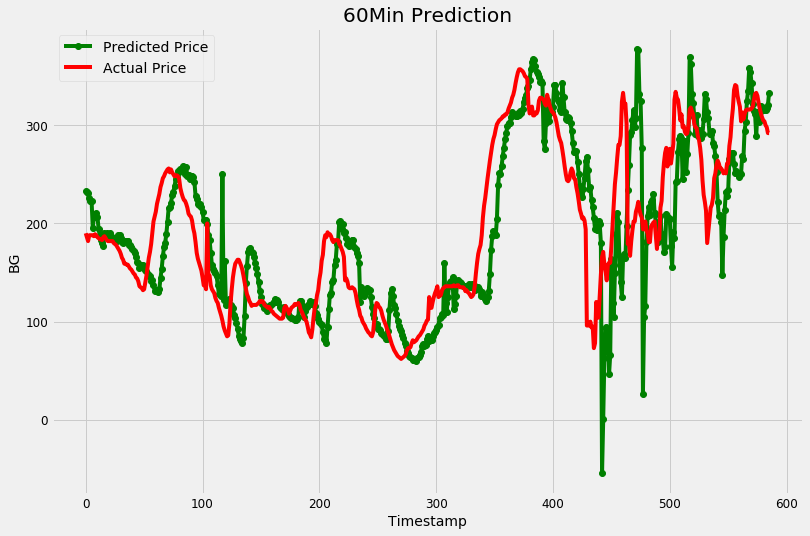

In [99]:
fig = plt.figure(figsize=(12,8))

# --------------------- Actual vs. Predicted --------------------------
#axes[0].plot(train, color='blue', label='Training Data')
plt.plot(forecasts_60, color='green', marker='o',
             label='Predicted Price')

plt.plot(test, color='red', label='Actual Price')
plt.title('60Min Prediction')
plt.xlabel('Timestamp')
plt.ylabel('BG')

#axes[0].set_xticks(np.arange(0, 7982, 1300).tolist(), df['Date'][0:7982:1300].tolist())
plt.legend()

#RMSE 13정도였음 
